In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm, tqdm_notebook, notebook

In [1]:
import sys
sys.path.append(r'C:\Users\PF4AA\OneDrive\Documents\Self Learning\Personal_porto\Python Reusable Module')
import eda
import data_preprocessing
import classification_modelling

In [3]:
df = pd.read_csv('divorce_data.csv', sep=';')
df

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,...,Q46,Q47,Q48,Q49,Q50,Q51,Q52,Q53,Q54,Divorce
0,2,2,4,1,0,0,0,0,0,0,...,2,1,3,3,3,2,3,2,1,1
1,4,4,4,4,4,0,0,4,4,4,...,2,2,3,4,4,4,4,2,2,1
2,2,2,2,2,1,3,2,1,1,2,...,3,2,3,1,1,1,2,2,2,1
3,3,2,3,2,3,3,3,3,3,3,...,2,2,3,3,3,3,2,2,2,1
4,2,2,1,1,1,1,0,0,0,0,...,2,1,2,3,2,2,2,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,0,0,0,0,0,0,0,0,0,0,...,1,0,4,1,1,4,2,2,2,0
166,0,0,0,0,0,0,0,0,0,0,...,4,1,2,2,2,2,3,2,2,0
167,1,1,0,0,0,0,0,0,0,1,...,3,0,2,0,1,1,3,0,0,0
168,0,0,0,0,0,0,0,0,0,0,...,3,3,2,2,3,2,4,3,1,0


In [4]:
ref = pd.read_csv('reference.tsv', sep='|')
ref

,atribute_id,description
0,1,If one of us apologizes when our discussion de...
1,2,"I know we can ignore our differences, even if ..."
2,3,"When we need it, we can take our discussions w..."
3,4,"When I discuss with my spouse, to contact him ..."
4,5,The time I spent with my wife is special for us.
5,6,We don't have time at home as partners.
6,7,We are like two strangers who share the same e...
7,8,I enjoy our holidays with my wife.
8,9,I enjoy traveling with my wife.
9,10,Most of our goals are common to my spouse.


In [5]:
ref[ref['atribute_id']==1]

,atribute_id,description
0,1,If one of us apologizes when our discussion de...


C:\Users\PF4AA\AppData\Local\Temp\ipykernel_35944\1004921282.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for col in tqdm_notebook(df.columns) :


  0%|          | 0/55 [00:00<?, ?it/s]

,atribute_id,description
0,1,If one of us apologizes when our discussion de...


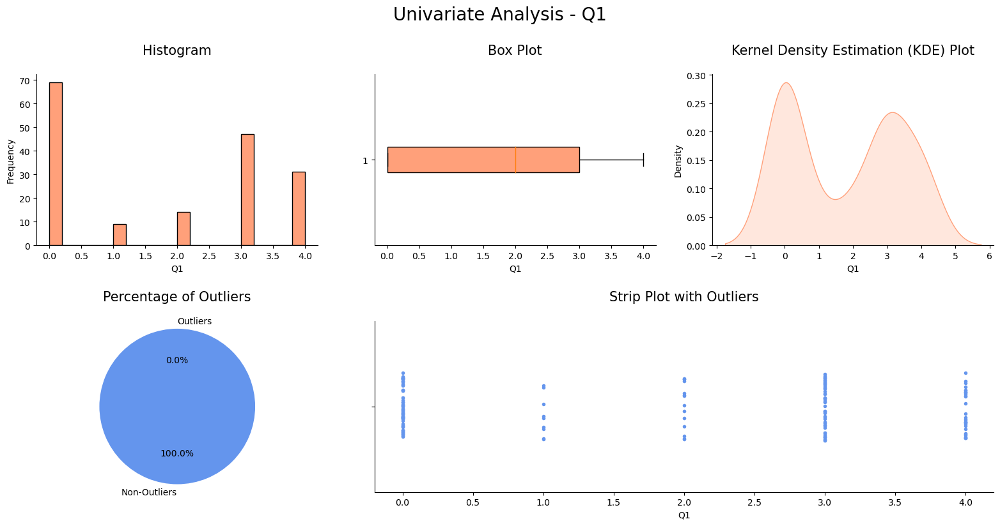

,atribute_id,description
1,2,"I know we can ignore our differences, even if ..."


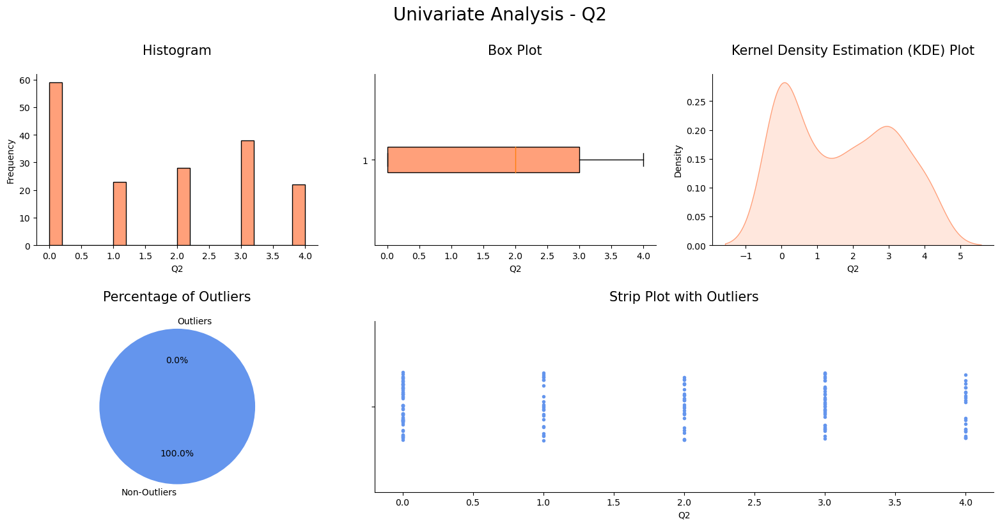

,atribute_id,description
2,3,"When we need it, we can take our discussions w..."


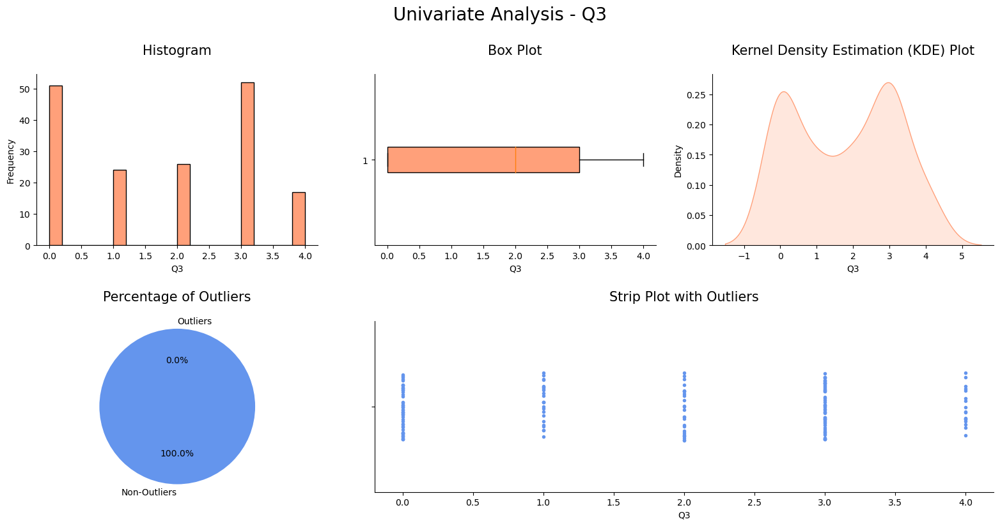

,atribute_id,description
3,4,"When I discuss with my spouse, to contact him ..."


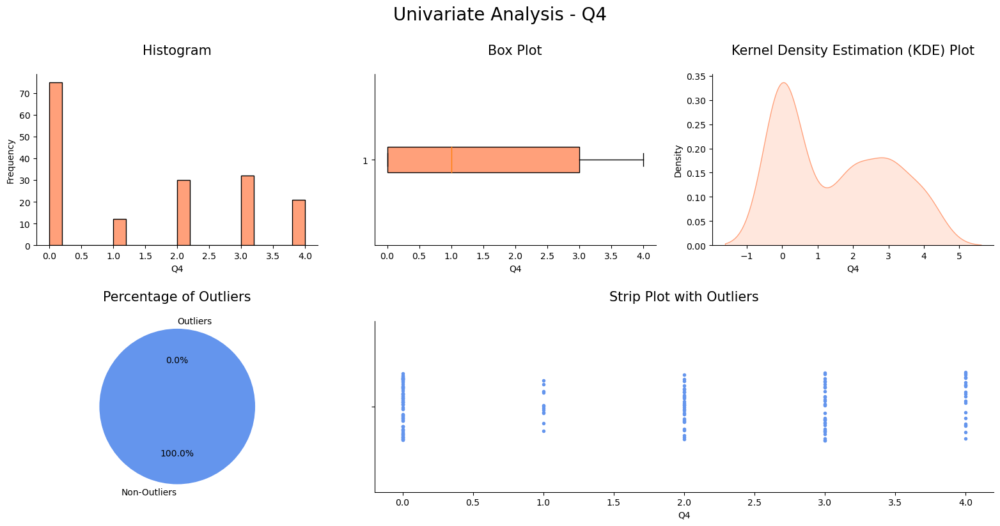

,atribute_id,description
4,5,The time I spent with my wife is special for us.


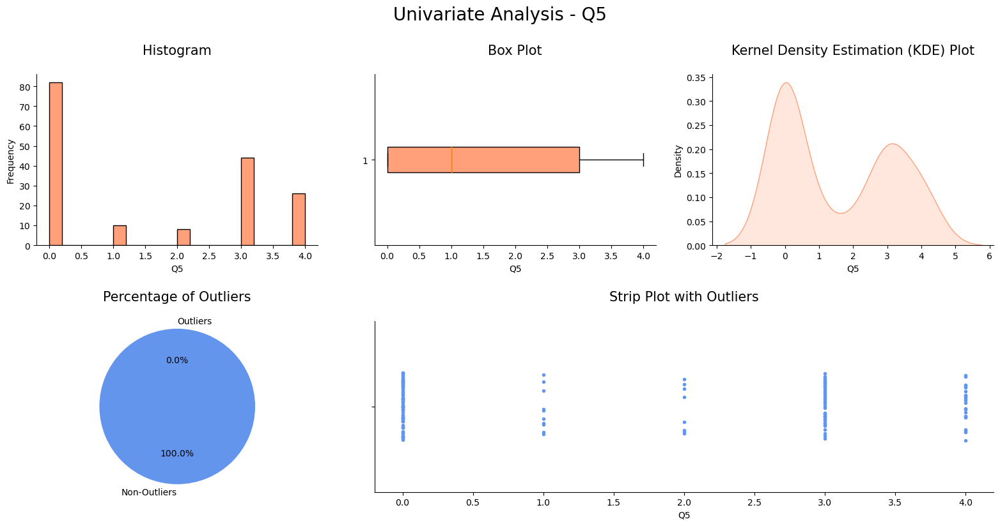

,atribute_id,description
5,6,We don't have time at home as partners.


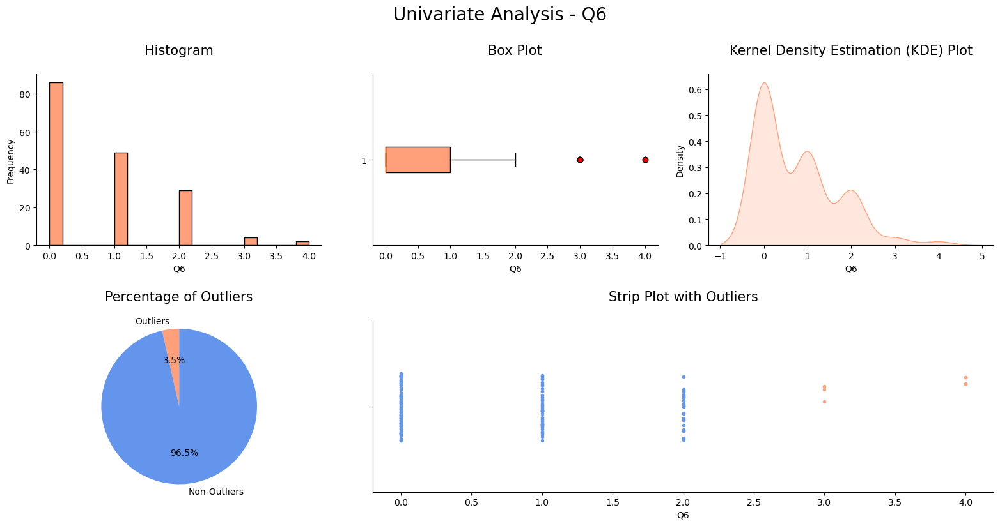

,atribute_id,description
6,7,We are like two strangers who share the same e...


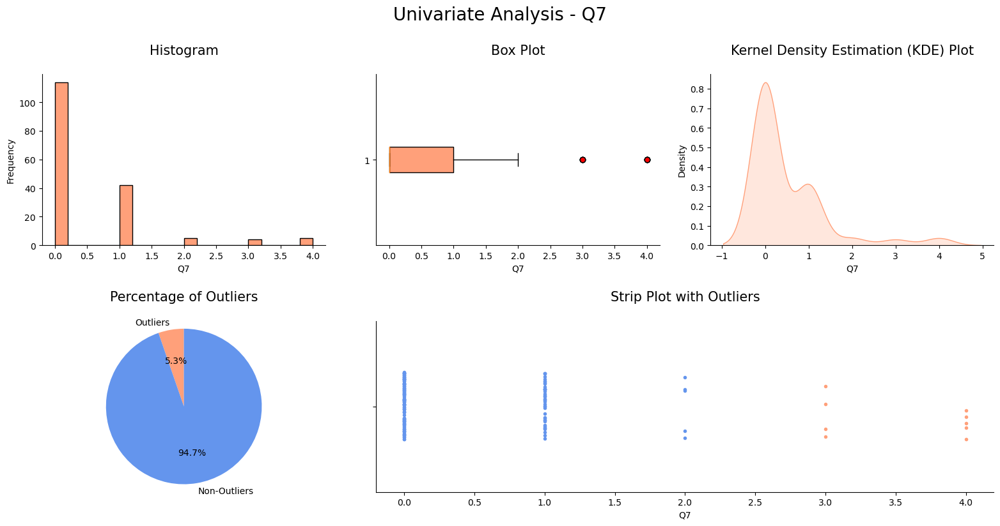

,atribute_id,description
7,8,I enjoy our holidays with my wife.


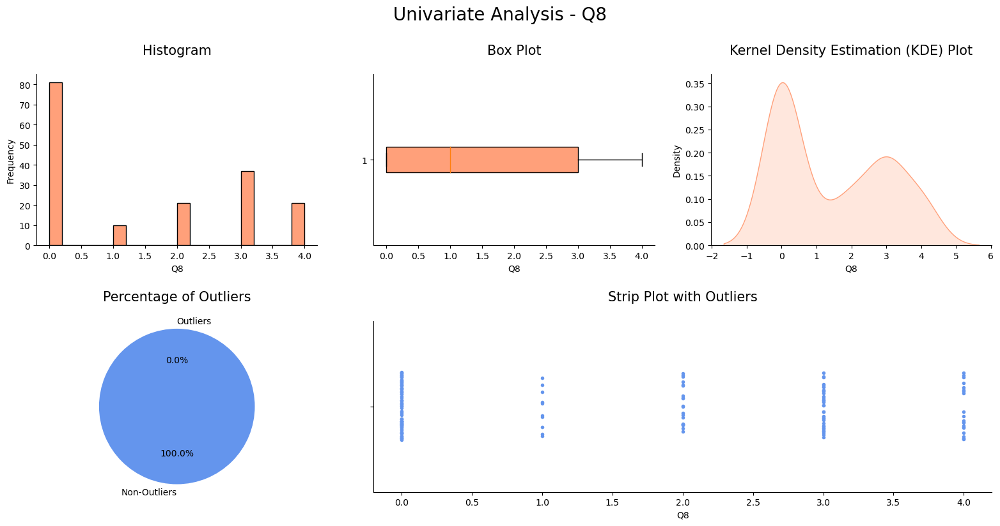

,atribute_id,description
8,9,I enjoy traveling with my wife.


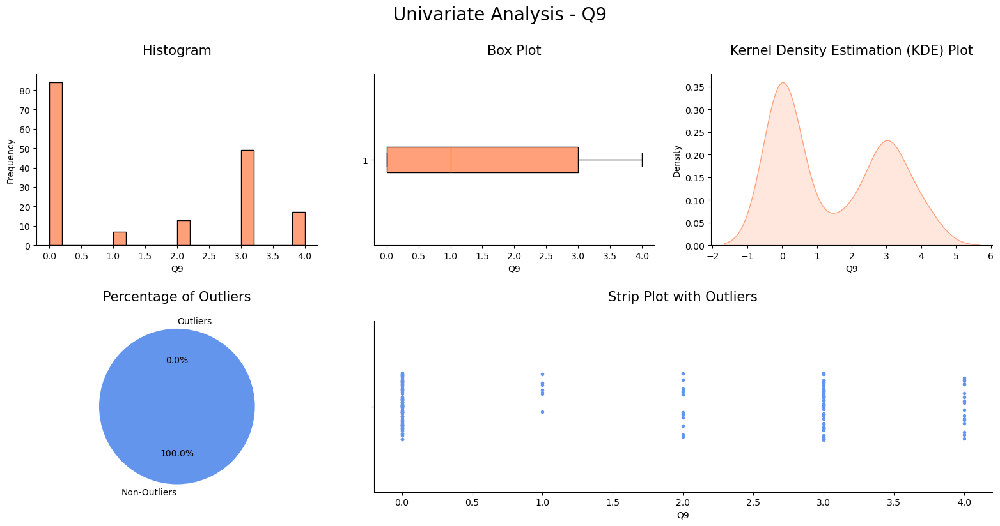

,atribute_id,description
9,10,Most of our goals are common to my spouse.


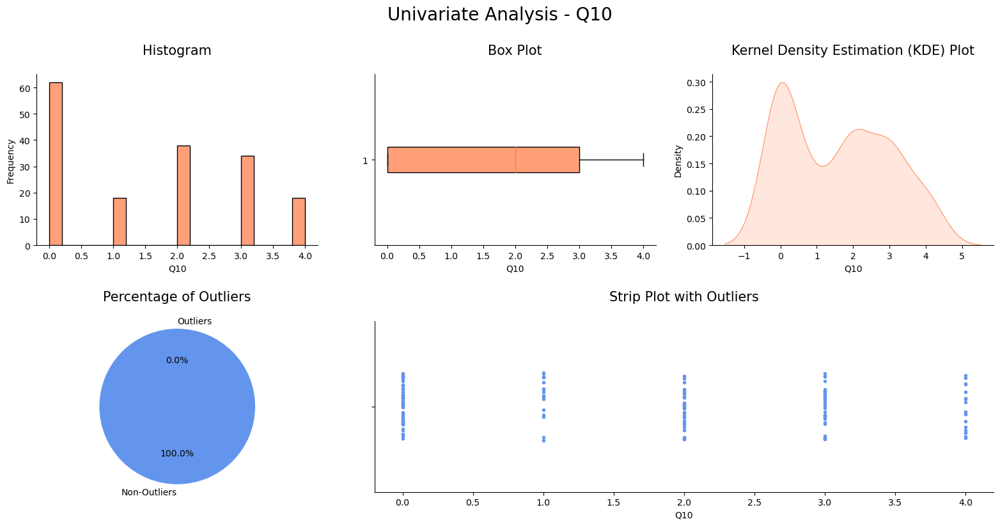

,atribute_id,description
10,11,"I think that one day in the future, when I loo..."


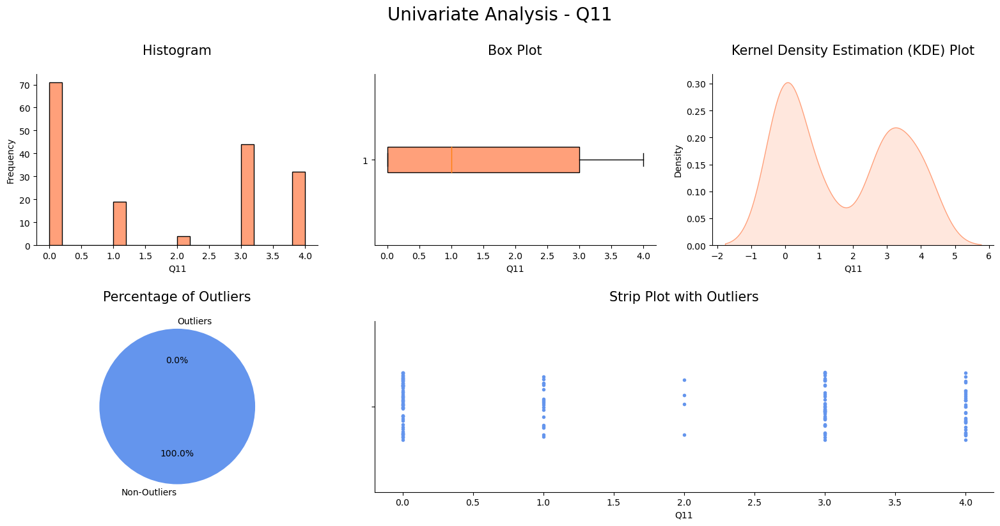

,atribute_id,description
11,12,My spouse and I have similar values in terms o...


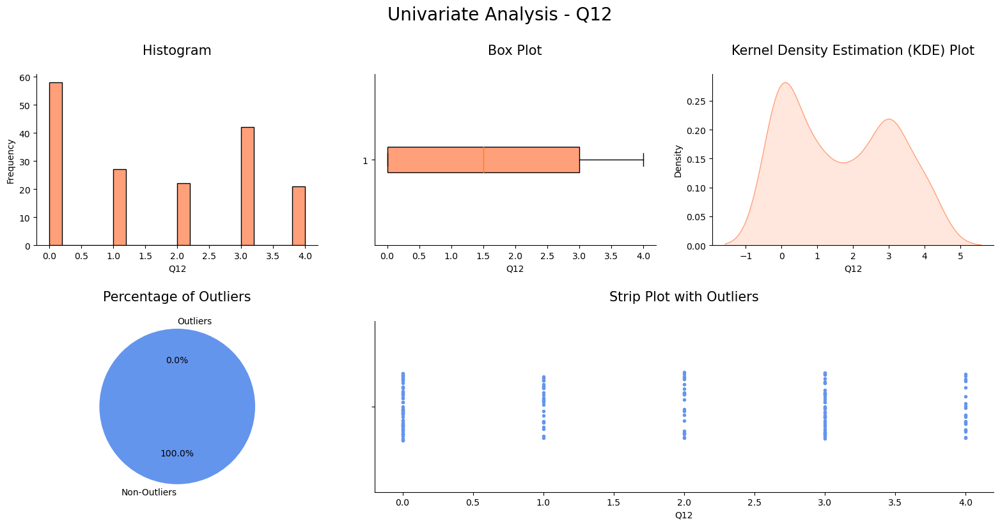

,atribute_id,description
12,13,My spouse and I have similar sense of entertai...


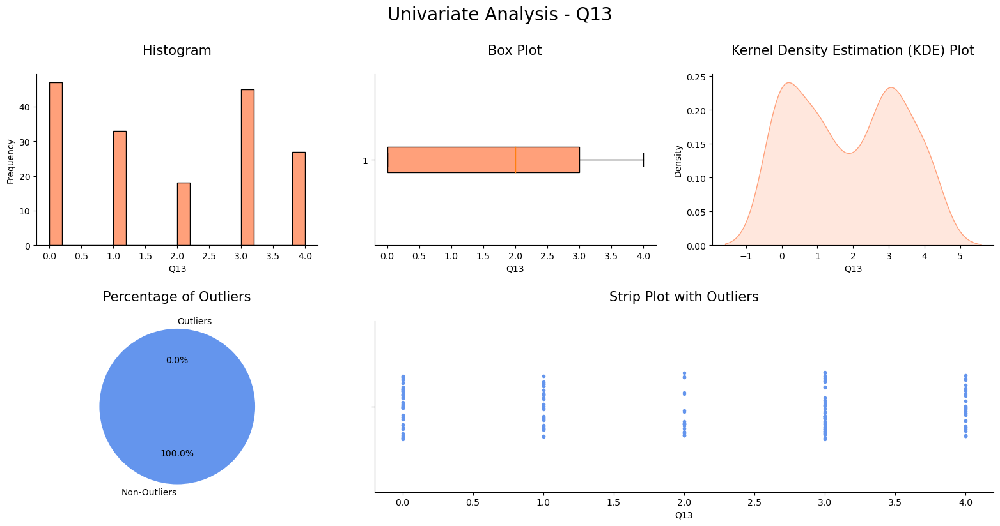

,atribute_id,description
13,14,"Most of our goals for people (children, friend..."


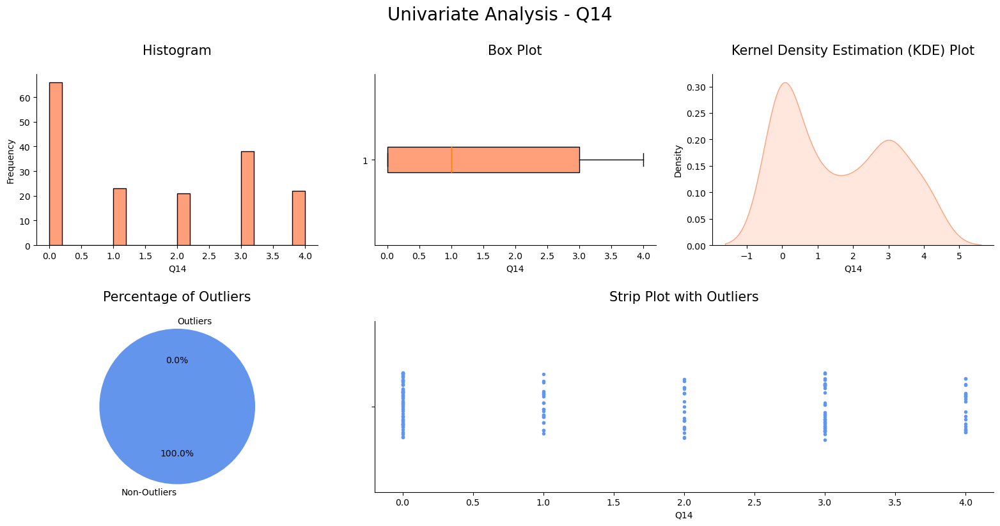

,atribute_id,description
14,15,Our dreams with my spouse are similar and harm...


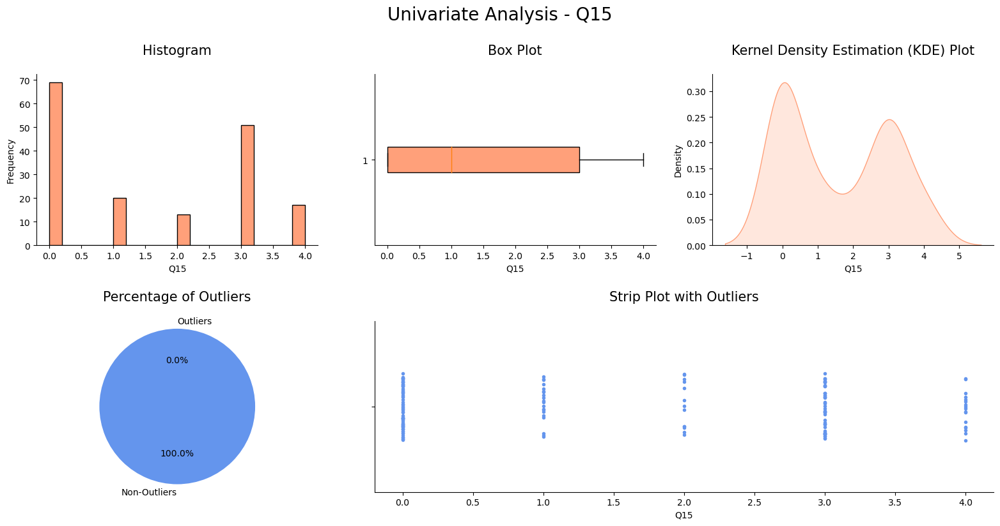

,atribute_id,description
15,16,We're compatible with my spouse about what lov...


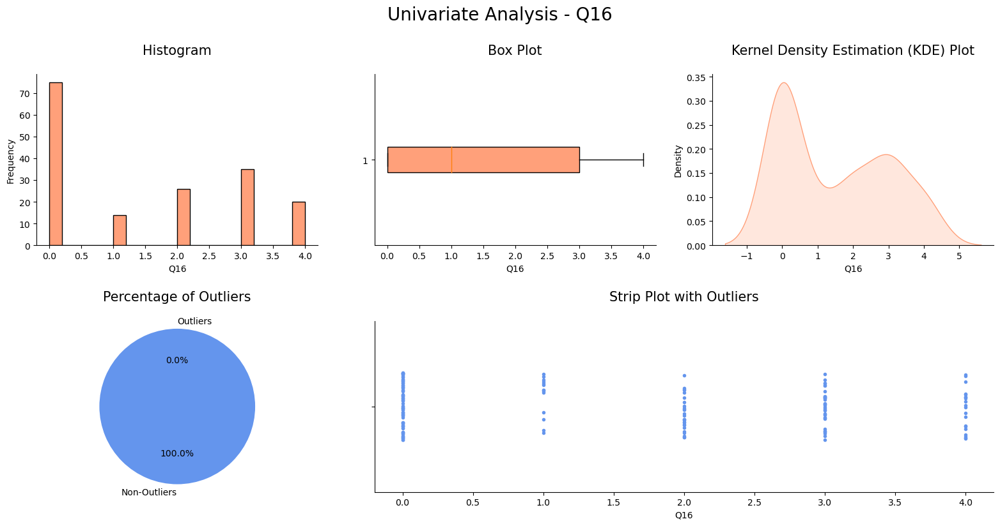

,atribute_id,description
16,17,We share the same views about being happy in o...


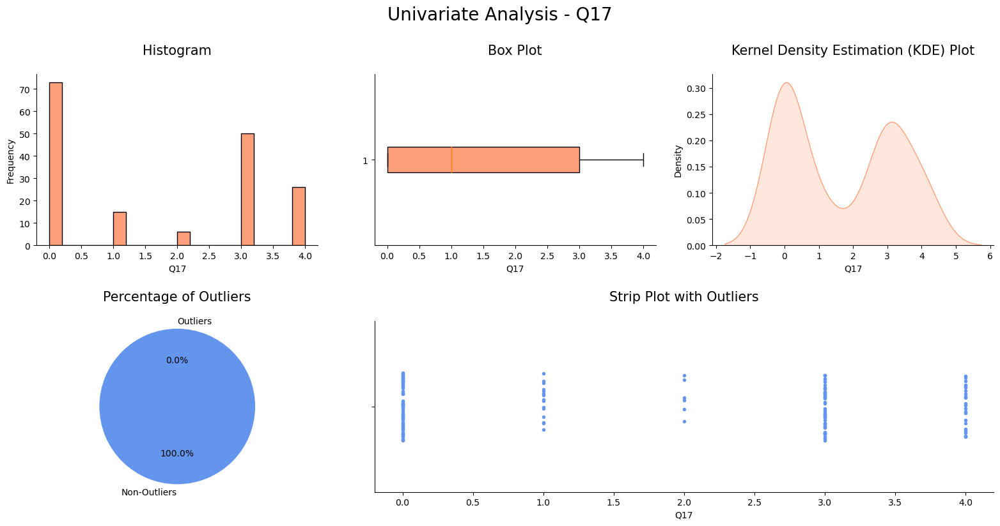

,atribute_id,description
17,18,My spouse and I have similar ideas about how m...


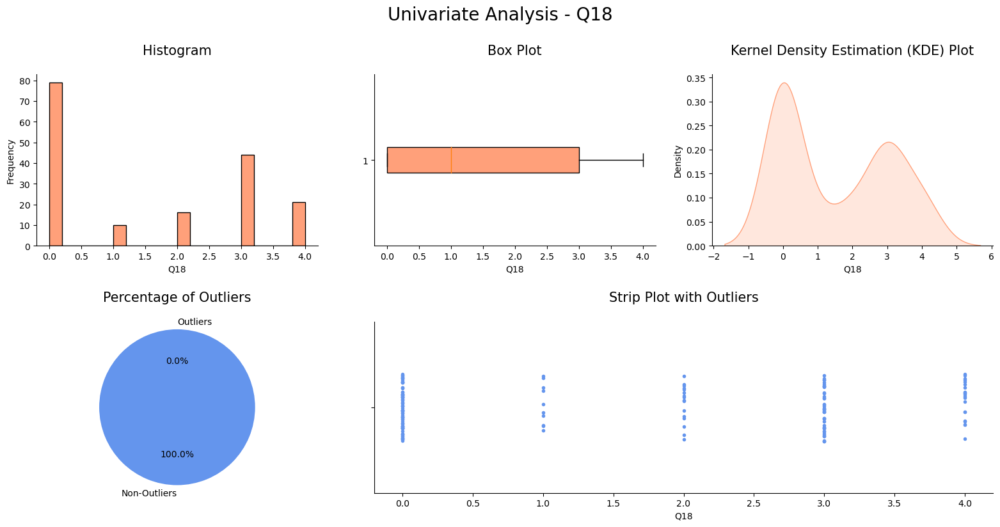

,atribute_id,description
18,19,My spouse and I have similar ideas about how r...


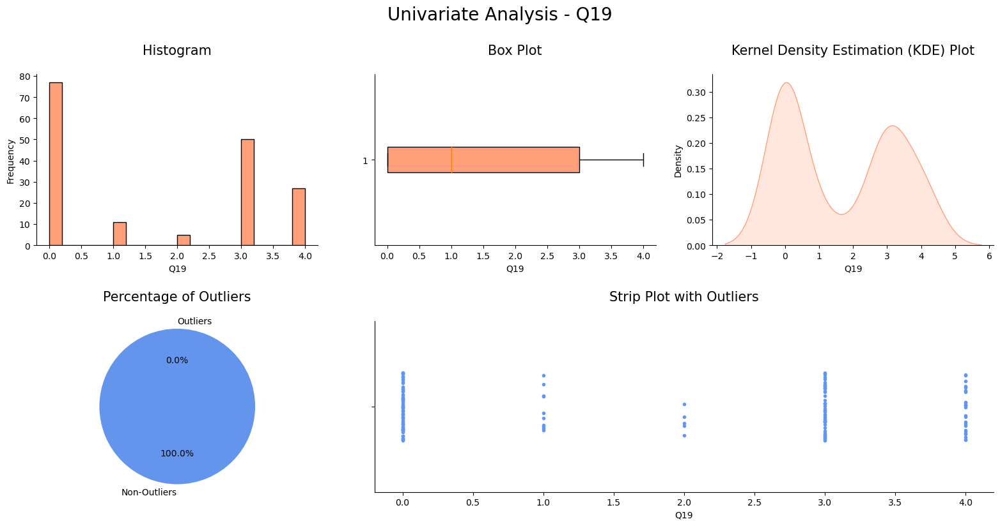

,atribute_id,description
19,20,My spouse and I have similar values in trust.


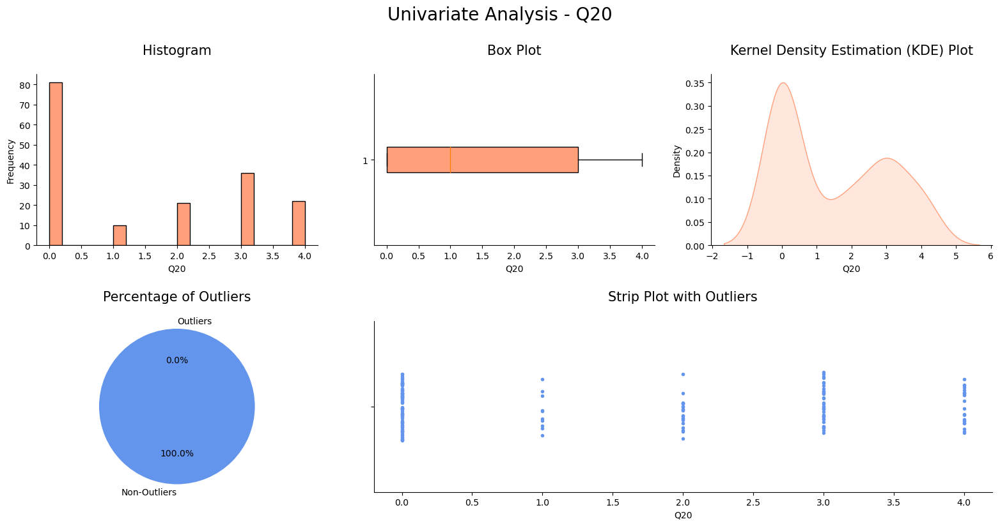

,atribute_id,description
20,21,I know exactly what my wife likes.


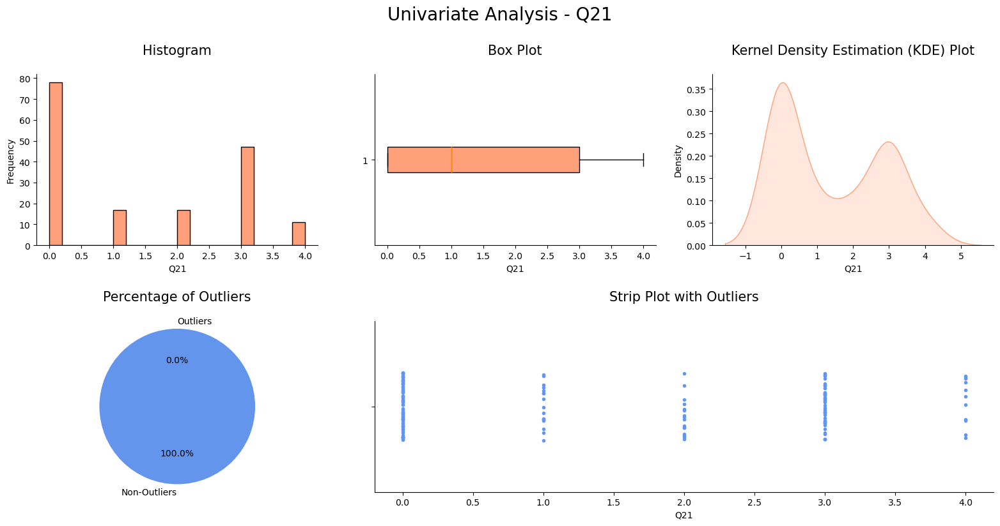

,atribute_id,description
21,22,I know how my spouse wants to be taken care of...


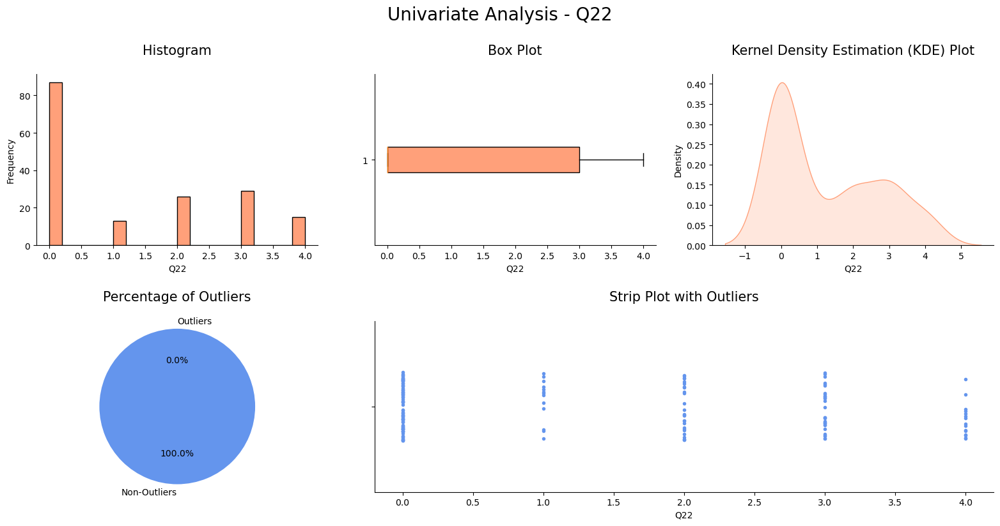

,atribute_id,description
22,23,I know my spouse's favorite food.


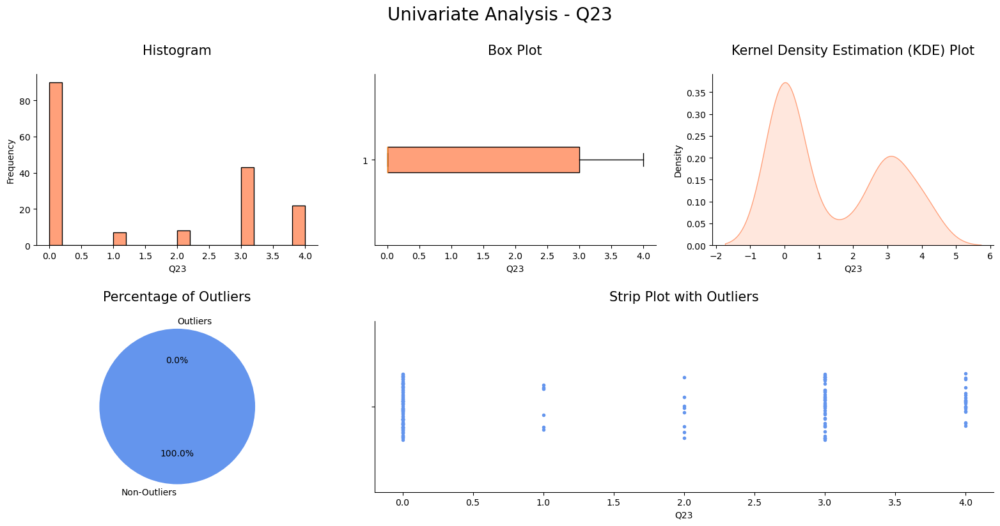

,atribute_id,description
23,24,I can tell you what kind of stress my spouse i...


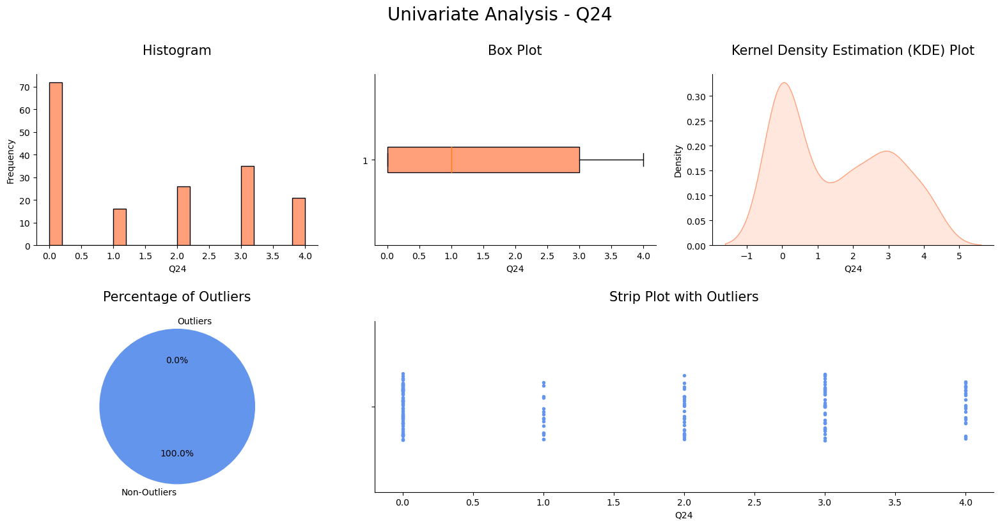

,atribute_id,description
24,25,I have knowledge of my spouse's inner world.


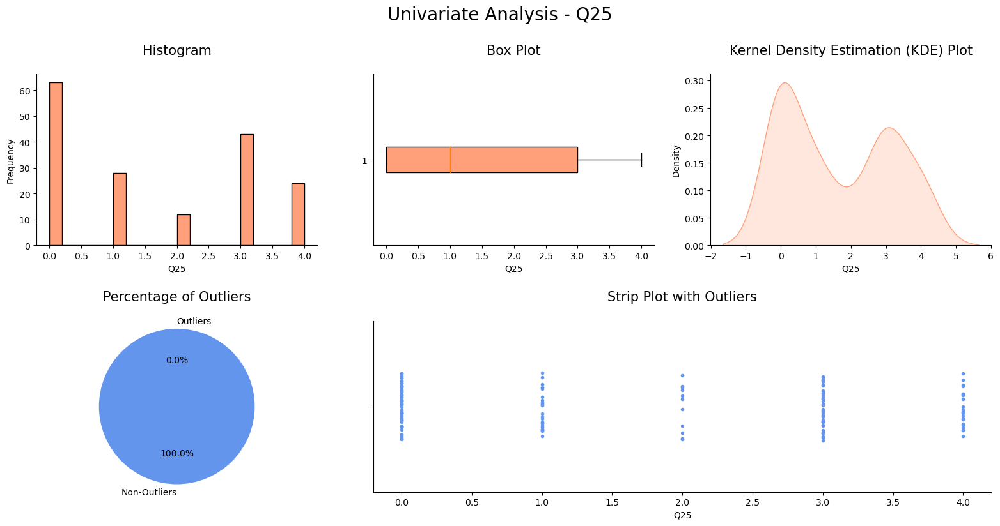

,atribute_id,description
25,26,I know my spouse's basic anxieties.


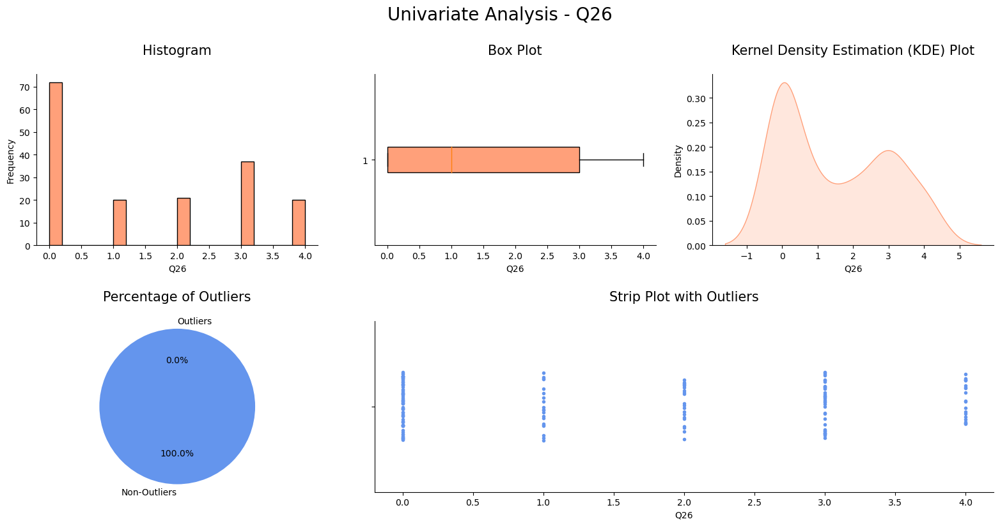

,atribute_id,description
26,27,I know what my spouse's current sources of str...


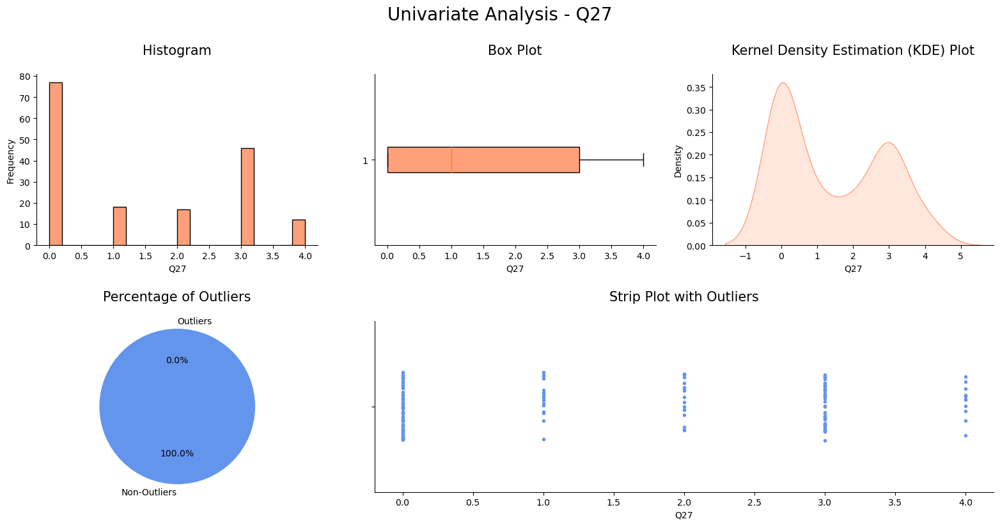

,atribute_id,description
27,28,I know my spouse's hopes and wishes.


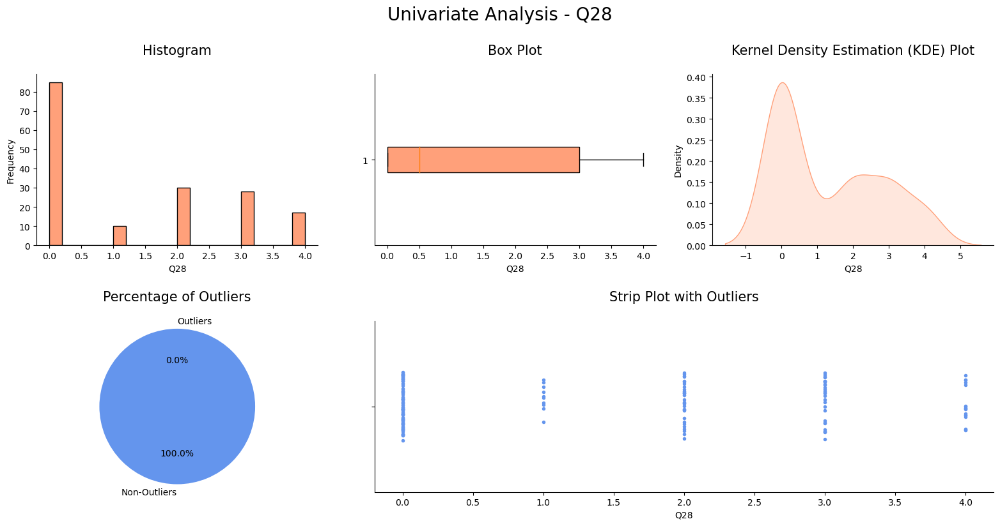

,atribute_id,description
28,29,I know my spouse very well.


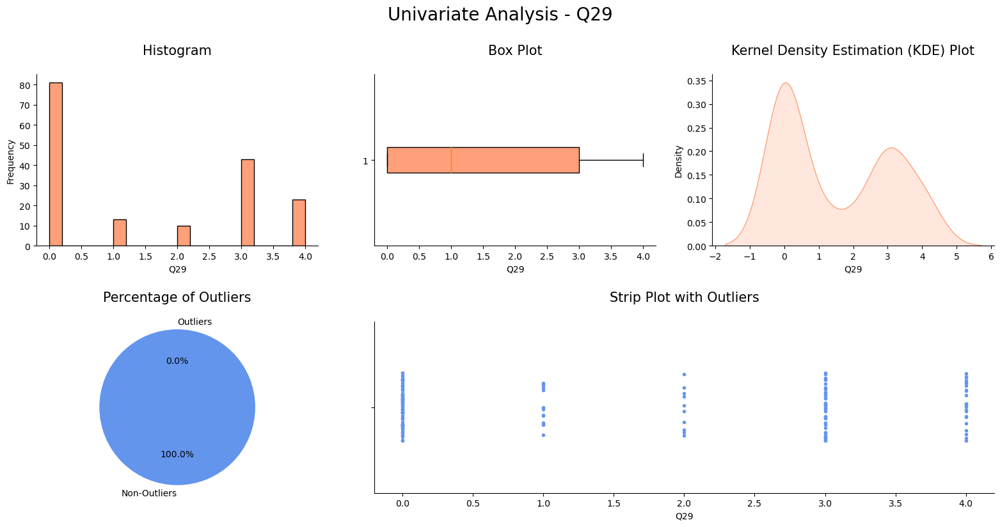

,atribute_id,description
29,30,I know my spouse's friends and their social re...


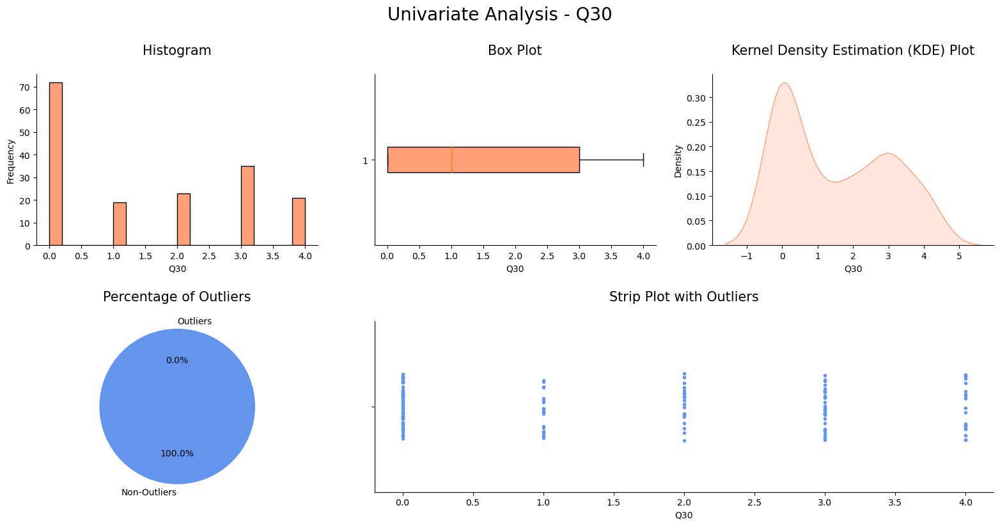

,atribute_id,description
30,31,I feel aggressive when I argue with my spouse.


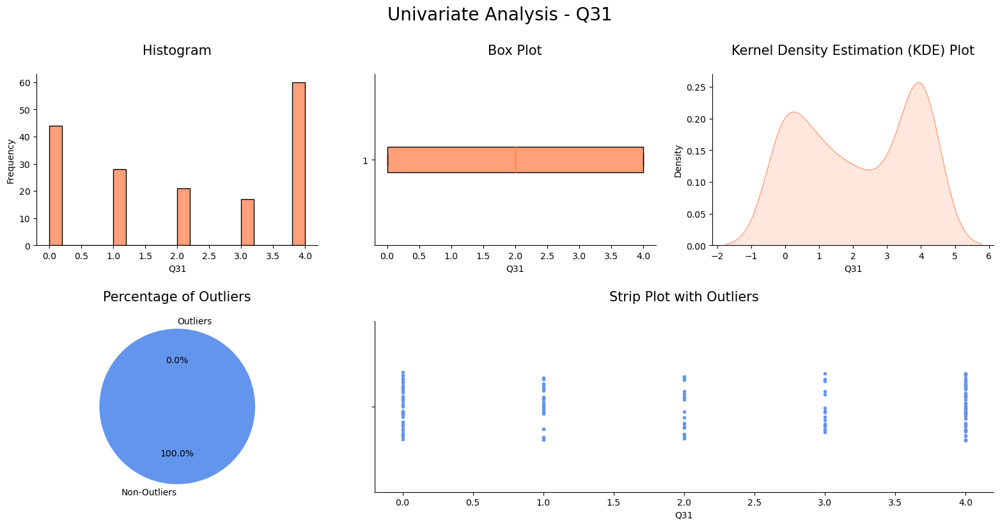

,atribute_id,description
31,32,"When discussing with my spouse, I usually use ..."


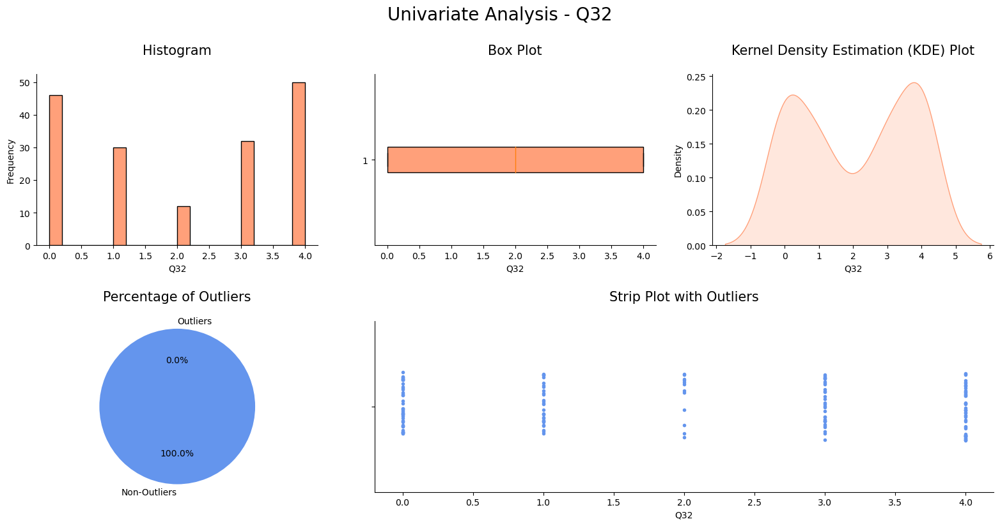

,atribute_id,description
32,33,I can use negative statements about my spouse'...


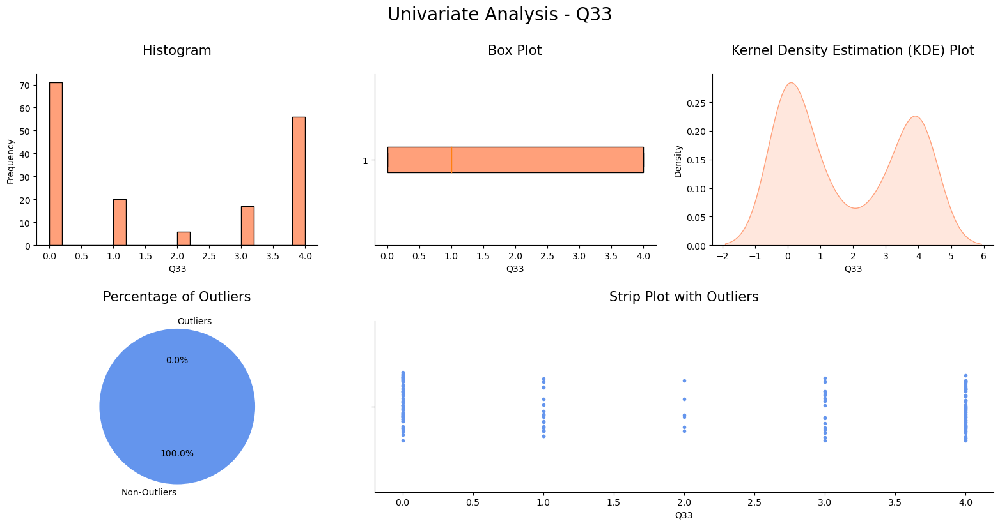

,atribute_id,description
33,34,I can use offensive expressions during our dis...


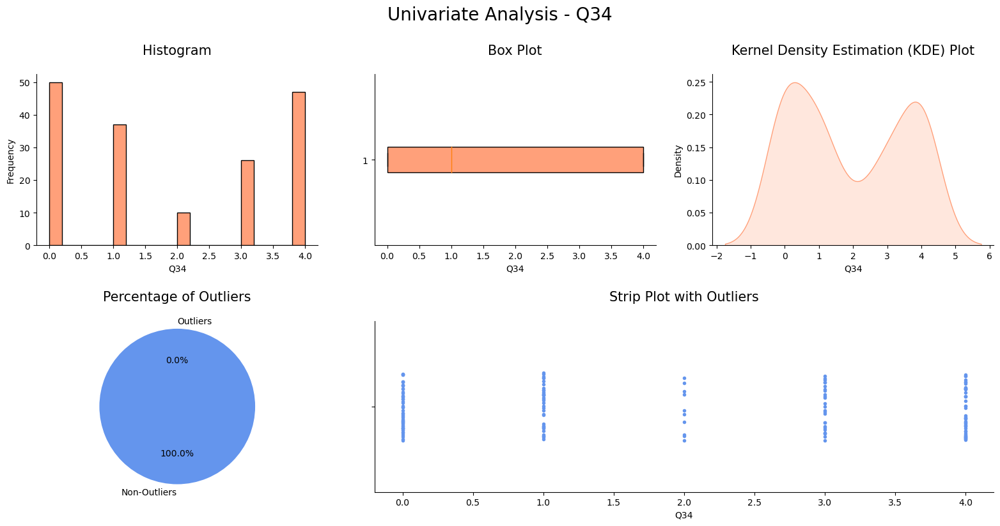

,atribute_id,description
34,35,I can insult my spouse during our discussions.


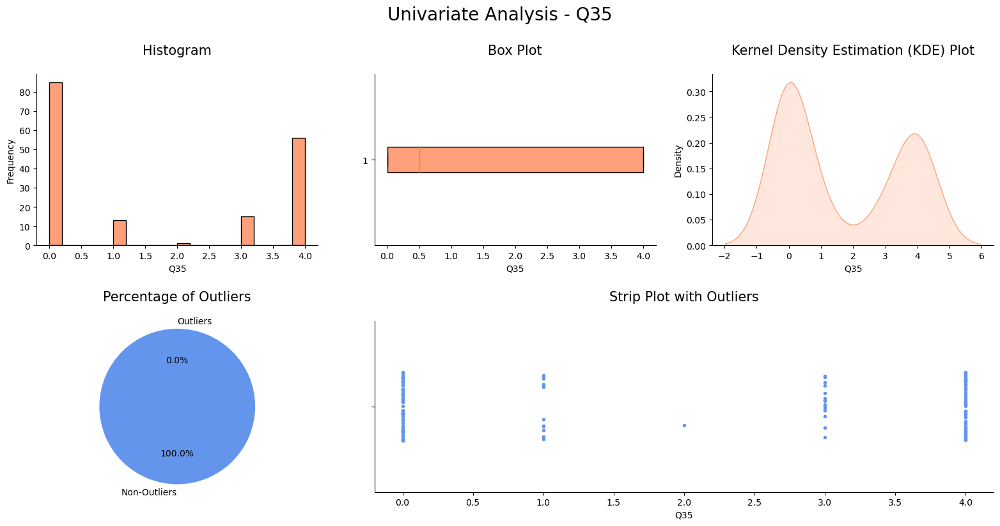

,atribute_id,description
35,36,I can be humiliating when we discussions.


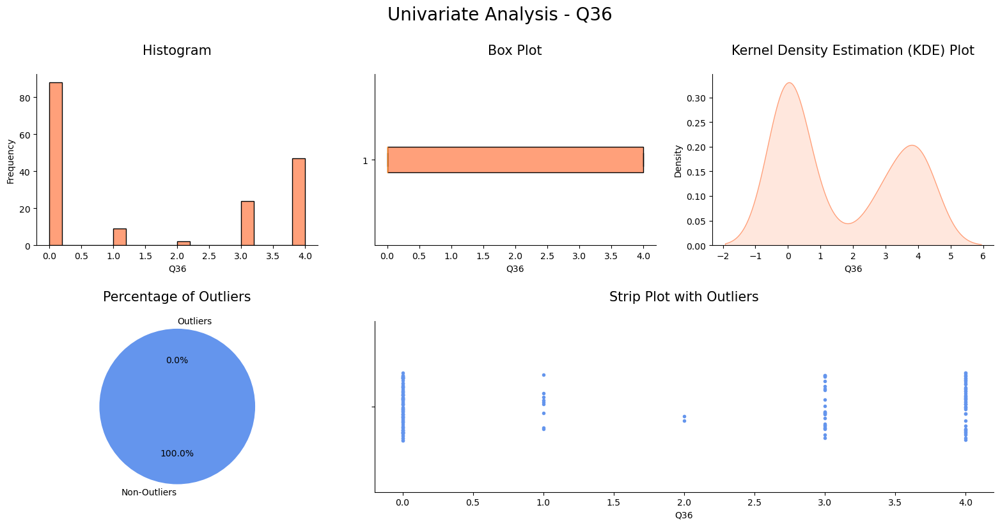

,atribute_id,description
36,37,My discussion with my spouse is not calm.


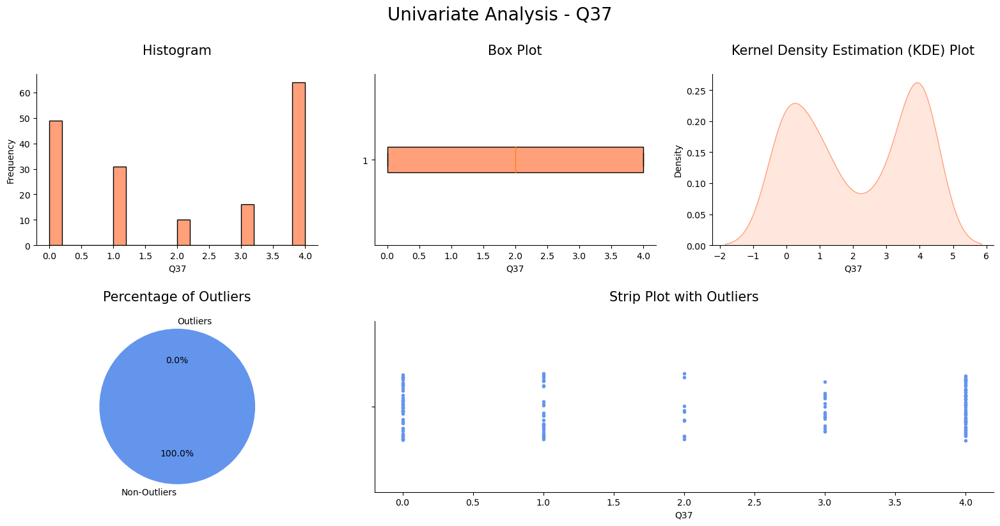

,atribute_id,description
37,38,I hate my spouse's way of open a subject.


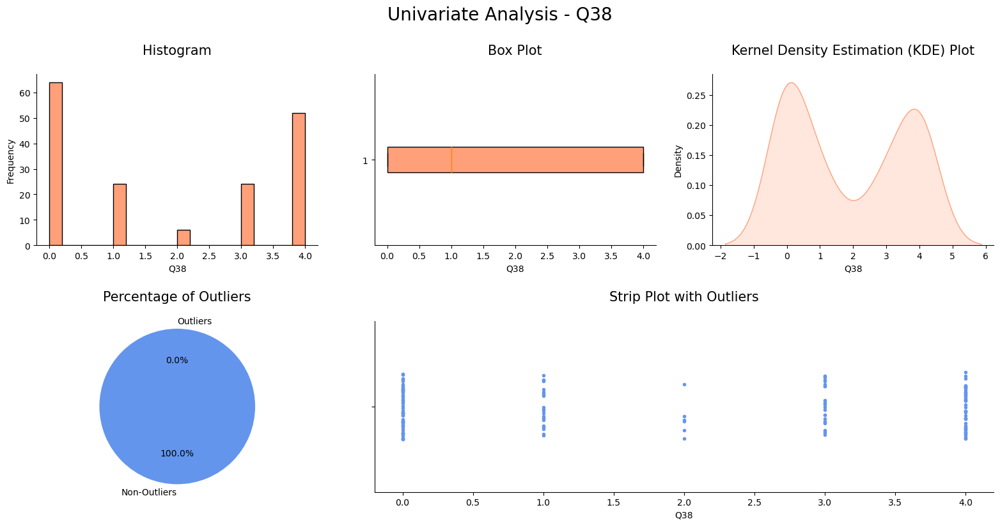

,atribute_id,description
38,39,Our discussions often occur suddenly.


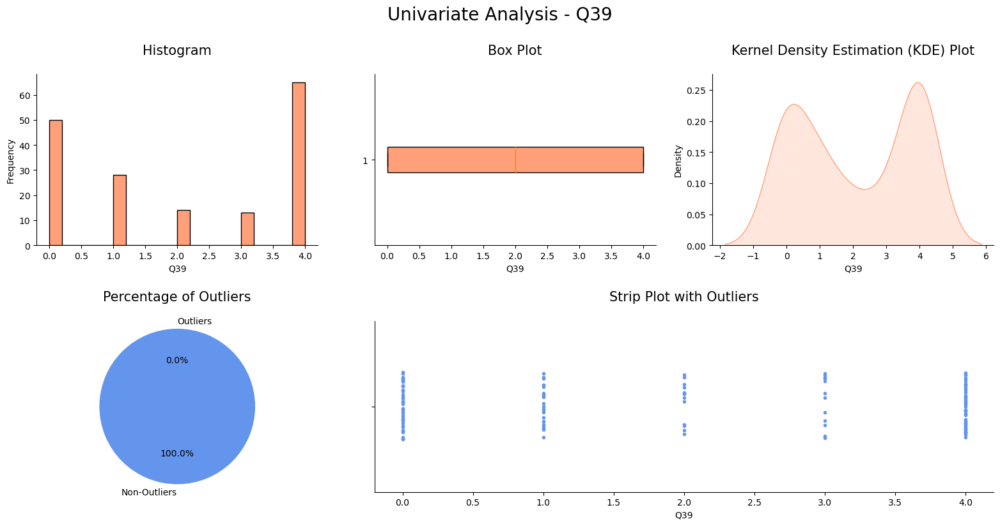

,atribute_id,description
39,40,We're just starting a discussion before I know...


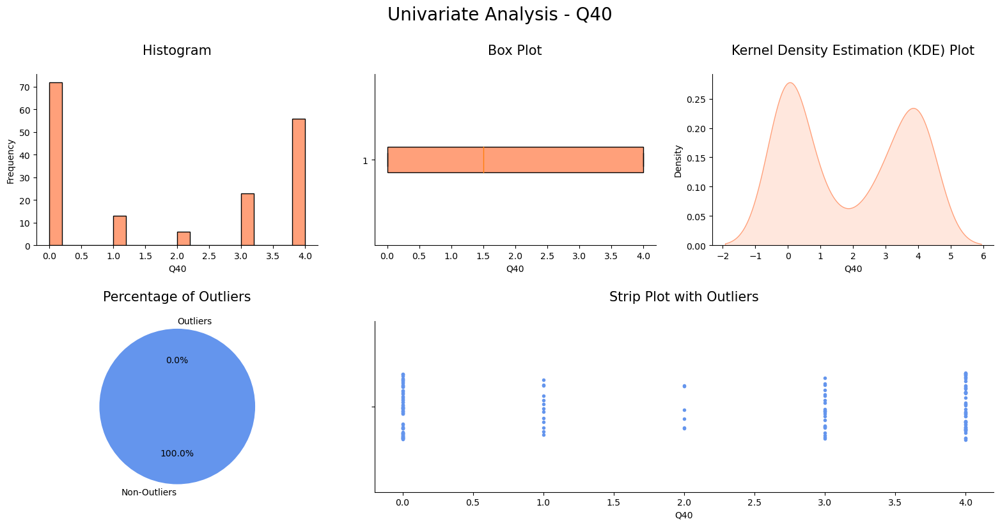

,atribute_id,description
40,41,"When I talk to my spouse about something, my c..."


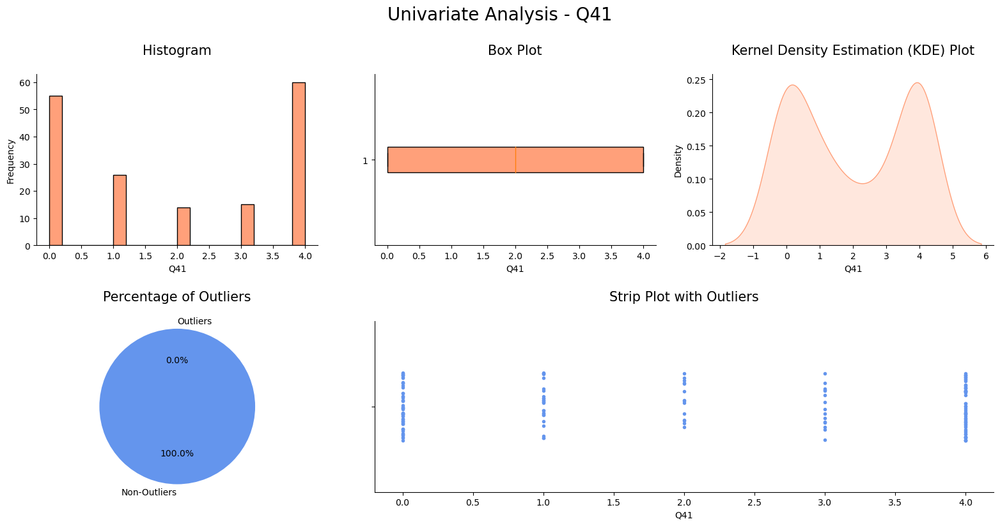

,atribute_id,description
41,42,"When I argue with my spouse, ı only go out and..."


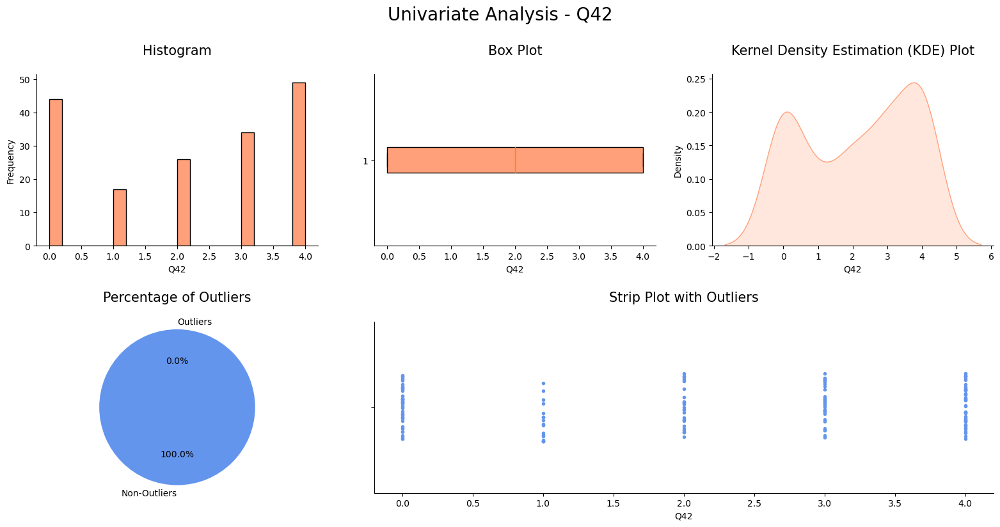

,atribute_id,description
42,43,I mostly stay silent to calm the environment a...


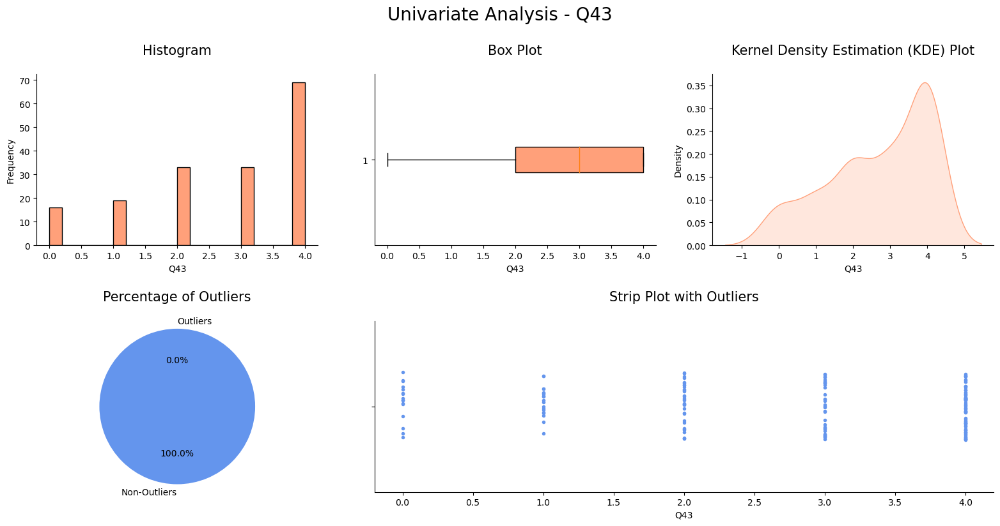

,atribute_id,description
43,44,Sometimes I think it's good for me to leave ho...


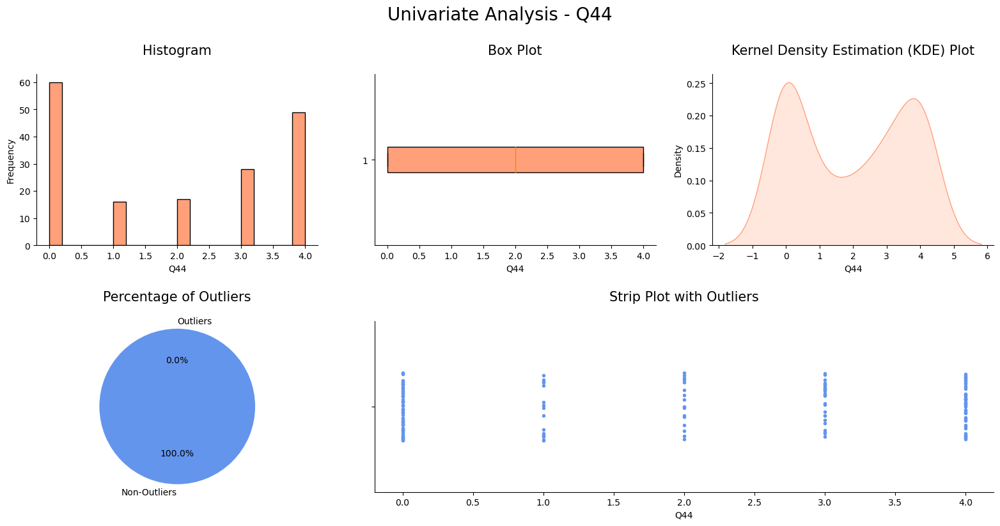

,atribute_id,description
44,45,I'd rather stay silent than discuss with my sp...


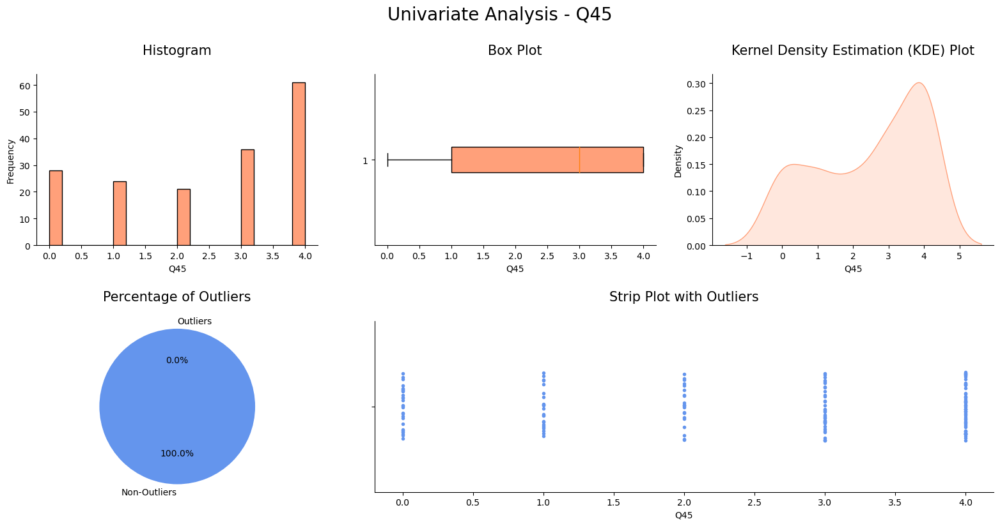

,atribute_id,description
45,46,"Even if I'm right in the discussion, I stay si..."


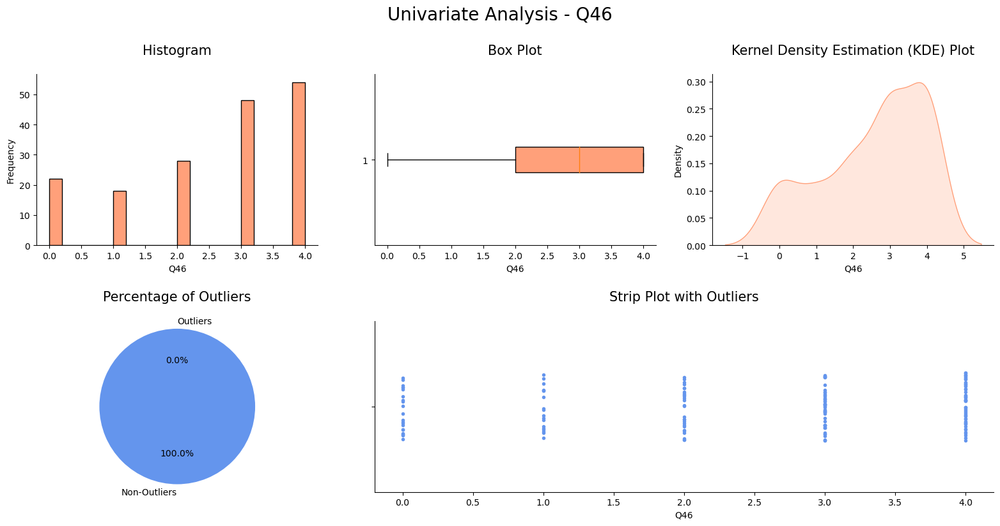

,atribute_id,description
46,47,"When I discuss with my spouse, I stay silent b..."


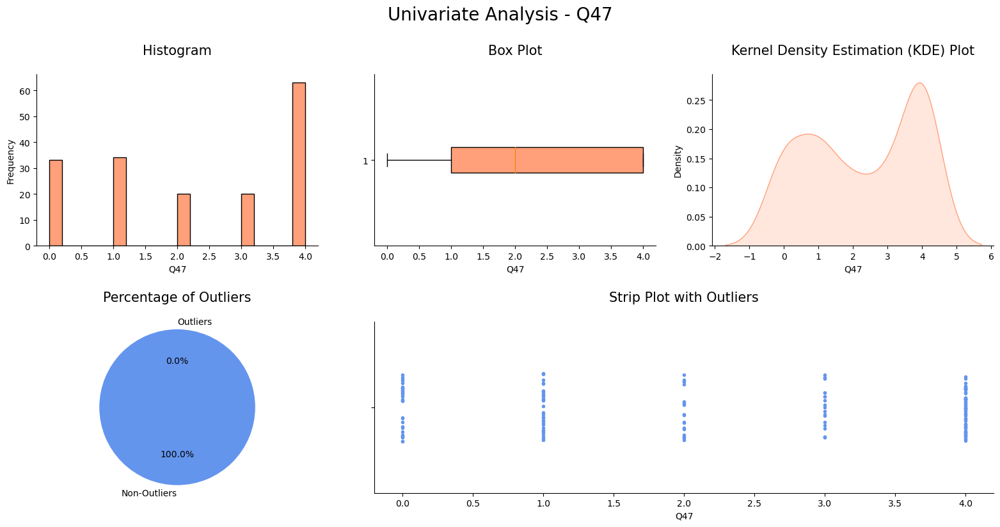

,atribute_id,description
47,48,I feel right in our discussions.


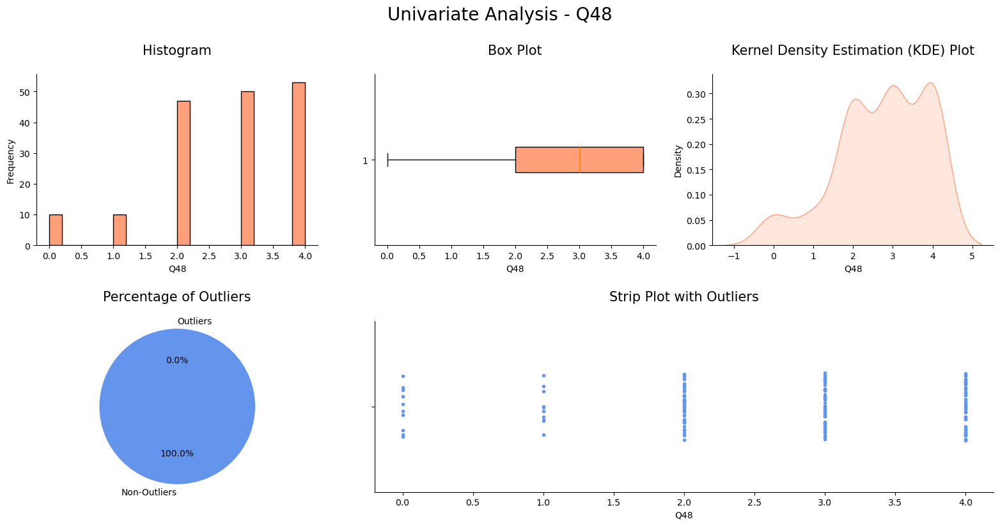

,atribute_id,description
48,49,I have nothing to do with what I've been accus...


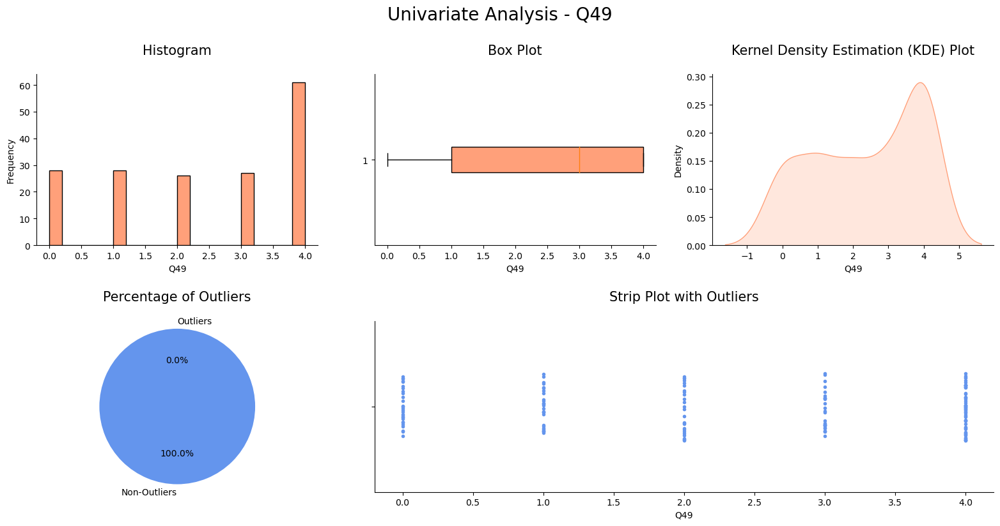

,atribute_id,description
49,50,I'm not actually the one who's guilty about wh...


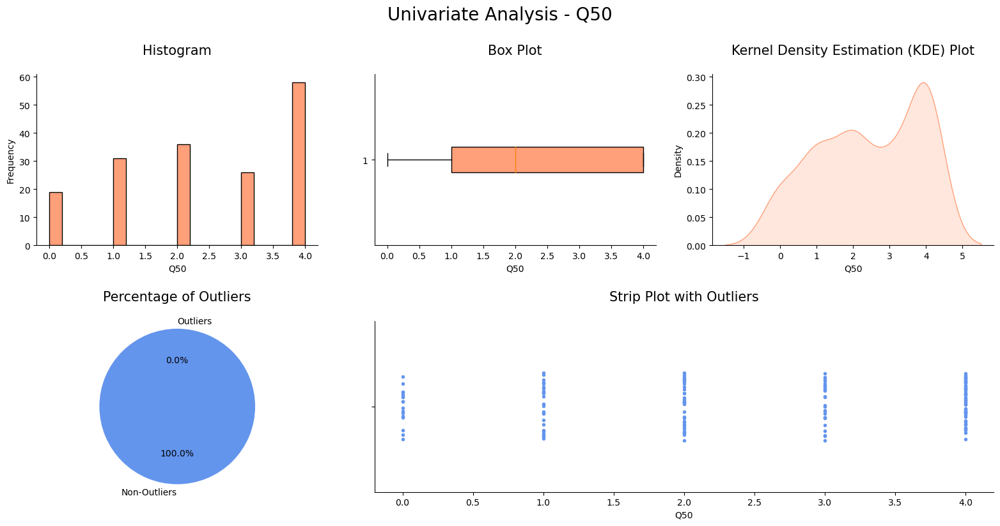

,atribute_id,description
50,51,I'm not the one who's wrong about problems at ...


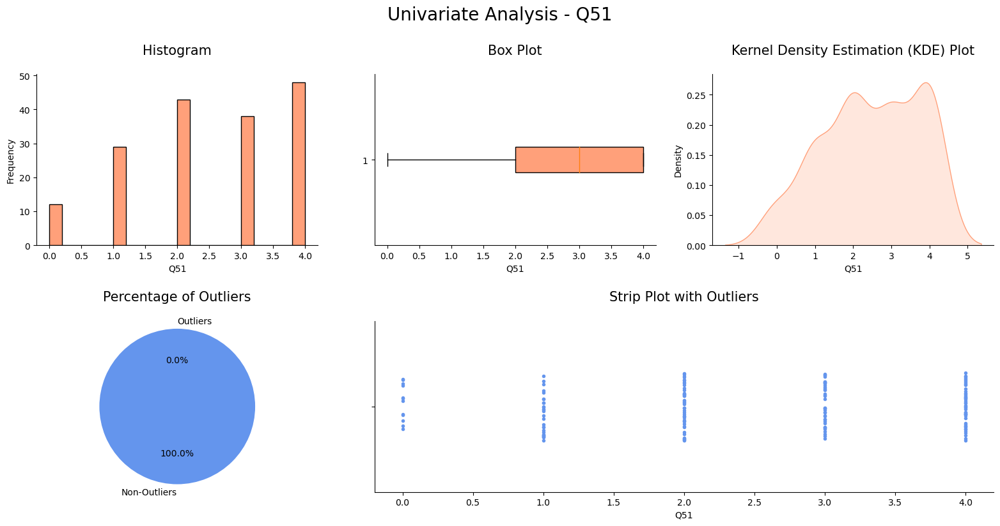

,atribute_id,description
51,52,I wouldn't hesitate to tell my spouse about he...


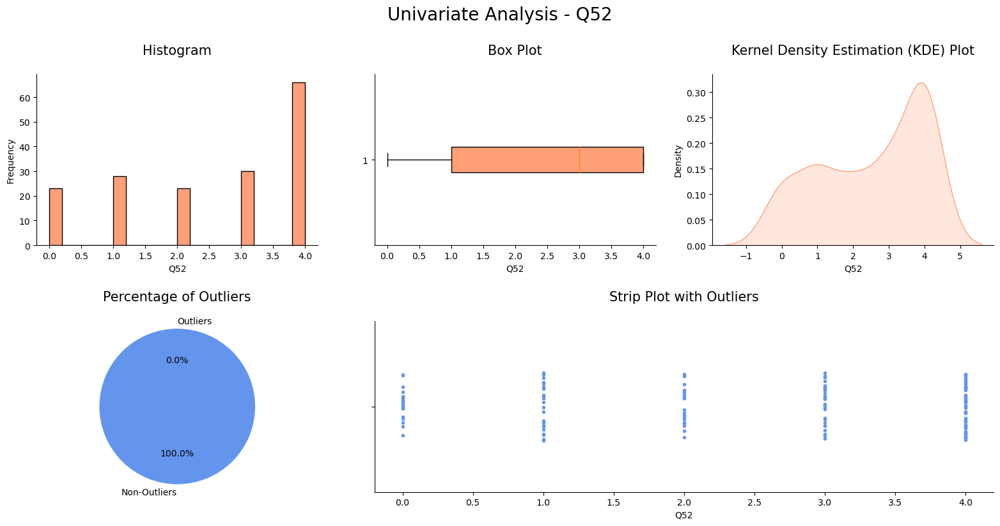

,atribute_id,description
52,53,"When I discuss, I remind my spouse of her/his ..."


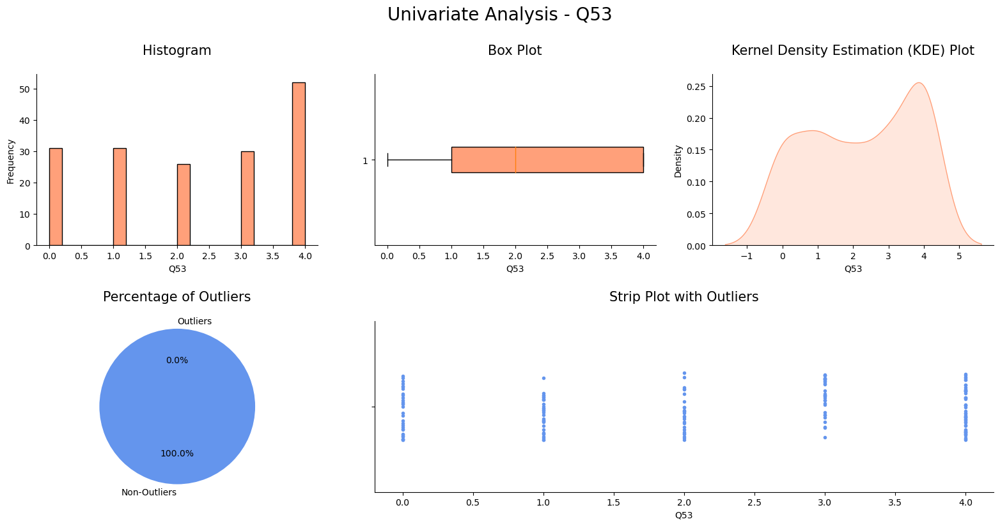

,atribute_id,description
53,54,I'm not afraid to tell my spouse about her/his...


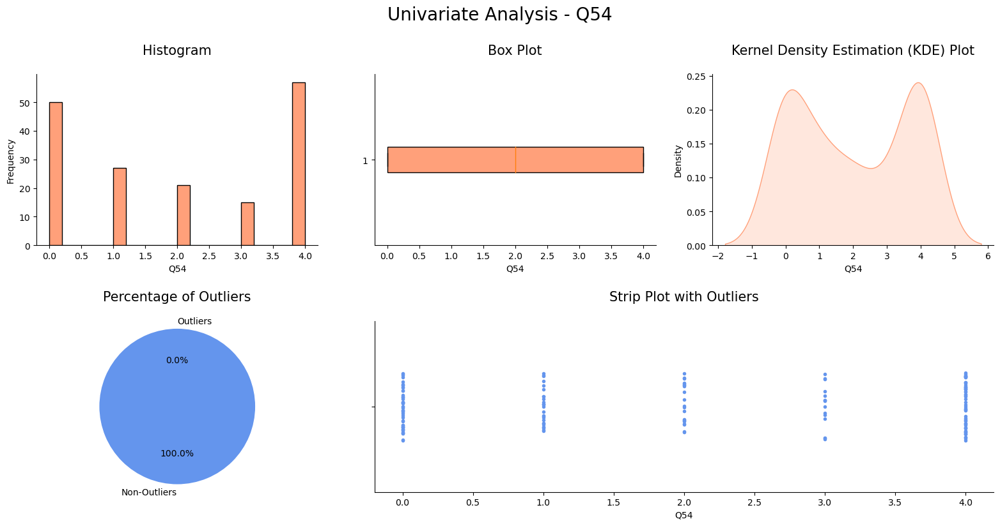

,atribute_id,description


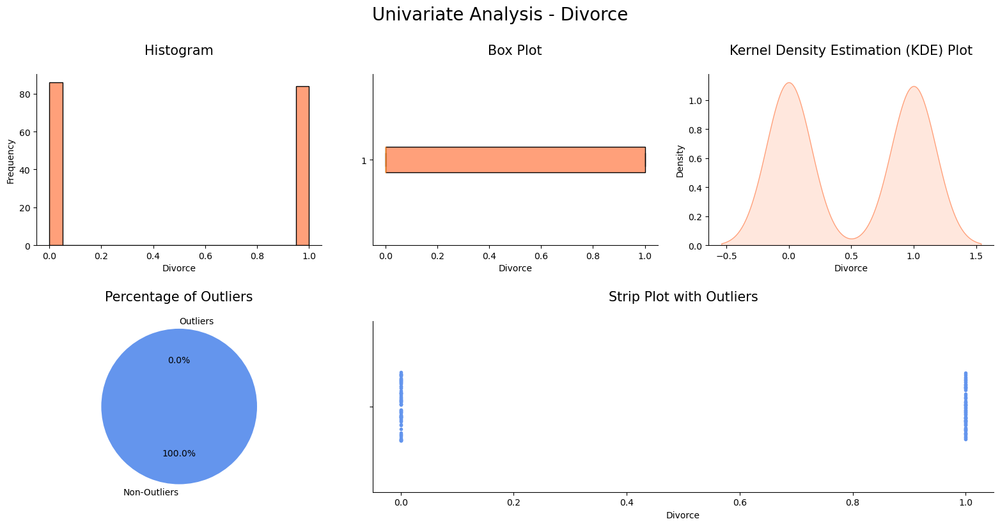

In [6]:
n = 1
for col in tqdm_notebook(df.columns) :
    display(ref[ref['atribute_id']==n])
    eda.univariate_analysis(df, col)
    n += 1

In [7]:
df2 = df.copy()

In [8]:
df2['Divorce'] = df2['Divorce'].replace({0:'Divorce', 1:'Not-Divorce'})

In [9]:
import warnings
warnings.filterwarnings("ignore")
pd.set_option('max_colwidth', None)

  0%|          | 0/54 [00:00<?, ?it/s]

,atribute_id,description
0,1,"If one of us apologizes when our discussion deteriorates, the discussion ends."


None

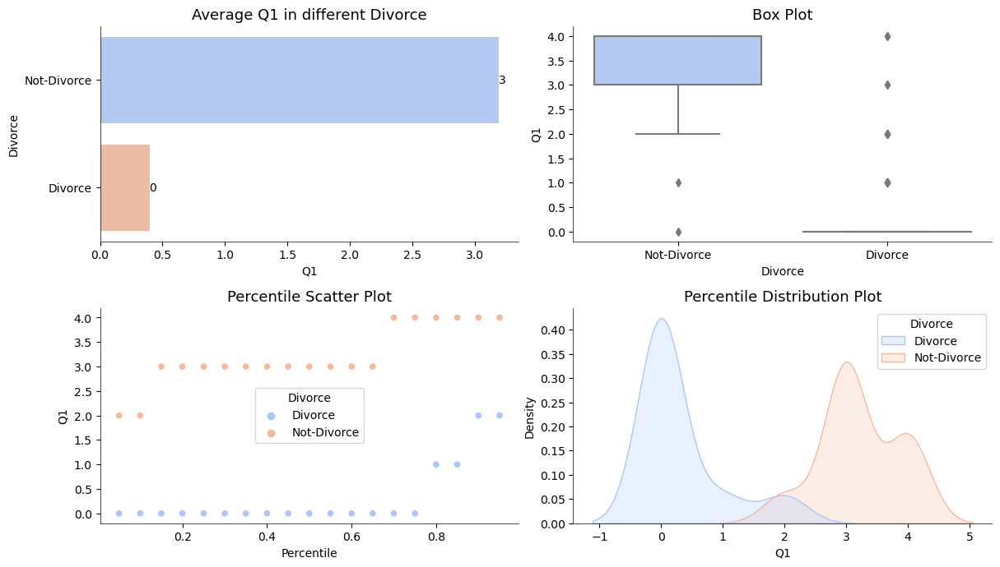

,atribute_id,description
1,2,"I know we can ignore our differences, even if things get hard sometimes."


None

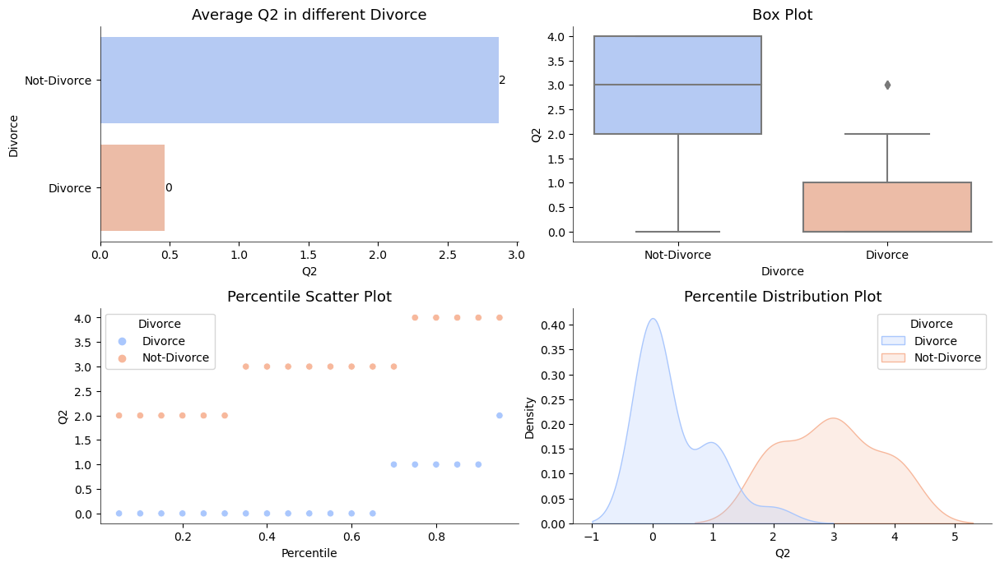

,atribute_id,description
2,3,"When we need it, we can take our discussions with my spouse from the beginning and correct it."


None

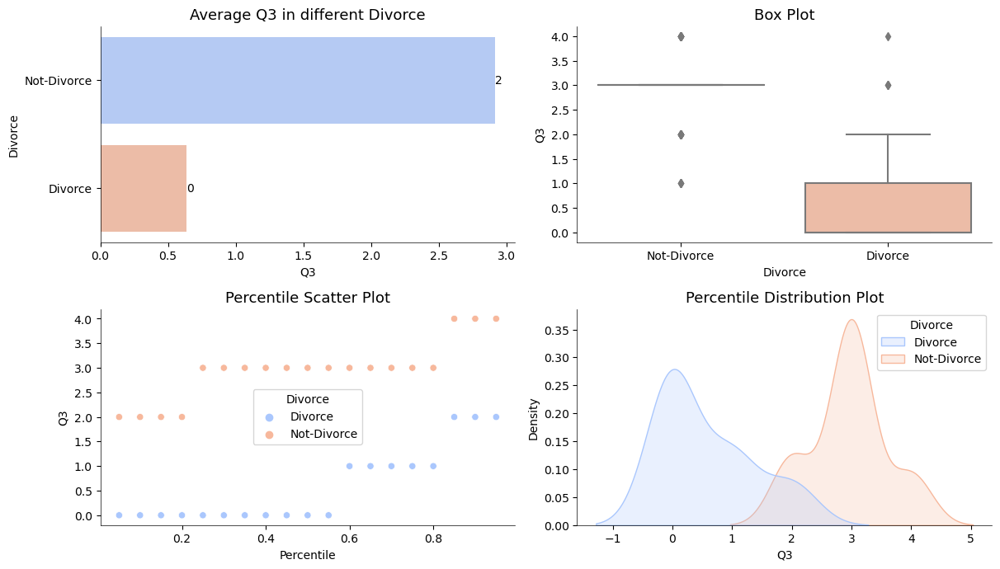

,atribute_id,description
3,4,"When I discuss with my spouse, to contact him will eventually work."


None

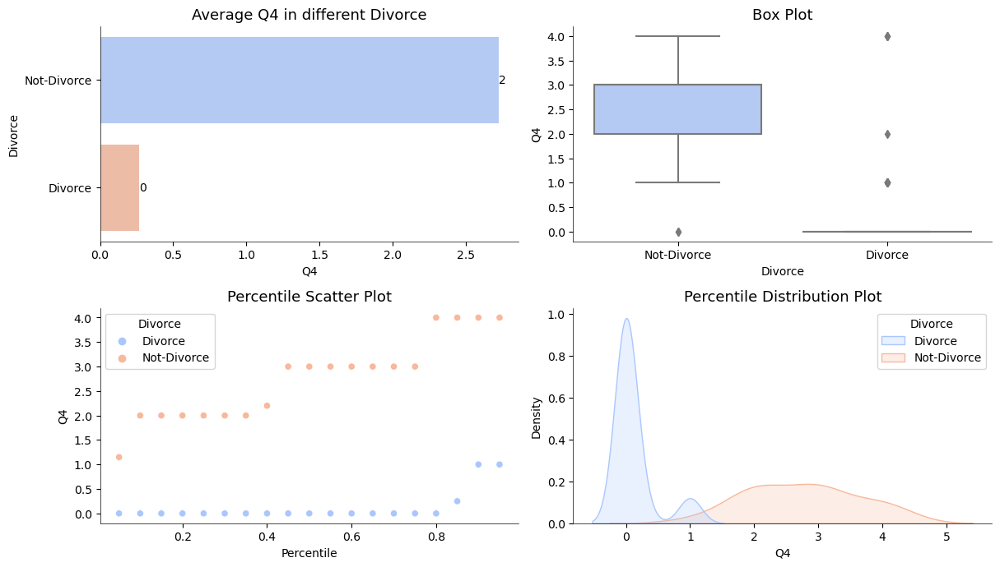

,atribute_id,description
4,5,The time I spent with my wife is special for us.


None

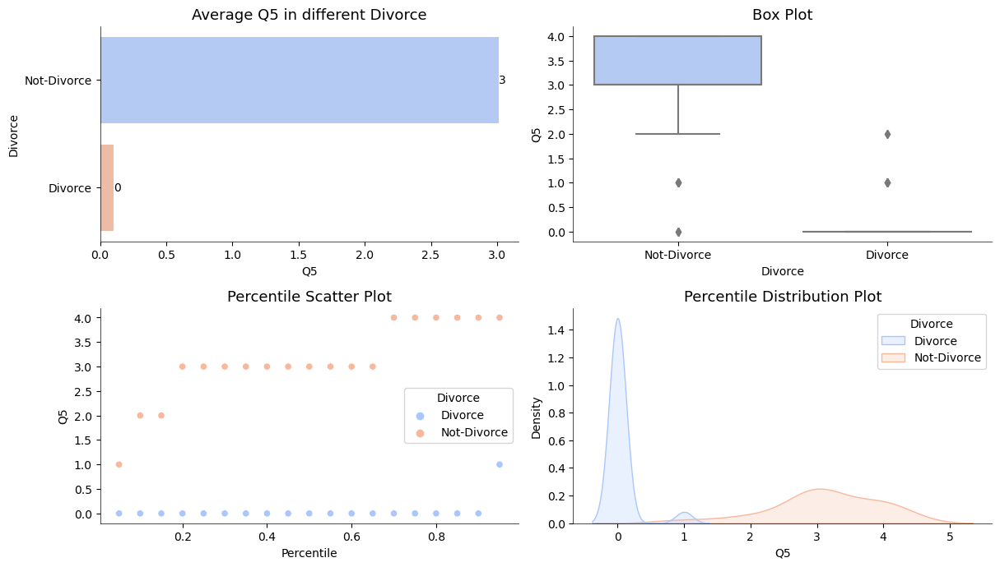

,atribute_id,description
5,6,We don't have time at home as partners.


None

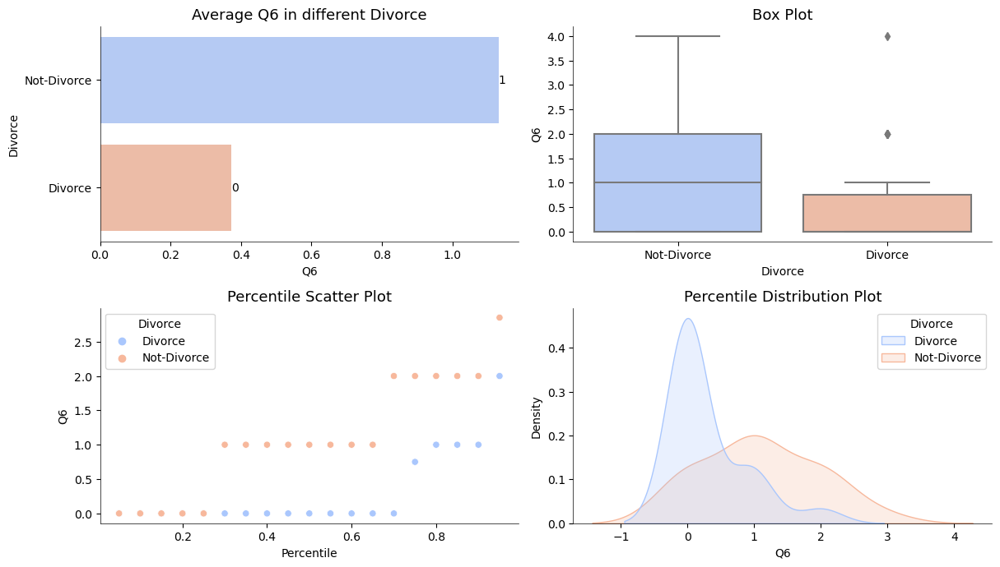

,atribute_id,description
6,7,We are like two strangers who share the same environment at home rather than family.


None

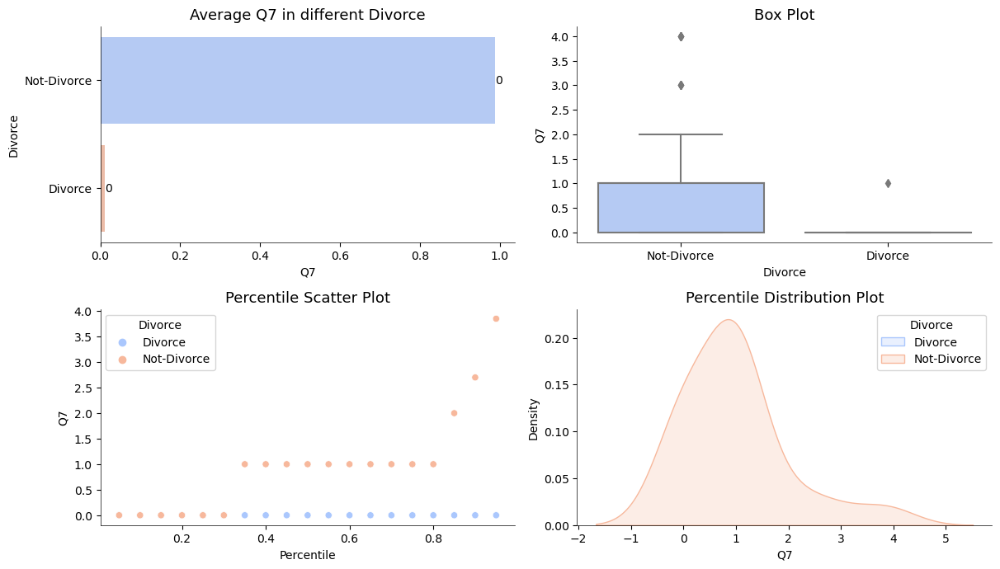

,atribute_id,description
7,8,I enjoy our holidays with my wife.


None

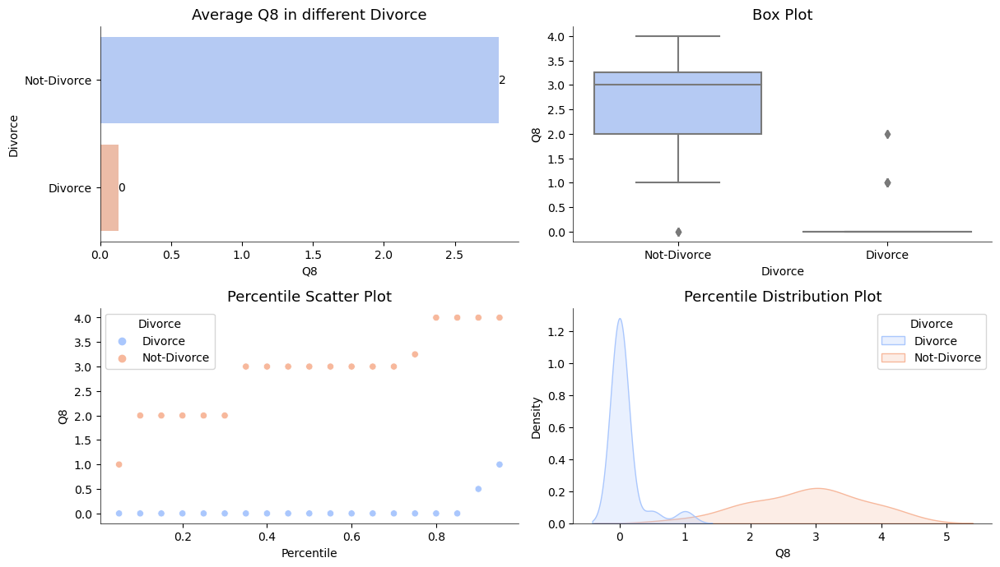

,atribute_id,description
8,9,I enjoy traveling with my wife.


None

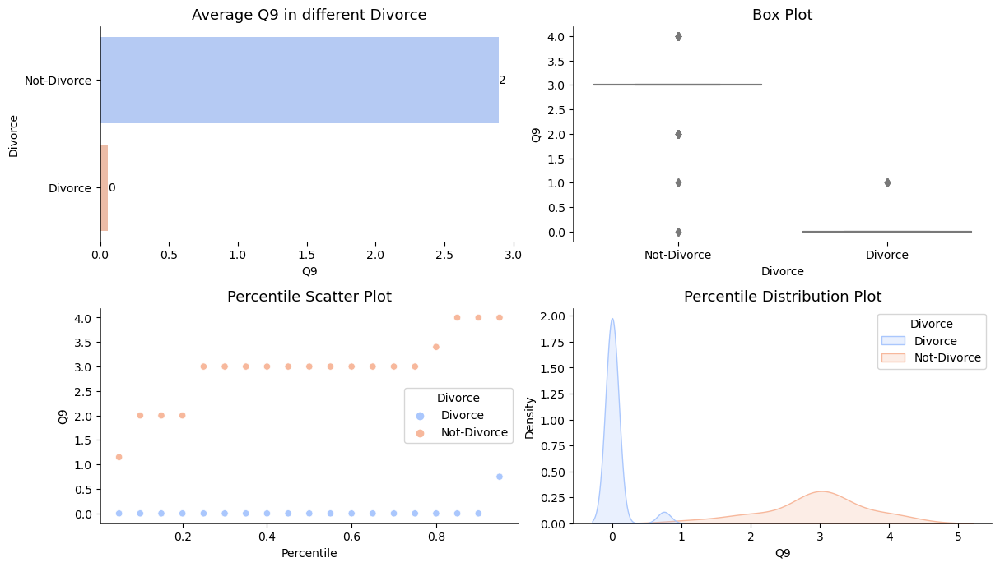

,atribute_id,description
9,10,Most of our goals are common to my spouse.


None

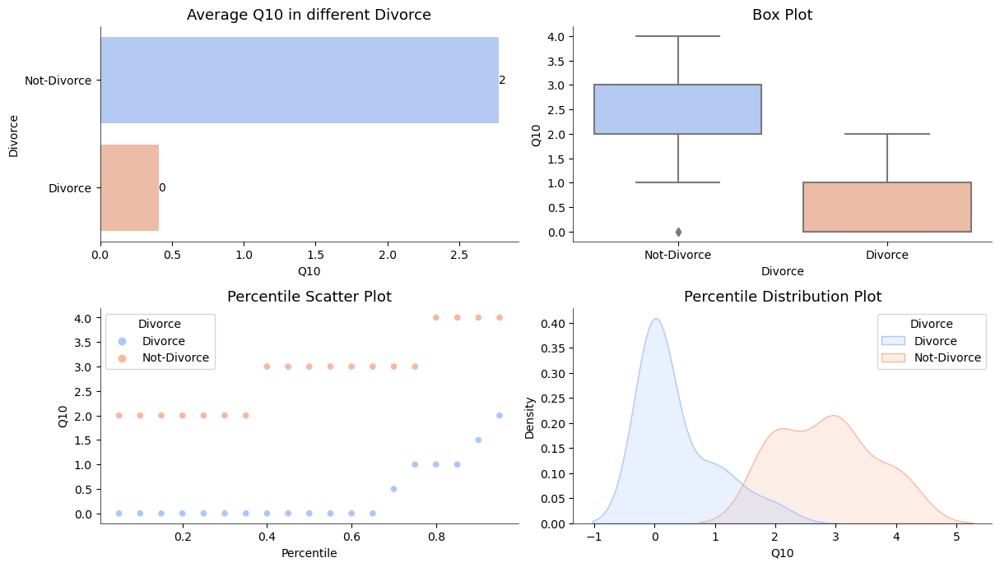

,atribute_id,description
10,11,"I think that one day in the future, when I look back, I see that my spouse and I have been in harmony with each other."


None

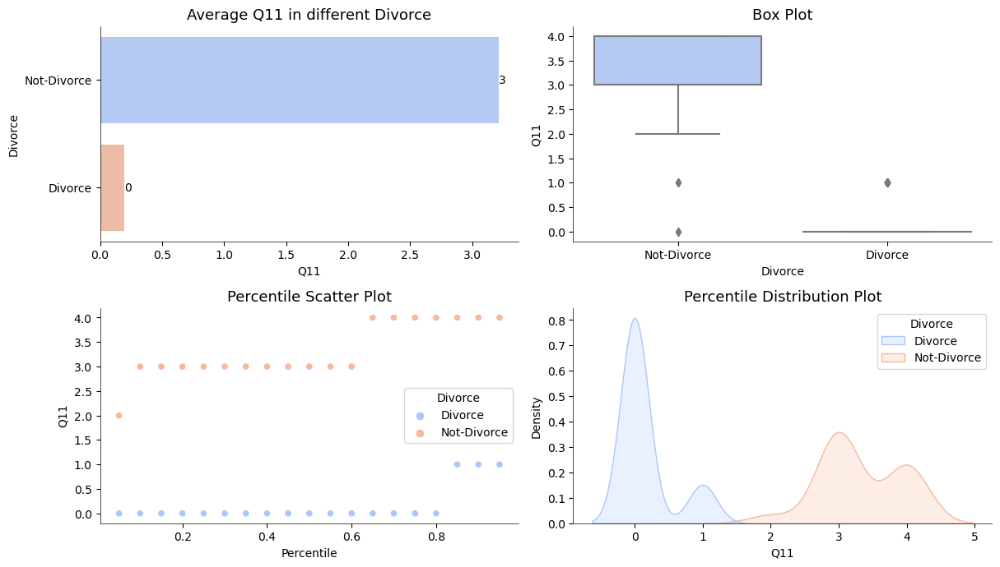

,atribute_id,description
11,12,My spouse and I have similar values in terms of personal freedom.


None

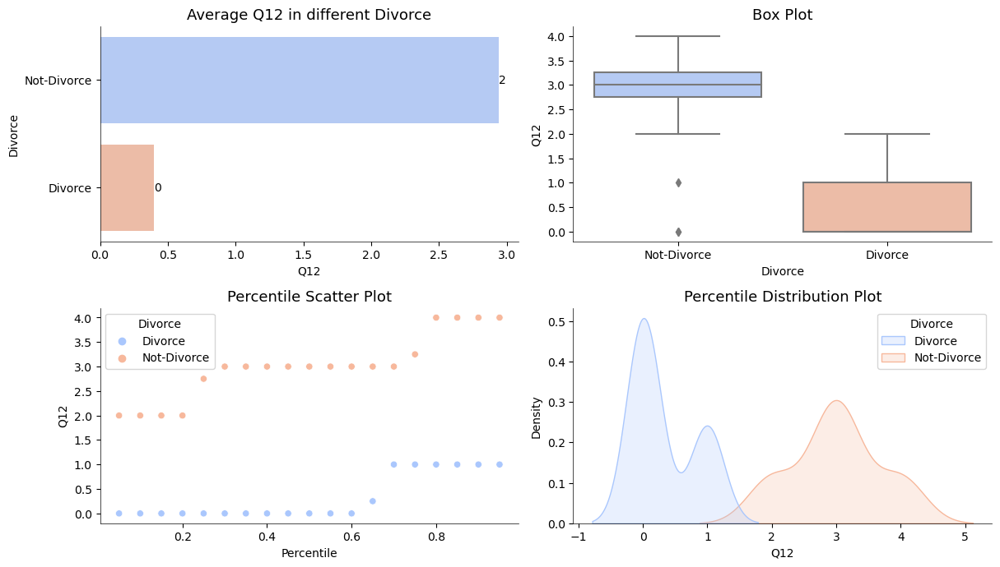

,atribute_id,description
12,13,My spouse and I have similar sense of entertainment.


None

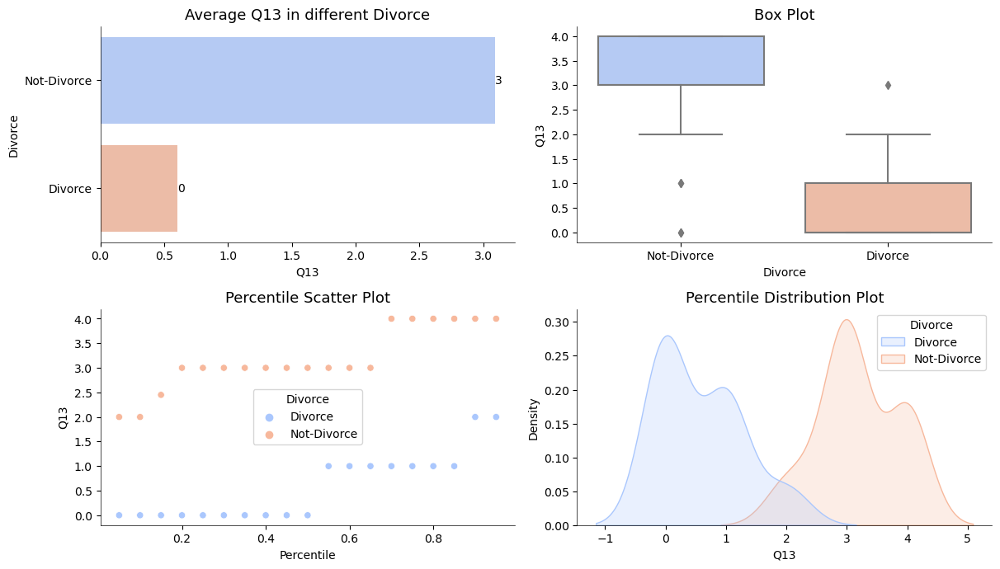

,atribute_id,description
13,14,"Most of our goals for people (children, friends, etc.) are the same."


None

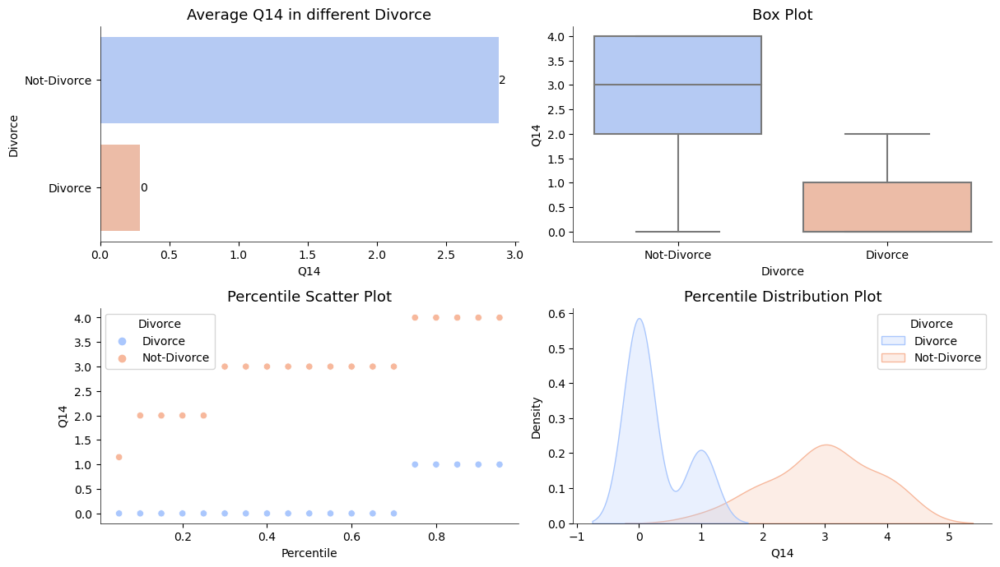

,atribute_id,description
14,15,Our dreams with my spouse are similar and harmonious.


None

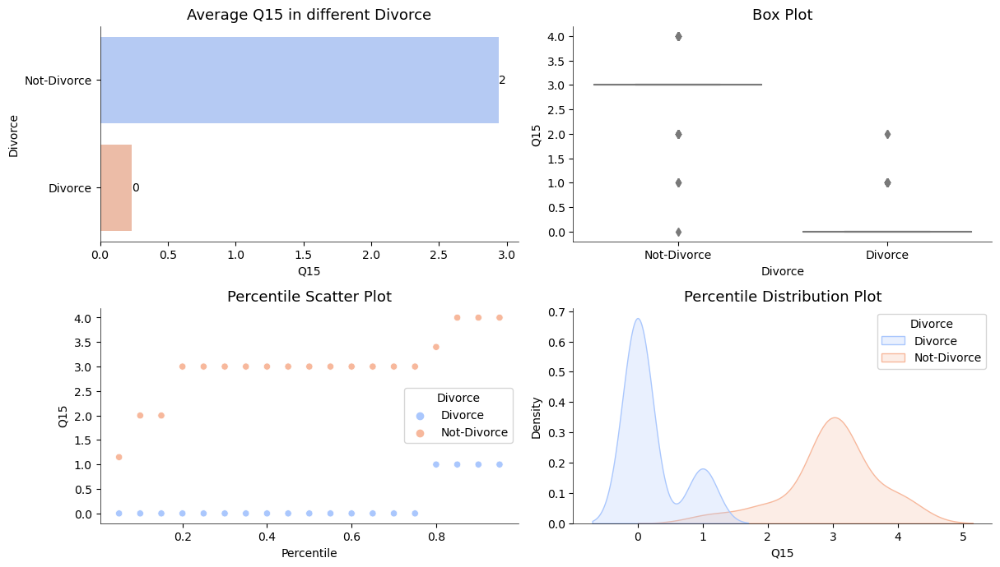

,atribute_id,description
15,16,We're compatible with my spouse about what love should be.


None

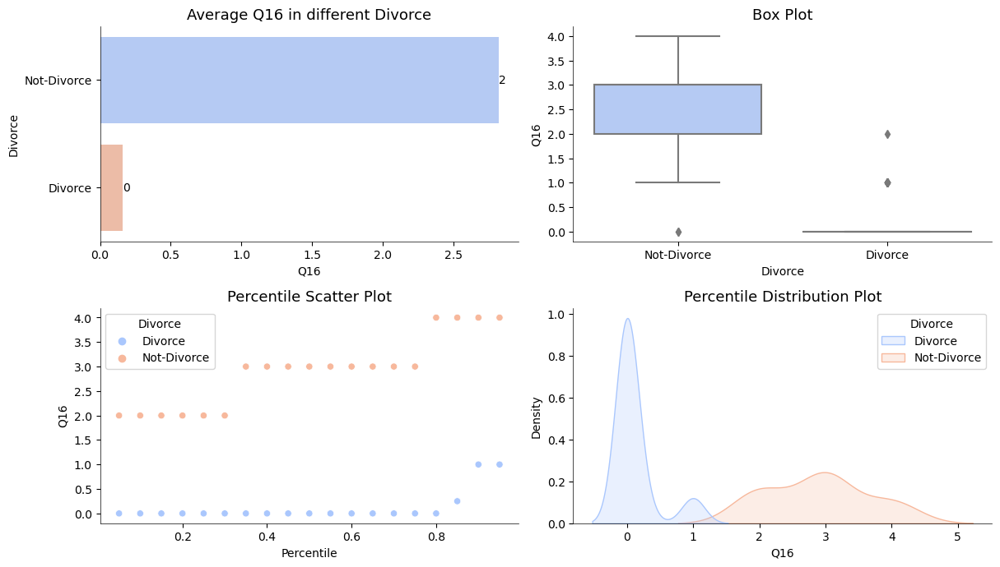

,atribute_id,description
16,17,We share the same views about being happy in our life with my spouse


None

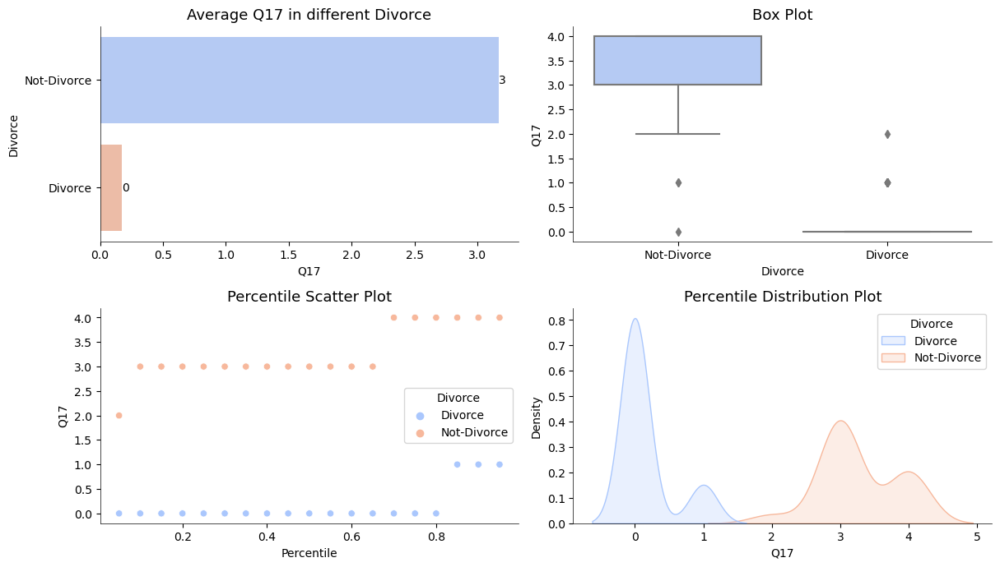

,atribute_id,description
17,18,My spouse and I have similar ideas about how marriage should be


None

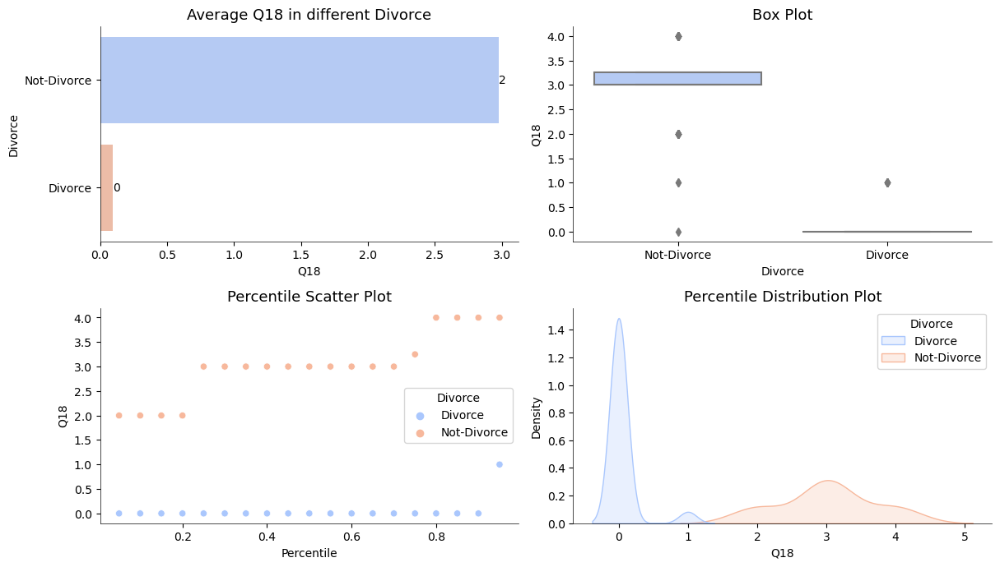

,atribute_id,description
18,19,My spouse and I have similar ideas about how roles should be in marriage


None

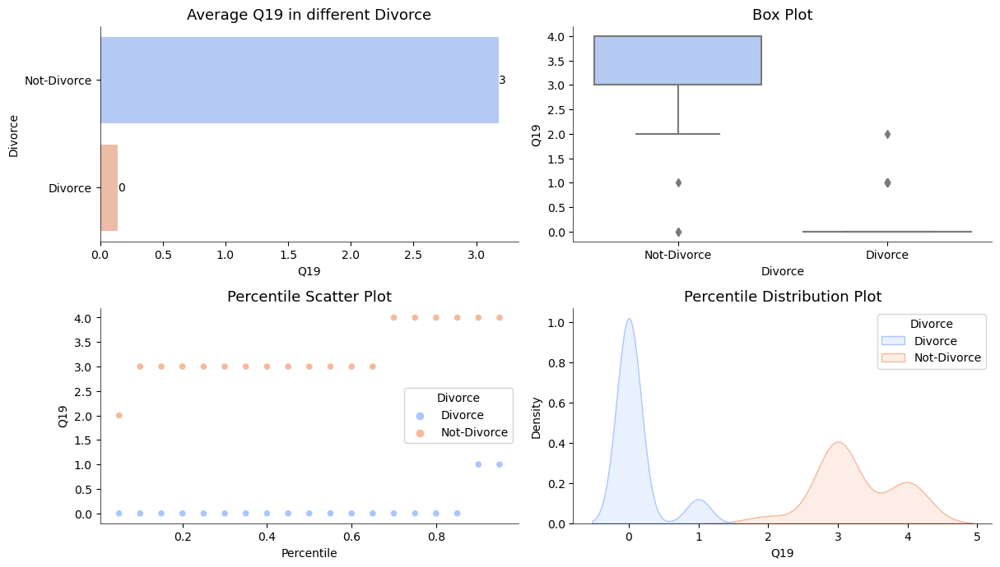

,atribute_id,description
19,20,My spouse and I have similar values in trust.


None

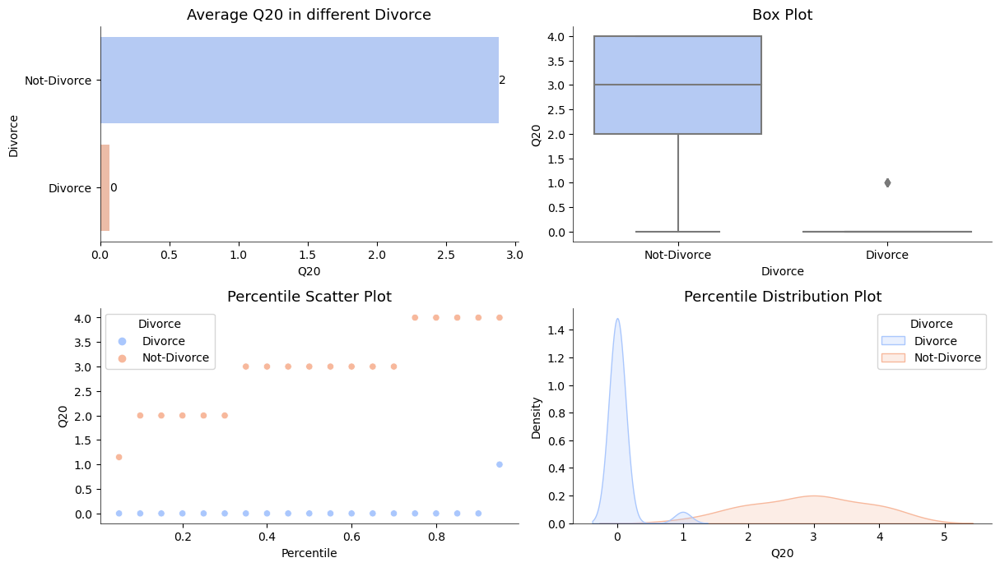

,atribute_id,description
20,21,I know exactly what my wife likes.


None

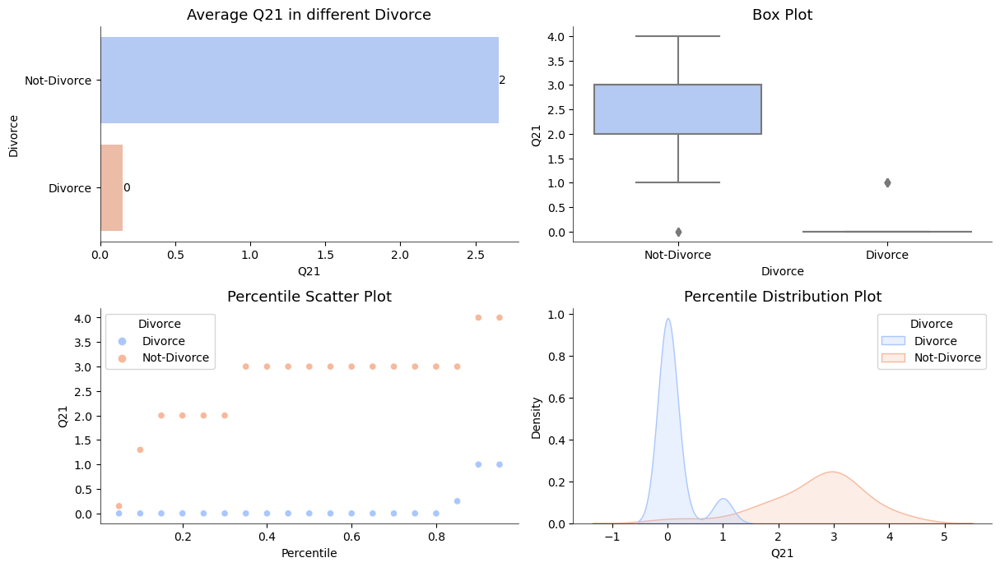

,atribute_id,description
21,22,I know how my spouse wants to be taken care of when she/he sick.


None

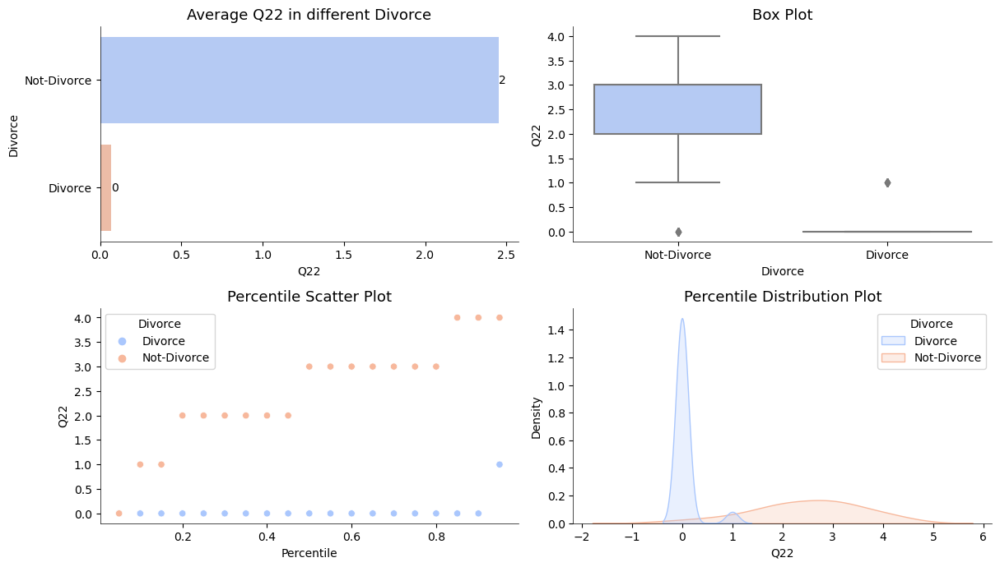

,atribute_id,description
22,23,I know my spouse's favorite food.


None

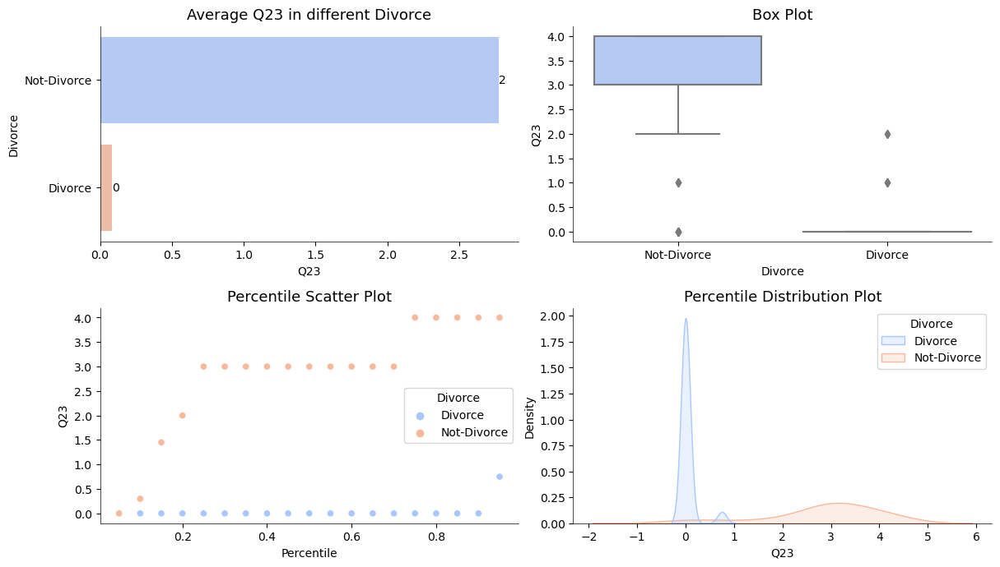

,atribute_id,description
23,24,I can tell you what kind of stress my spouse is facing in her/his life.


None

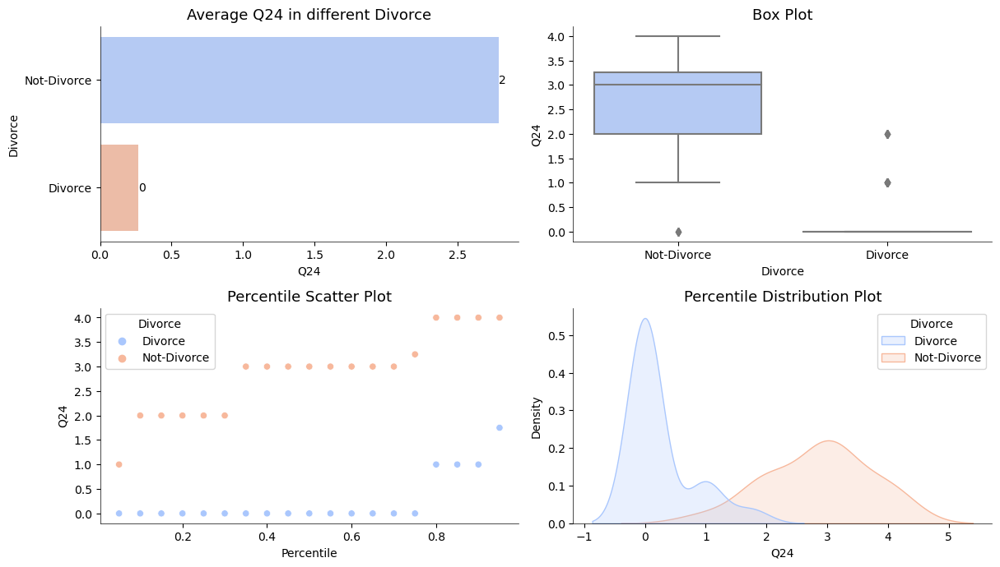

,atribute_id,description
24,25,I have knowledge of my spouse's inner world.


None

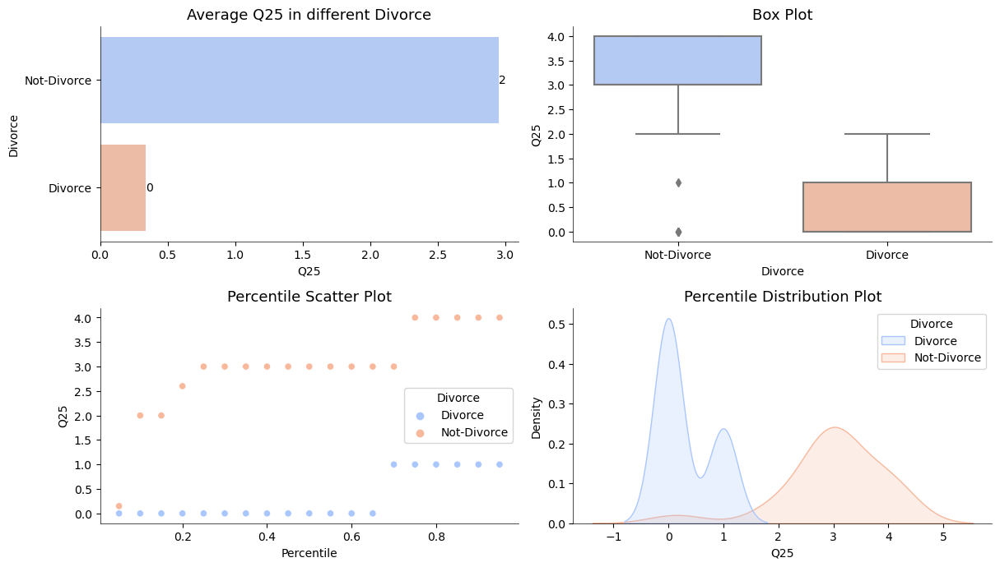

,atribute_id,description
25,26,I know my spouse's basic anxieties.


None

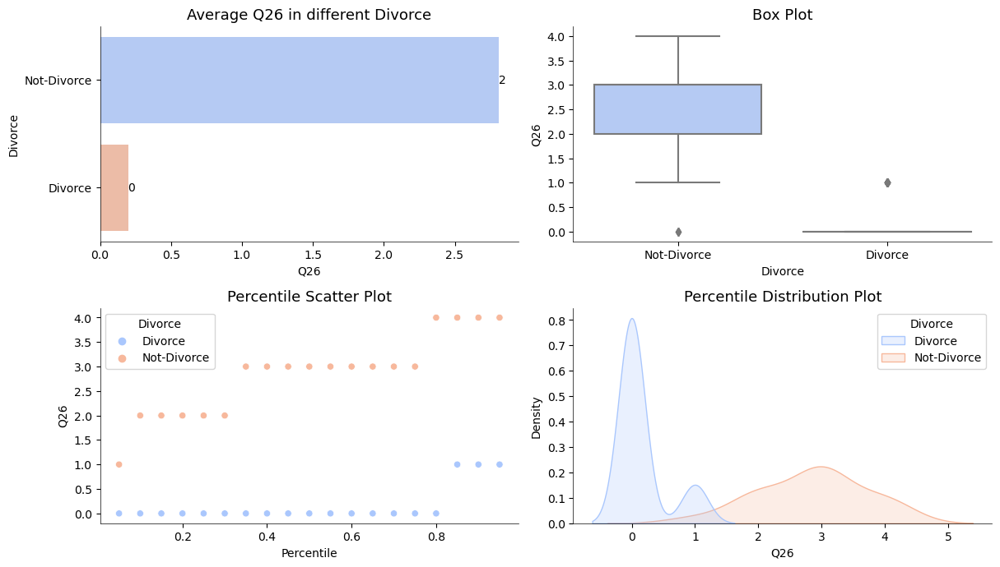

,atribute_id,description
26,27,I know what my spouse's current sources of stress are.


None

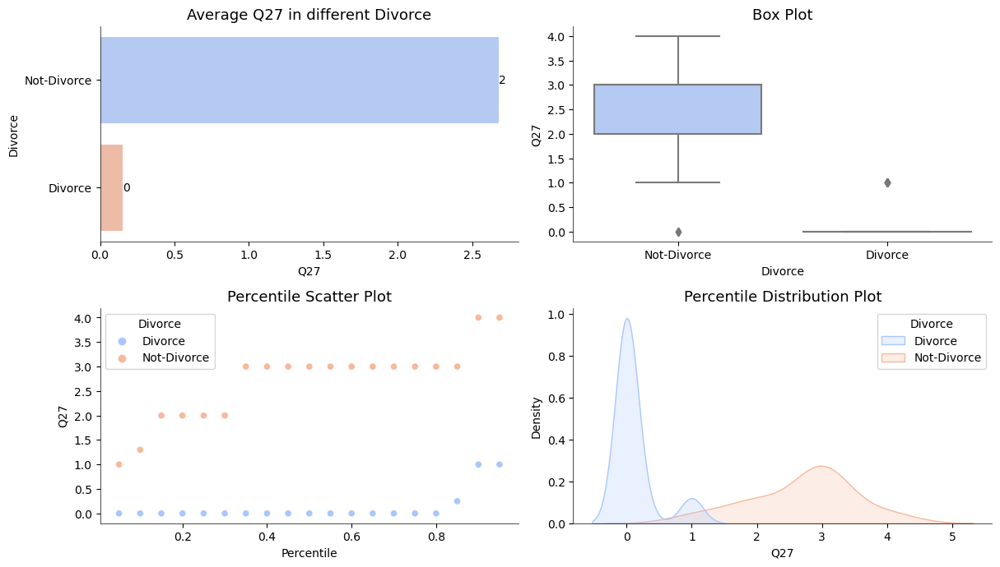

,atribute_id,description
27,28,I know my spouse's hopes and wishes.


None

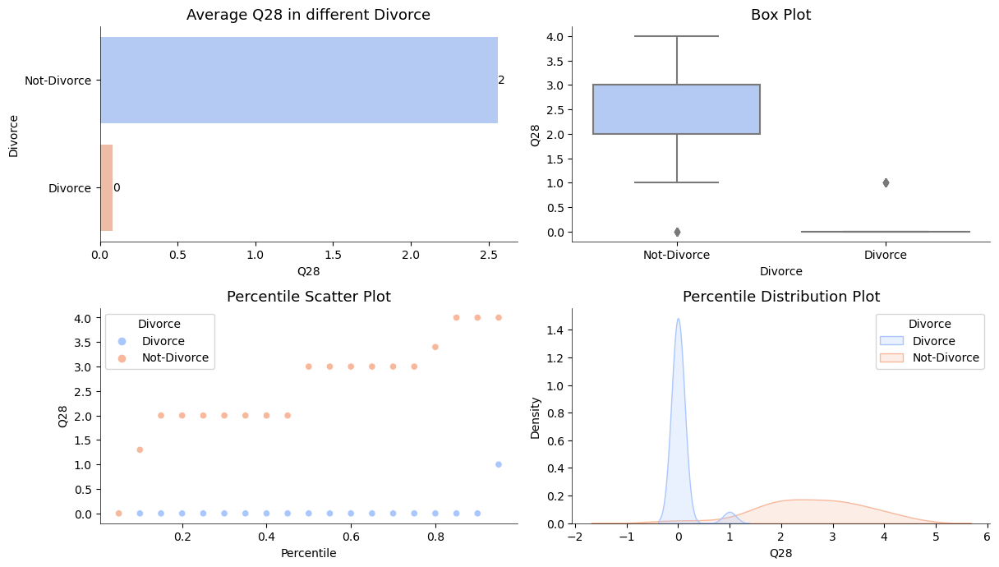

,atribute_id,description
28,29,I know my spouse very well.


None

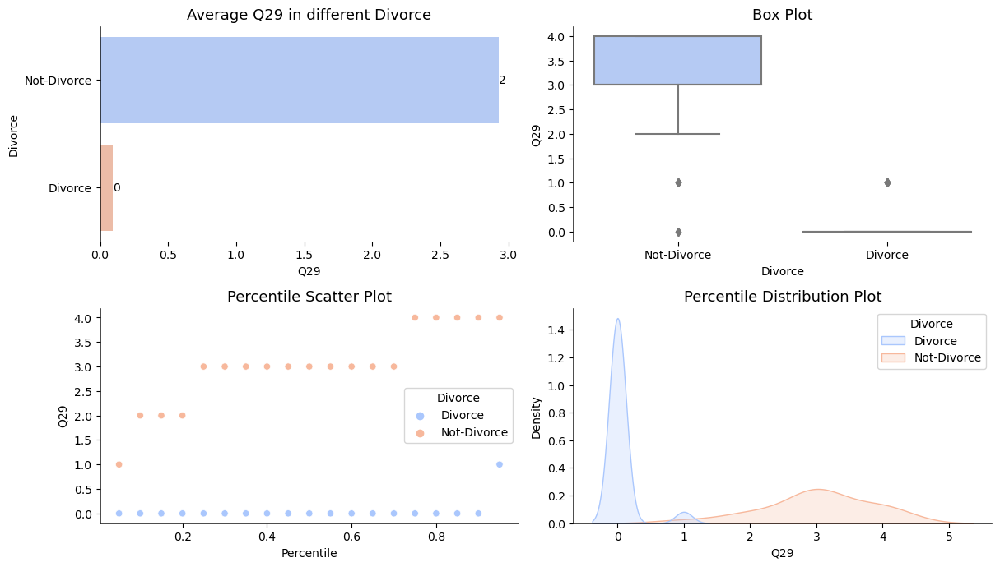

,atribute_id,description
29,30,I know my spouse's friends and their social relationships.


None

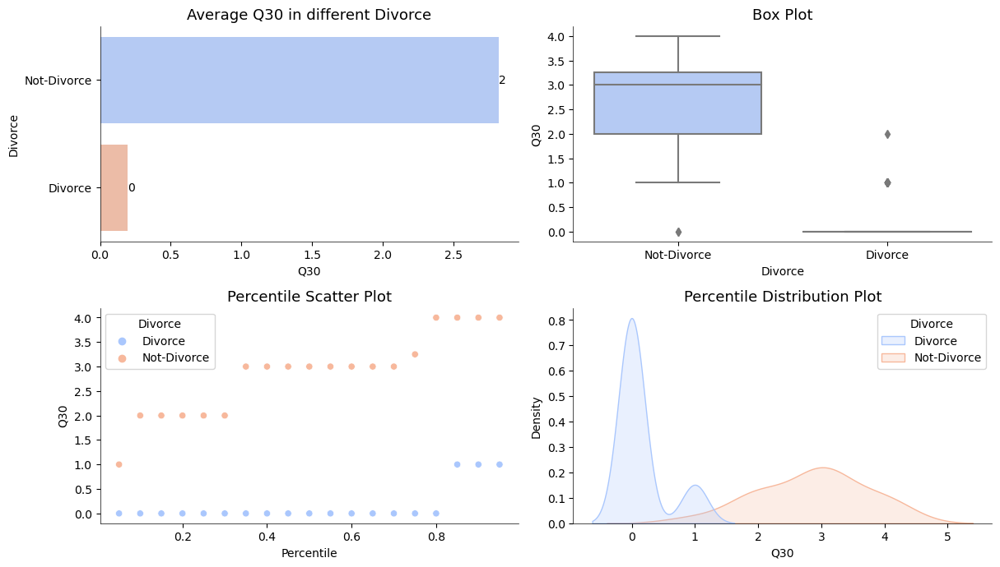

,atribute_id,description
30,31,I feel aggressive when I argue with my spouse.


None

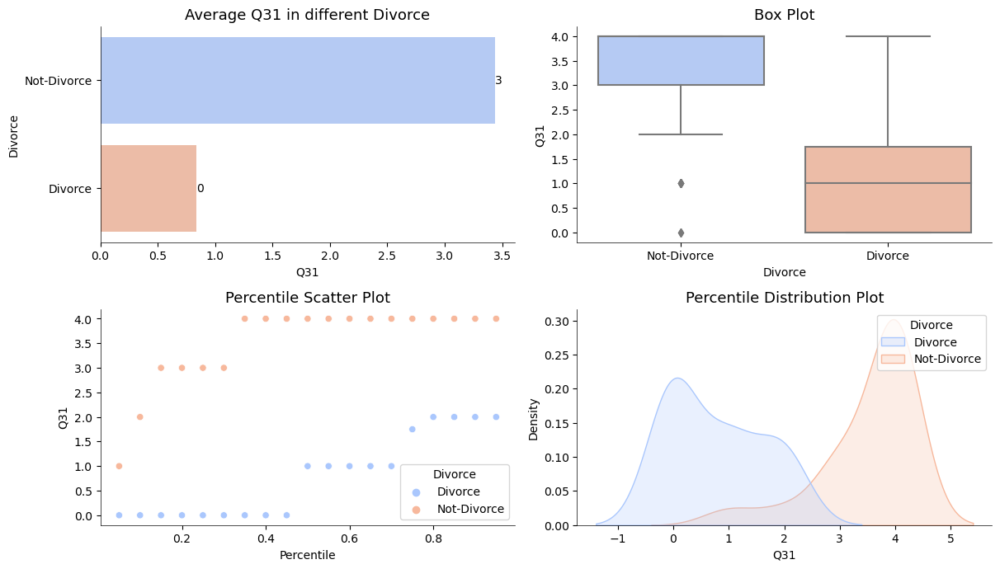

,atribute_id,description
31,32,"When discussing with my spouse, I usually use expressions such as ‘you always’ or ‘you never’ ."


None

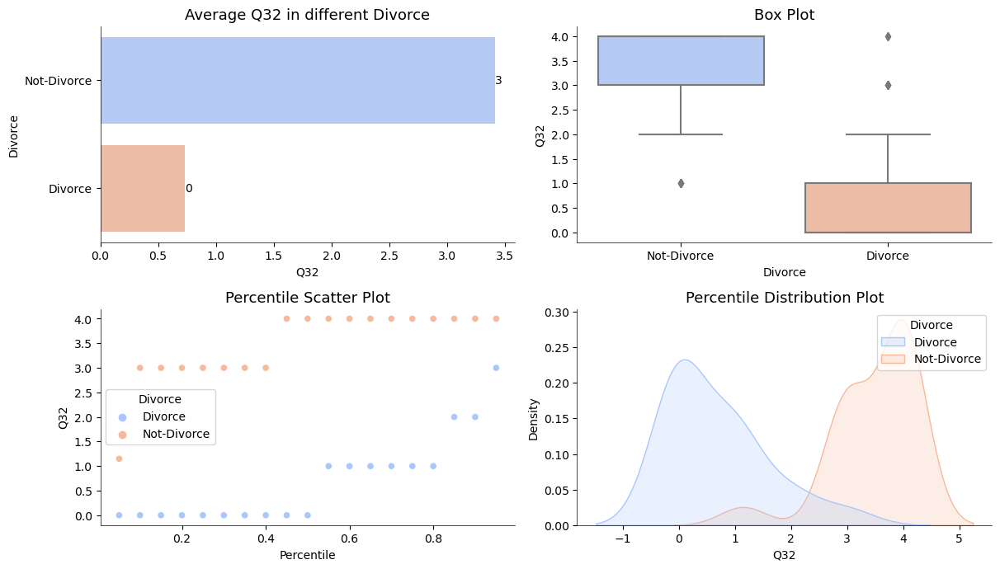

,atribute_id,description
32,33,I can use negative statements about my spouse's personality during our discussions.


None

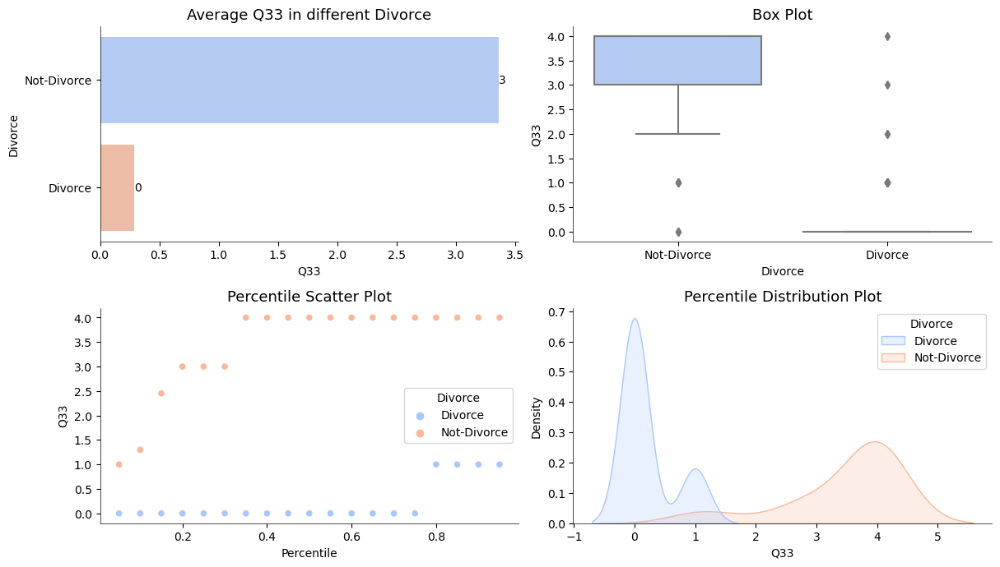

,atribute_id,description
33,34,I can use offensive expressions during our discussions.


None

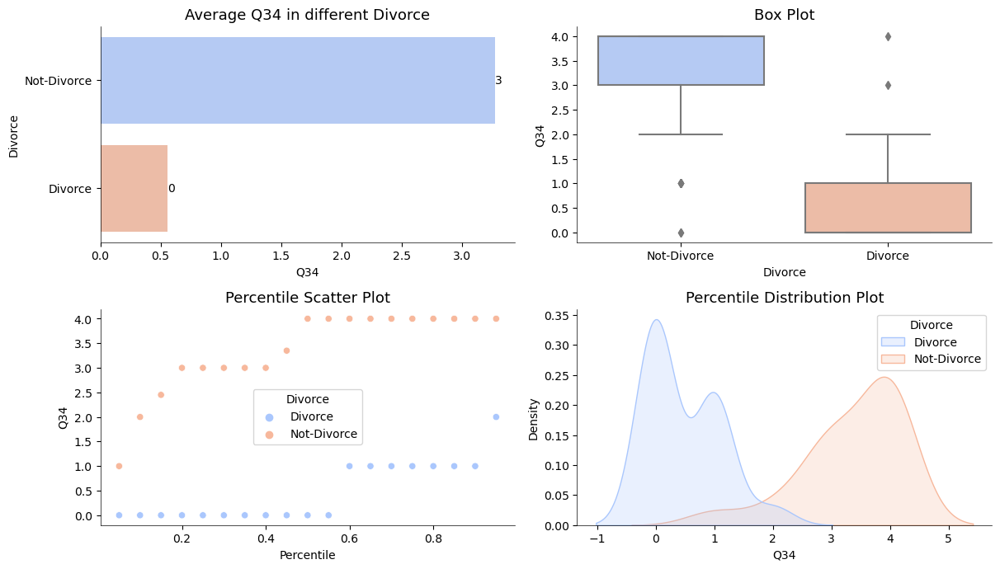

,atribute_id,description
34,35,I can insult my spouse during our discussions.


None

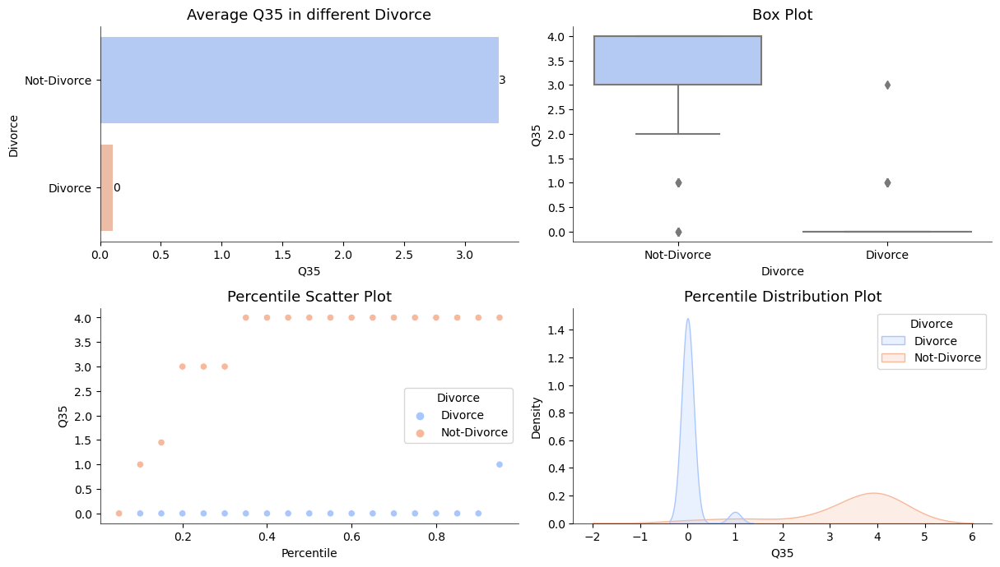

,atribute_id,description
35,36,I can be humiliating when we discussions.


None

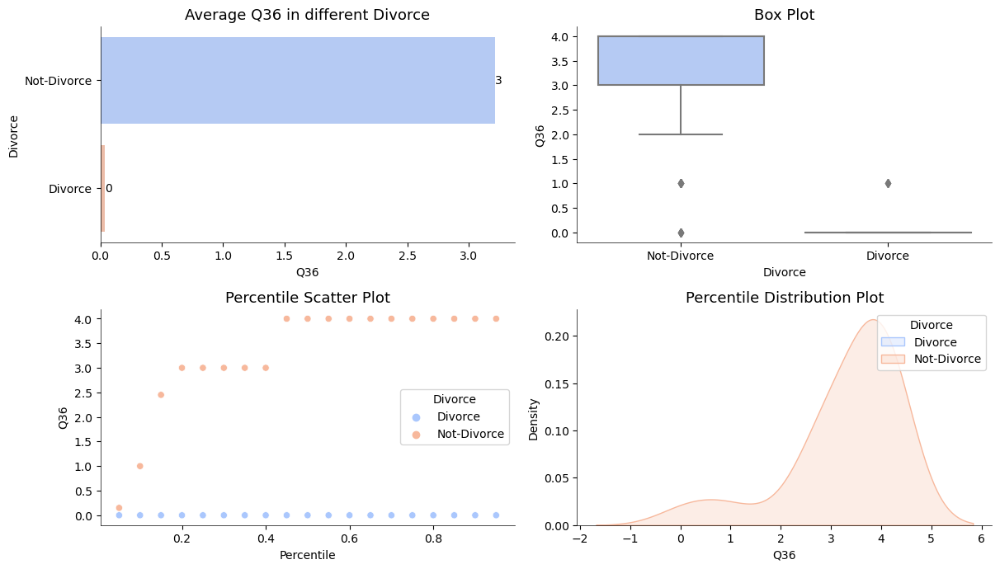

,atribute_id,description
36,37,My discussion with my spouse is not calm.


None

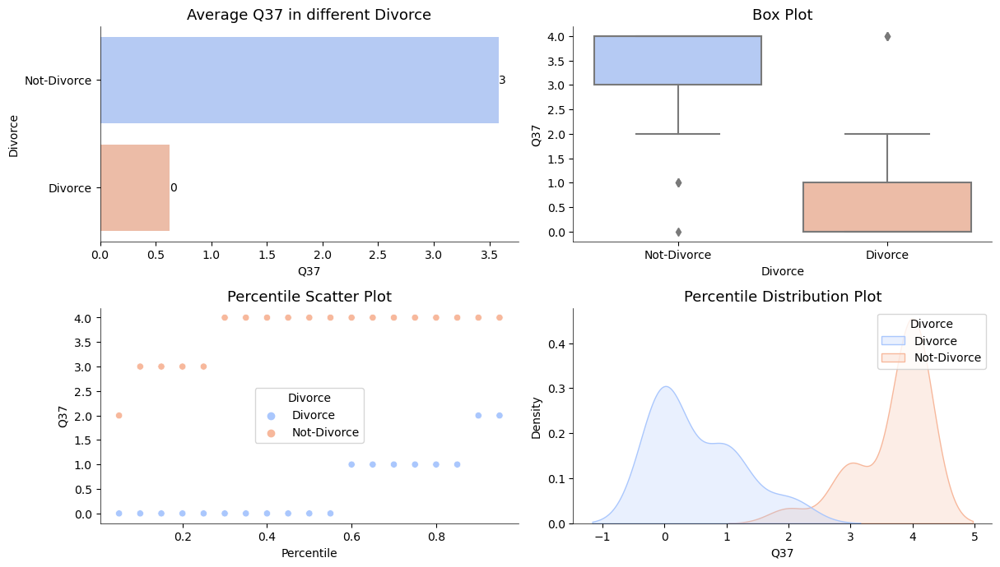

,atribute_id,description
37,38,I hate my spouse's way of open a subject.


None

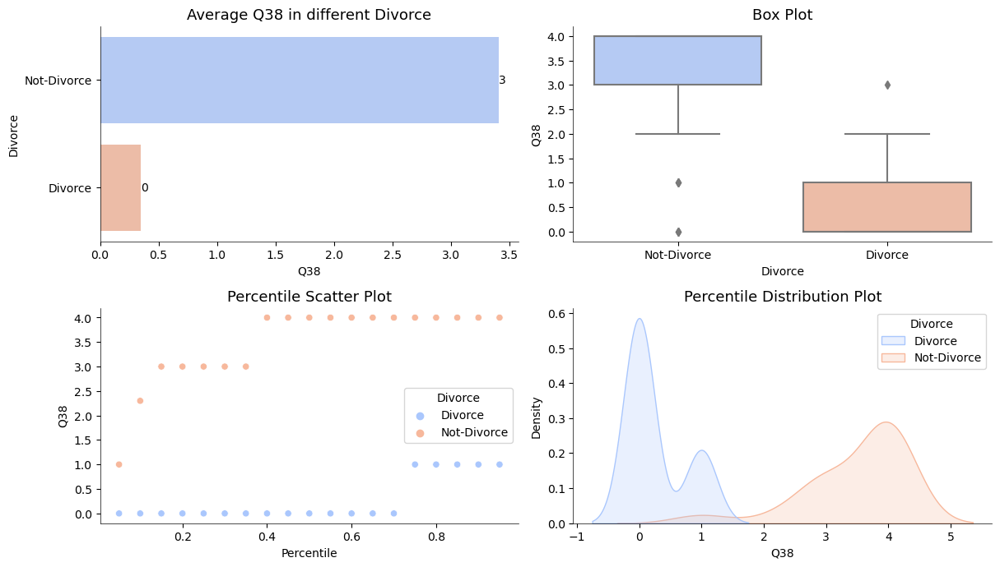

,atribute_id,description
38,39,Our discussions often occur suddenly.


None

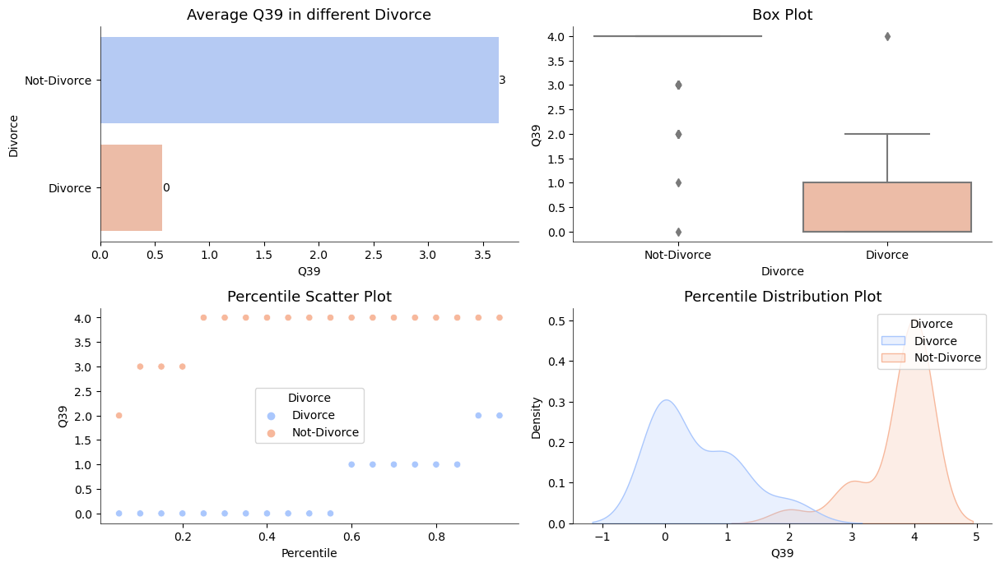

,atribute_id,description
39,40,We're just starting a discussion before I know what's going on.


None

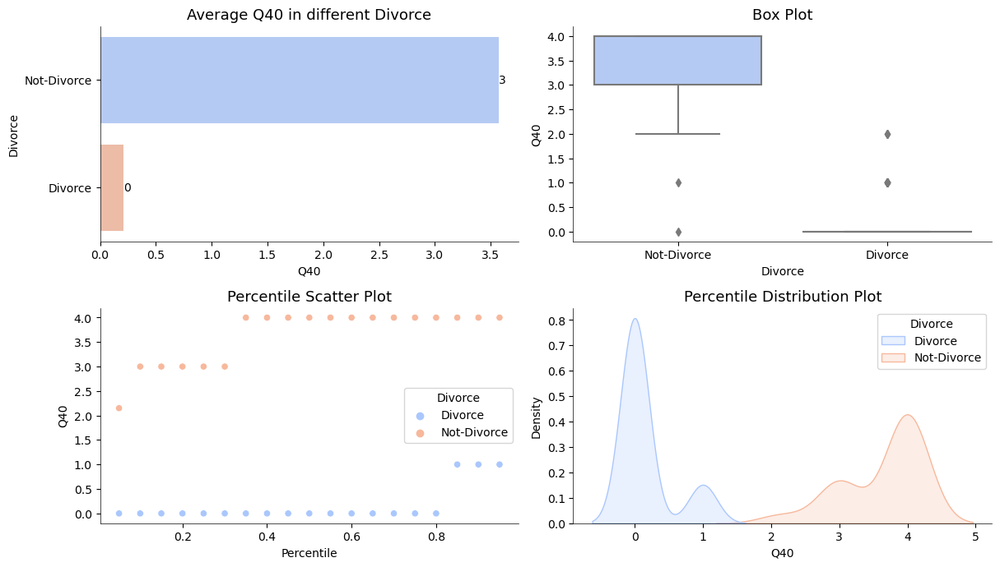

,atribute_id,description
40,41,"When I talk to my spouse about something, my calm suddenly breaks."


None

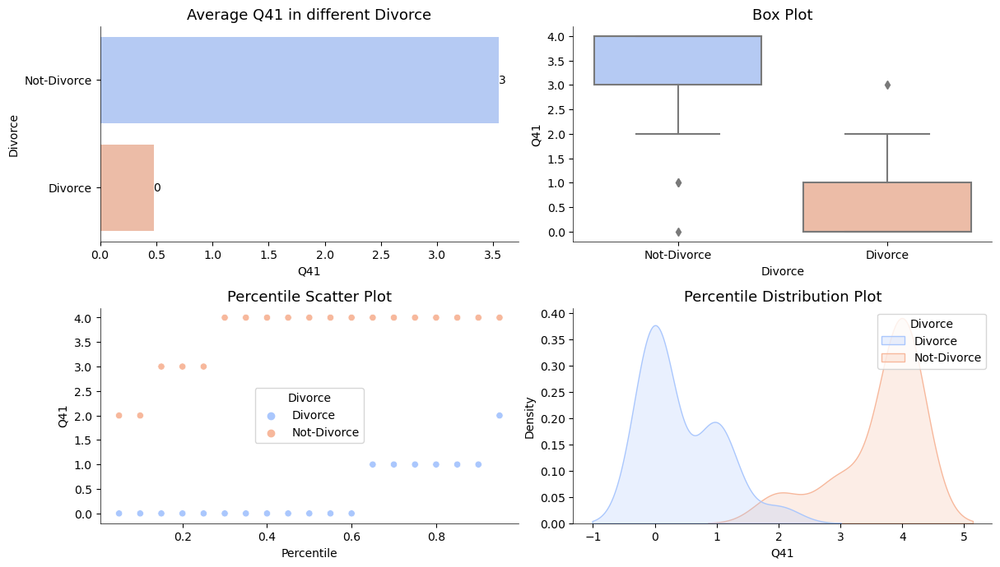

,atribute_id,description
41,42,"When I argue with my spouse, ı only go out and I don't say a word."


None

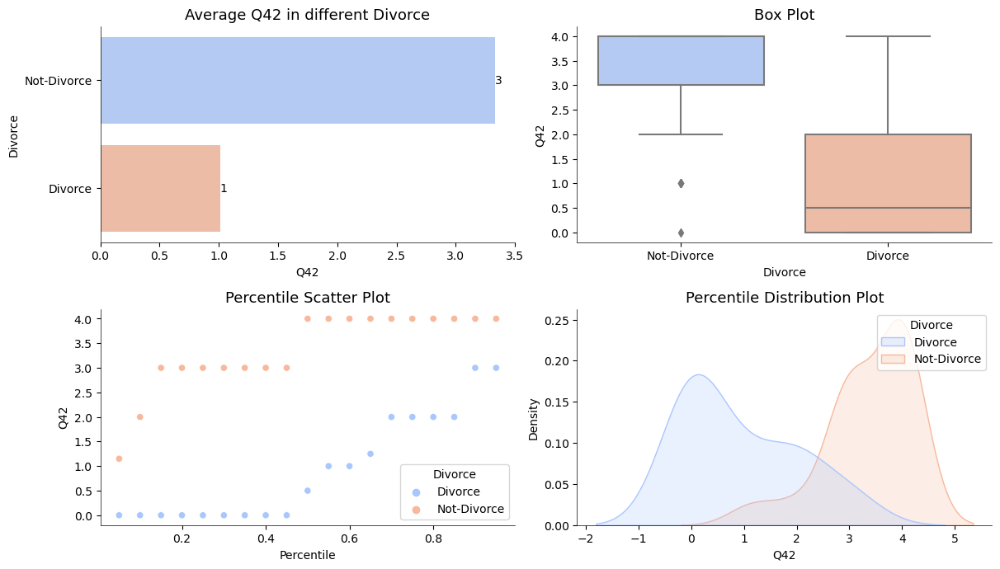

,atribute_id,description
42,43,I mostly stay silent to calm the environment a little bit.


None

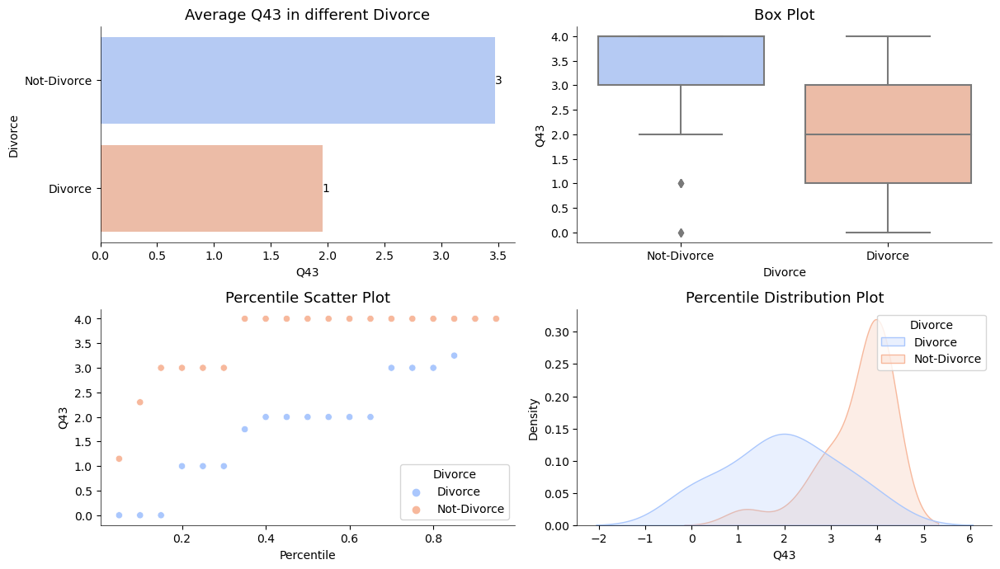

,atribute_id,description
43,44,Sometimes I think it's good for me to leave home for a while.


None

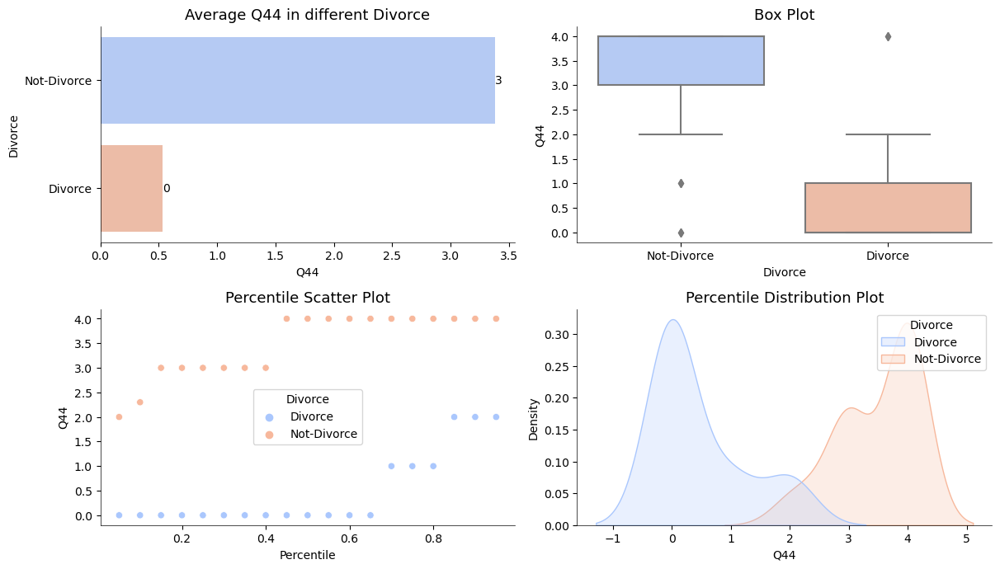

,atribute_id,description
44,45,I'd rather stay silent than discuss with my spouse.


None

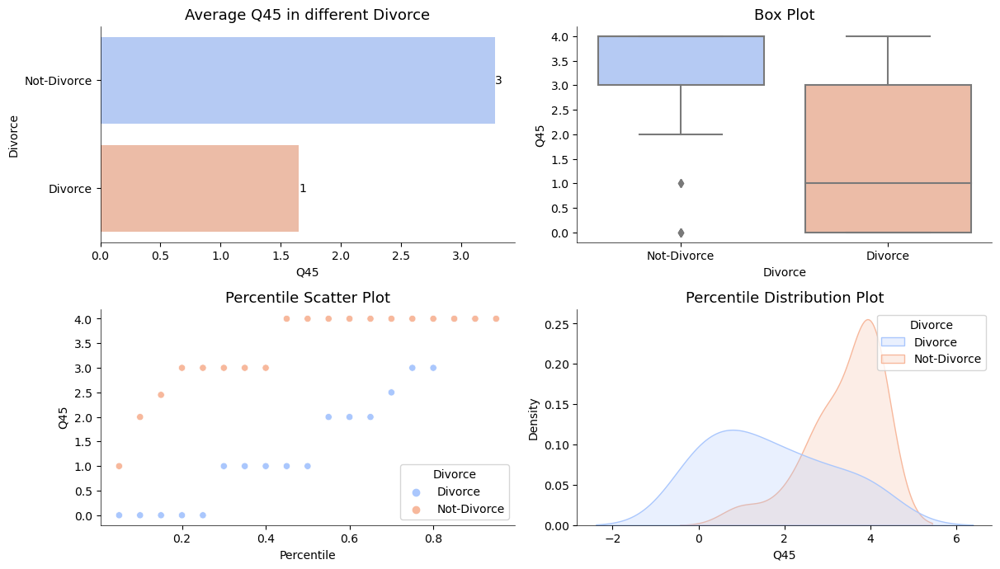

,atribute_id,description
45,46,"Even if I'm right in the discussion, I stay silent to hurt my spouse."


None

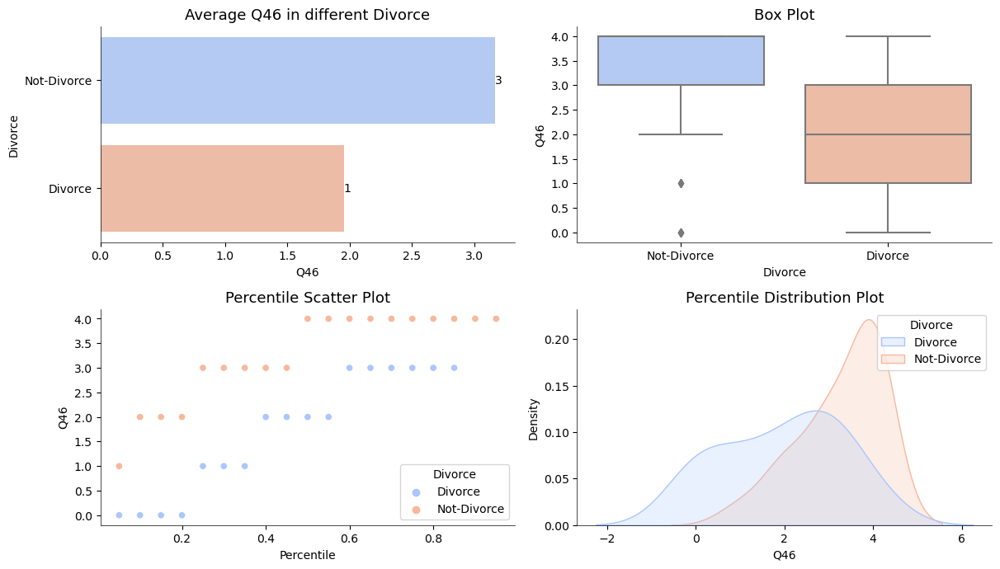

,atribute_id,description
46,47,"When I discuss with my spouse, I stay silent because I am afraid of not being able to control my anger."


None

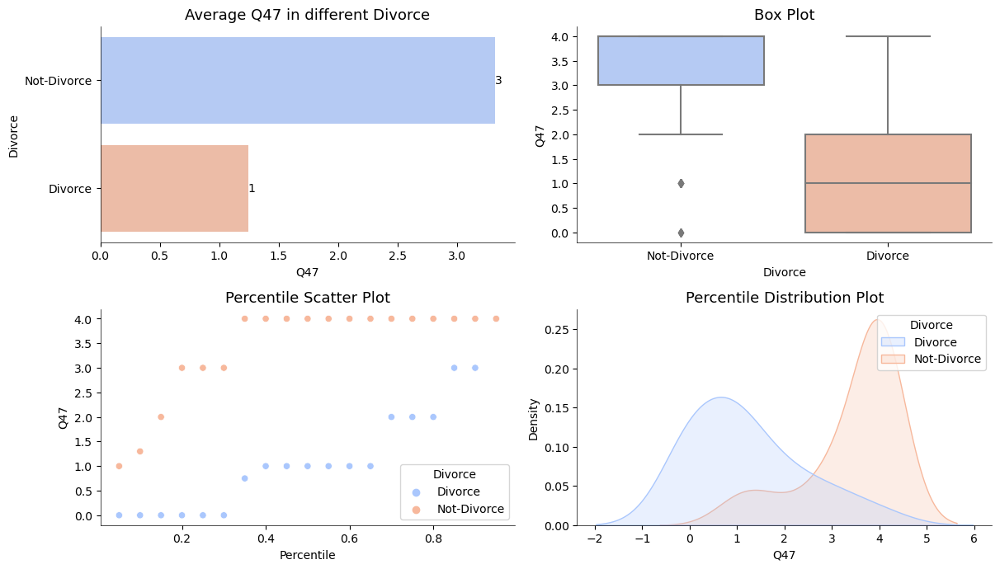

,atribute_id,description
47,48,I feel right in our discussions.


None

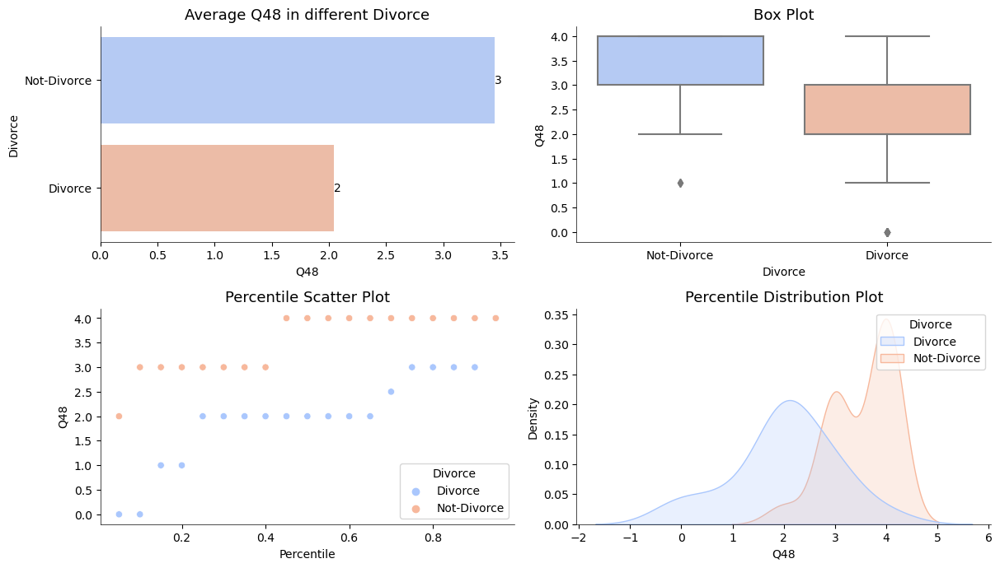

,atribute_id,description
48,49,I have nothing to do with what I've been accused of.


None

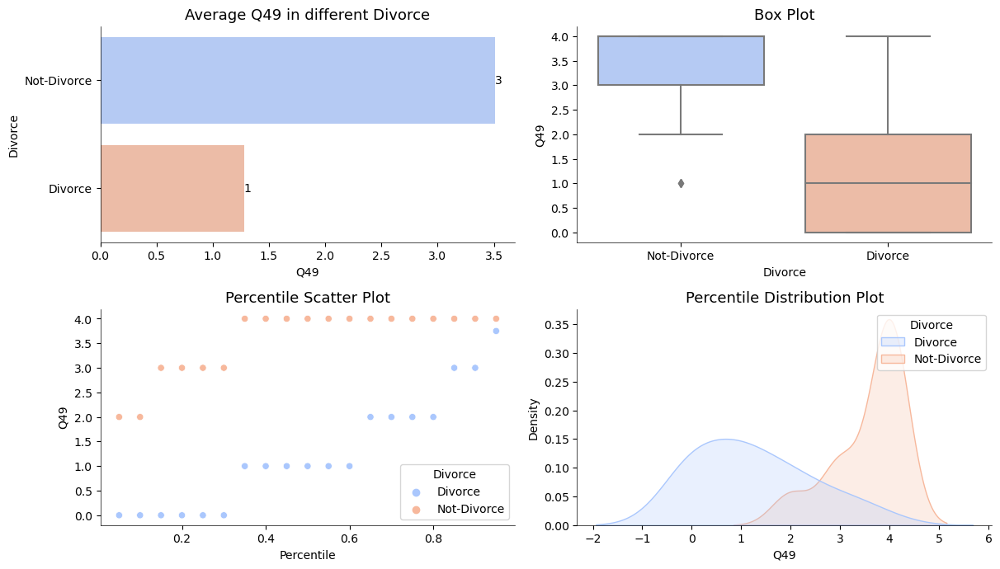

,atribute_id,description
49,50,I'm not actually the one who's guilty about what I'm accused of.


None

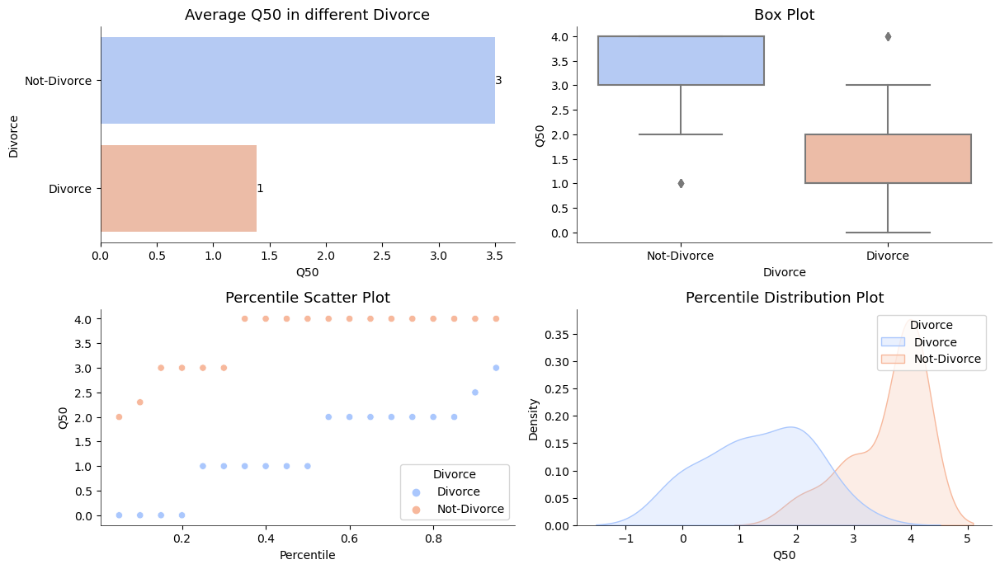

,atribute_id,description
50,51,I'm not the one who's wrong about problems at home.


None

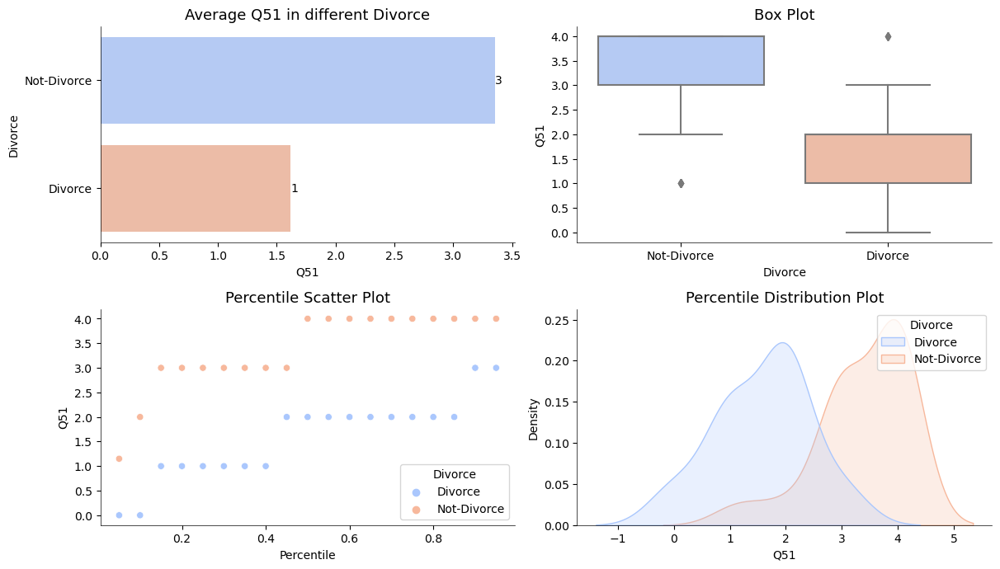

,atribute_id,description
51,52,I wouldn't hesitate to tell my spouse about her/his inadequacy.


None

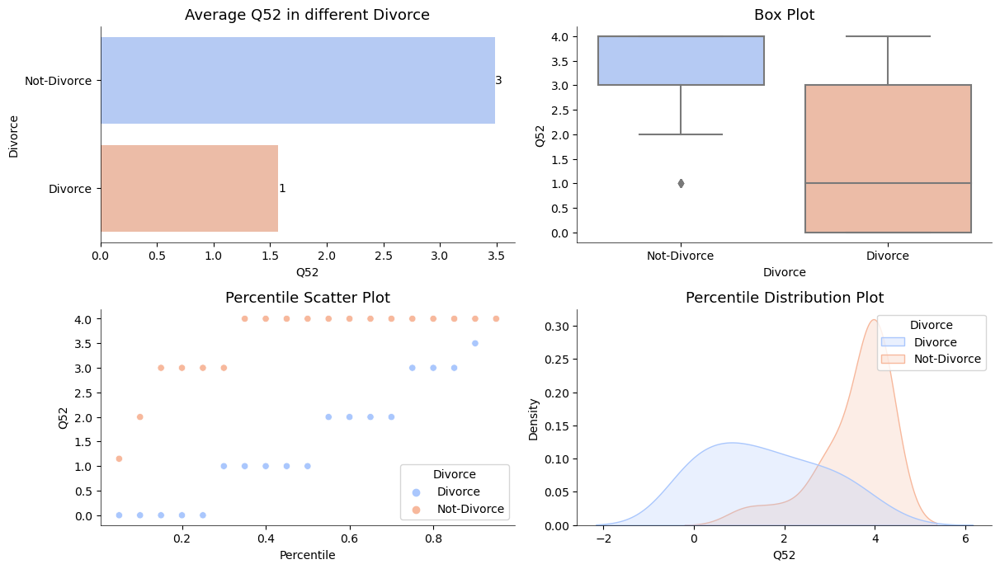

,atribute_id,description
52,53,"When I discuss, I remind my spouse of her/his inadequacy."


None

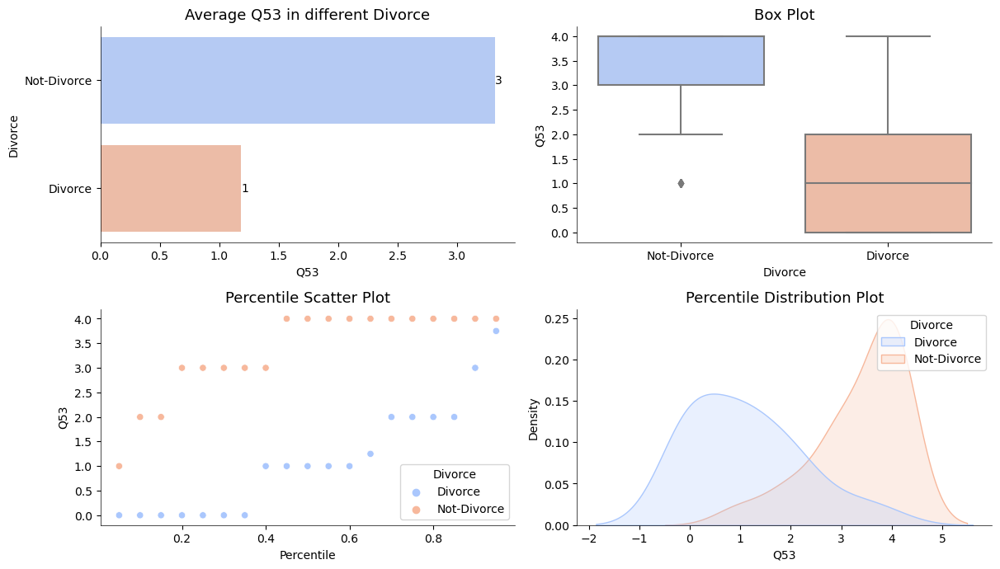

,atribute_id,description
53,54,I'm not afraid to tell my spouse about her/his incompetence.


None

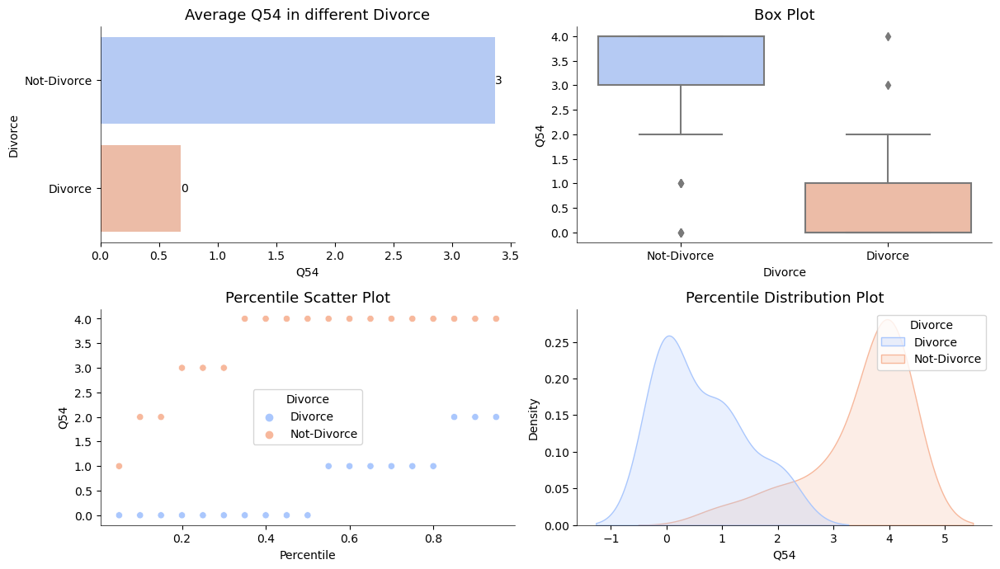

In [10]:
n = 1
for col in notebook.tqdm(list(df2.columns)[:-1]) :
    display(display(ref[ref['atribute_id']==n]))
    eda.bivariate_analysis(df2, 'Divorce', col)
    n += 1

### EDA Highlights :

**Very Suspicious Column :** 

    Col 6, 7, 32, 35, 36, 37, 38, 39, 41, 46

**Suspicious Column :**
    
    Very Suspicious + Col 31, 40, 45, 48, 50, 51, 52, 54

### Data Preprocessing

In [11]:
data_preprocessing.missing_values_report(df)

,column,count,percent,DataType,Example


In [12]:
data_preprocessing.outliers_report(df)

,variable,outliers_count,outliers_percent,lower_outlier_count,upper_outlier_count,lower_limit,upper_bound
6,Q7,9,5.294118,0,9,-1.5,2.5
5,Q6,6,3.529412,0,6,-1.5,2.5
0,Q1,0,0.000000,0,0,-4.5,7.5
42,Q43,0,0.000000,0,0,-1.0,7.0
31,Q32,0,0.000000,0,0,-6.0,10.0
32,Q33,0,0.000000,0,0,-6.0,10.0
33,Q34,0,0.000000,0,0,-6.0,10.0
34,Q35,0,0.000000,0,0,-6.0,10.0
35,Q36,0,0.000000,0,0,-6.0,10.0
36,Q37,0,0.000000,0,0,-6.0,10.0


In [13]:
very_suspicious = ['Q6', 'Q7', 'Q32', 'Q35', 'Q36', 'Q37', 'Q38', 'Q39', 'Q41', 'Q46']
suspicious = ['Q6', 'Q7', 'Q32', 'Q35', 'Q36', 'Q37', 'Q38', 'Q39', 'Q41', 'Q46', 
             'Q31', 'Q40', 'Q45', 'Q48', 'Q50', 'Q51', 'Q52', 'Q54']

missing_method_reference = { #Method Reference to handle missing value
    'dropcol'   :[],
    'mean'      :[],
    'median'    :[],
    'mode'      :[],
    'dropna'    :[],
    'zero'      :[],
    'percentile':[],
    'unknown'   :[],
    #col_to_handle : reference_col
    'other'     :{},
    'other_with_stat':{}
}

outlier_method_reference = {
    'trimming': ['Q6', 'Q7'],
    'capping': [],
    'discretization': []
}


encode_method_reference = {
}

<img title="Treatments" alt="Alt text" src="divorce_treatments.png">

**Description:**
- Exclusion 1 : Exclude Very Suspicious Variable Only
- Exclusion 2 : Exclude All Suspicious Variable 
- Manipulation 1 : Manipulate value in Very Suspicious variable only (replace 0->4, 1->3, 4->0, 3->1)
- Manipulation 2 : Manipulate value in All Suspicious variable (replace 0->4, 1->3, 4->0, 3->1)

In [14]:
manipulated_1 = df.copy()
manipulated_2 = df.copy()

for col in very_suspicious:
    manipulated_1[col] = manipulated_1[col].replace({0:4, 1:3, 4:0, 3:1})
    
for col in suspicious:
    manipulated_2[col] = manipulated_2[col].replace({0:4, 1:3, 4:0, 3:1})

# for datvis only
manipulated_1_cat = manipulated_1.copy()
manipulated_1_cat['Divorce'] = manipulated_1_cat['Divorce'].replace({0:'Divorce', 1:'Not-Divorce'})

manipulated_2_cat = manipulated_2.copy()
manipulated_2_cat['Divorce'] = manipulated_2_cat['Divorce'].replace({0:'Divorce', 1:'Not-Divorce'})

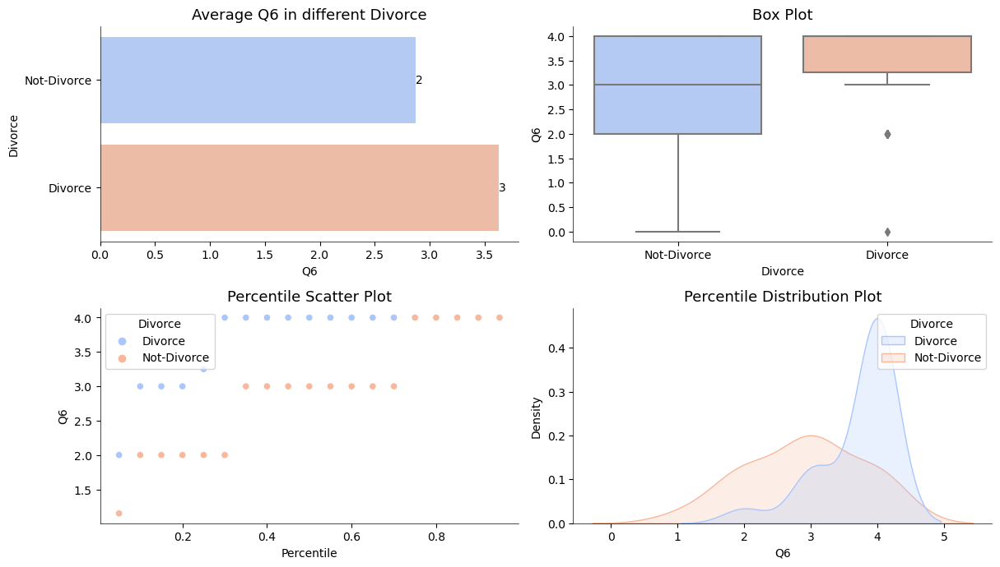

In [15]:
eda.bivariate_analysis(manipulated_1_cat, 'Divorce', 'Q6')

In [16]:
from data_preprocessing import custom_data_preprocessing as prepare

In [17]:
t_01_train, t_01_test = prepare(df, y_var='Divorce', drop_col=[], missing_values=False, encode_categorical=False)
t_02_train, t_02_test = prepare(df, y_var='Divorce', drop_col=[], missing_values=False, outliers=True, outlier_method_config=outlier_method_reference, bins=5, encode_categorical=False)
t_03_train, t_03_test = prepare(df, y_var='Divorce', drop_col=very_suspicious, missing_values=False, encode_categorical=False)
t_04_train, t_04_test = prepare(df, y_var='Divorce', drop_col=suspicious, missing_values=False, encode_categorical=False)
t_05_train, t_05_test = prepare(manipulated_1, y_var='Divorce', drop_col=[], missing_values=False, encode_categorical=False)
t_06_train, t_06_test = prepare(manipulated_1, y_var='Divorce', drop_col=[], missing_values=False, outliers=True, outlier_method_config=outlier_method_reference, bins=5, encode_categorical=False)
t_07_train, t_07_test = prepare(manipulated_2, y_var='Divorce', drop_col=[], missing_values=False, encode_categorical=False)
t_08_train, t_08_test = prepare(manipulated_2, y_var='Divorce', drop_col=[], missing_values=False, outliers=True, outlier_method_config=outlier_method_reference, bins=5, encode_categorical=False)

## Modelling

In [22]:
from data_preprocessing import split_data_2
from classification_modelling import model_performance_summary

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import BaggingClassifier, ExtraTreesClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import VotingClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import StackingClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.metrics import roc_auc_score, roc_curve


In [23]:
datas = {
    'treatment_1':[t_01_train, t_01_test],
    'treatment_2':[t_02_train, t_02_test],
    'treatment_3':[t_03_train, t_03_test],
    'treatment_4':[t_04_train, t_04_test],
    'treatment_5':[t_05_train, t_05_test],
    'treatment_6':[t_06_train, t_06_test],
    'treatment_7':[t_07_train, t_07_test],
    'treatment_8':[t_08_train, t_08_test]
}
models = {
    'XGBoost'           : XGBClassifier(),
    'RandomForest'      : RandomForestClassifier(),
    'LightGBM'          : LGBMClassifier(),
    'LogisticRegression': LogisticRegression(),
    'SVM'               : SVC(),
    'KNeighbors'        : KNeighborsClassifier(),
    'GaussianNB'        : GaussianNB(),
    'DecisionTree'      : DecisionTreeClassifier(),
    'AdaBoost'          : AdaBoostClassifier(),
    'GradientBoosting'  : GradientBoostingClassifier(),
    'MLP'               : MLPClassifier(),
    'Bagging'           : BaggingClassifier(),
    'ExtraTrees'        : ExtraTreesClassifier(),
    'QuadraticDiscriminant': QuadraticDiscriminantAnalysis(),
    'VotingClassifier'  : VotingClassifier(estimators=[
                                ('lr', LogisticRegression()),
                                ('rf', RandomForestClassifier()),
                                ('knn', KNeighborsClassifier())
                                ]),
    'GaussianProcess'   : GaussianProcessClassifier(),
    'StackingClassifier': StackingClassifier(estimators=[
                                ('lr', LogisticRegression()),
                                ('rf', RandomForestClassifier()),
                                ('knn', KNeighborsClassifier())
                                ])
}

In [24]:
model_summary = model_performance_summary(datas, models, 'Divorce')
model_summary

Progress Over Treatments - :   0%|          | 0/8 [00:00<?, ?it/s]

Progress Over Algos - :   0%|          | 0/17 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 64, number of negative: 72
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 268
[LightGBM] [Info] Number of data points in the train set: 136, number of used features: 54
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.470588 -> initscore=-0.117783
[LightGBM] [Info] Start training from score -0.117783
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

Progress Over Algos - :   0%|          | 0/17 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 58, number of negative: 67
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 262
[LightGBM] [Info] Number of data points in the train set: 125, number of used features: 54
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.464000 -> initscore=-0.144250
[LightGBM] [Info] Start training from score -0.144250
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

Progress Over Algos - :   0%|          | 0/17 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 64, number of negative: 72
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 220
[LightGBM] [Info] Number of data points in the train set: 136, number of used features: 44
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.470588 -> initscore=-0.117783
[LightGBM] [Info] Start training from score -0.117783
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

Progress Over Algos - :   0%|          | 0/17 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 64, number of negative: 72
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 180
[LightGBM] [Info] Number of data points in the train set: 136, number of used features: 36
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.470588 -> initscore=-0.117783
[LightGBM] [Info] Start training from score -0.117783
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

Progress Over Algos - :   0%|          | 0/17 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 64, number of negative: 72
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 268
[LightGBM] [Info] Number of data points in the train set: 136, number of used features: 54
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.470588 -> initscore=-0.117783
[LightGBM] [Info] Start training from score -0.117783
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

Progress Over Algos - :   0%|          | 0/17 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 58, number of negative: 67
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 263
[LightGBM] [Info] Number of data points in the train set: 125, number of used features: 54
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.464000 -> initscore=-0.144250
[LightGBM] [Info] Start training from score -0.144250
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

Progress Over Algos - :   0%|          | 0/17 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 64, number of negative: 72
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 268
[LightGBM] [Info] Number of data points in the train set: 136, number of used features: 54
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.470588 -> initscore=-0.117783
[LightGBM] [Info] Start training from score -0.117783
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

Progress Over Algos - :   0%|          | 0/17 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 58, number of negative: 67
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 263
[LightGBM] [Info] Number of data points in the train set: 125, number of used features: 54
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.464000 -> initscore=-0.144250
[LightGBM] [Info] Start training from score -0.144250
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

,treatments,model_name,Accuracy,Precision,Recall,F1-Score,AUC/ROC
0,treatment_1,XGBoost,0.970588,1.0,0.950000,0.974359,0.975000
1,treatment_1,RandomForest,0.970588,1.0,0.950000,0.974359,0.975000
2,treatment_1,LightGBM,0.970588,1.0,0.950000,0.974359,0.975000
3,treatment_1,LogisticRegression,1.000000,1.0,1.000000,1.000000,1.000000
4,treatment_1,SVM,0.970588,1.0,0.950000,0.974359,0.975000
...,...,...,...,...,...,...,...
131,treatment_8,ExtraTrees,1.000000,1.0,1.000000,1.000000,1.000000
132,treatment_8,QuadraticDiscriminant,0.968750,1.0,0.928571,0.962963,0.964286
133,treatment_8,VotingClassifier,1.000000,1.0,1.000000,1.000000,1.000000
134,treatment_8,GaussianProcess,1.000000,1.0,1.000000,1.000000,1.000000


In [26]:
model_summary.sort_values('F1-Score', ascending=False)

,treatments,model_name,Accuracy,Precision,Recall,F1-Score,AUC/ROC
135,treatment_8,StackingClassifier,1.000000,1.0,1.00,1.000000,1.000
101,treatment_6,StackingClassifier,1.000000,1.0,1.00,1.000000,1.000
85,treatment_6,XGBoost,1.000000,1.0,1.00,1.000000,1.000
29,treatment_2,ExtraTrees,1.000000,1.0,1.00,1.000000,1.000
112,treatment_7,MLP,1.000000,1.0,1.00,1.000000,1.000
...,...,...,...,...,...,...,...
13,treatment_1,QuadraticDiscriminant,0.911765,1.0,0.85,0.918919,0.925
81,treatment_5,QuadraticDiscriminant,0.911765,1.0,0.85,0.918919,0.925
115,treatment_7,QuadraticDiscriminant,0.882353,1.0,0.80,0.888889,0.900
47,treatment_3,QuadraticDiscriminant,0.882353,1.0,0.80,0.888889,0.900


In [57]:
model_summary.sort_values('F1-Score', ascending=False).head(20)

,treatments,model_name,Accuracy,Precision,Recall,F1-Score,AUC/ROC
135,treatment_8,StackingClassifier,1.0,1.0,1.0,1.0,1.0
101,treatment_6,StackingClassifier,1.0,1.0,1.0,1.0,1.0
85,treatment_6,XGBoost,1.0,1.0,1.0,1.0,1.0
29,treatment_2,ExtraTrees,1.0,1.0,1.0,1.0,1.0
112,treatment_7,MLP,1.0,1.0,1.0,1.0,1.0
31,treatment_2,VotingClassifier,1.0,1.0,1.0,1.0,1.0
32,treatment_2,GaussianProcess,1.0,1.0,1.0,1.0,1.0
33,treatment_2,StackingClassifier,1.0,1.0,1.0,1.0,1.0
37,treatment_3,LogisticRegression,1.0,1.0,1.0,1.0,1.0
105,treatment_7,LogisticRegression,1.0,1.0,1.0,1.0,1.0


In [67]:
model_summary[model_summary['model_name']=='RandomForest'].sort_values('F1-Score', ascending=False)

,treatments,model_name,Accuracy,Precision,Recall,F1-Score,AUC/ROC
18,treatment_2,RandomForest,1.000000,1.0,1.00,1.000000,1.000
86,treatment_6,RandomForest,1.000000,1.0,1.00,1.000000,1.000
120,treatment_8,RandomForest,1.000000,1.0,1.00,1.000000,1.000
1,treatment_1,RandomForest,0.970588,1.0,0.95,0.974359,0.975
35,treatment_3,RandomForest,0.970588,1.0,0.95,0.974359,0.975
52,treatment_4,RandomForest,0.970588,1.0,0.95,0.974359,0.975
69,treatment_5,RandomForest,0.970588,1.0,0.95,0.974359,0.975
103,treatment_7,RandomForest,0.970588,1.0,0.95,0.974359,0.975


In [27]:
# select best model : XGBoost - treatment 6
model = XGBClassifier()
x_train, x_test, y_train, y_test = split_data_2(t_06_train, t_06_test, 'Divorce')

model.fit(x_train, y_train)
y_pred = model.predict(x_test)

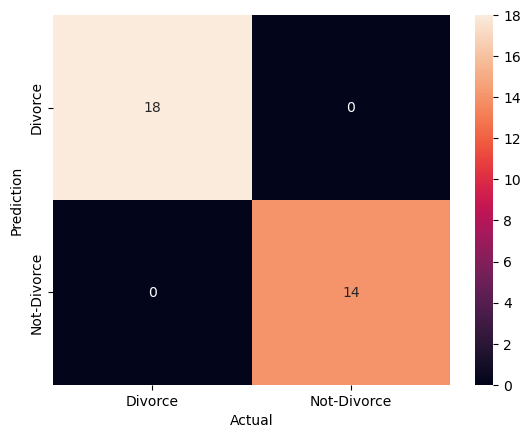

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        14

    accuracy                           1.00        32
   macro avg       1.00      1.00      1.00        32
weighted avg       1.00      1.00      1.00        32



In [43]:
df_compare = pd.DataFrame({'Actual':y_test, 'Prediction':y_pred})
sns.heatmap(confusion_matrix(df_compare['Actual'], df_compare['Prediction']), annot=True)
plt.xlabel('Actual')
plt.ylabel('Prediction')

plt.xticks(ticks=[0.5, 1.5], labels=['Divorce', 'Not-Divorce'])
plt.yticks(ticks=[0.5, 1.5], labels=['Divorce', 'Not-Divorce'])
plt.show()

print(classification_report(df_compare['Actual'], df_compare['Prediction']))

In [44]:
from sklearn.model_selection import cross_val_score, learning_curve
cv_scores = cross_val_score(model, x_train, y_train, cv=5)

# Print the cross-validation scores
print("Cross-validation scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

Cross-validation scores: [1.   0.96 0.96 0.92 1.  ]
Mean CV Score: 0.968


In [46]:
plt.style.use('seaborn')

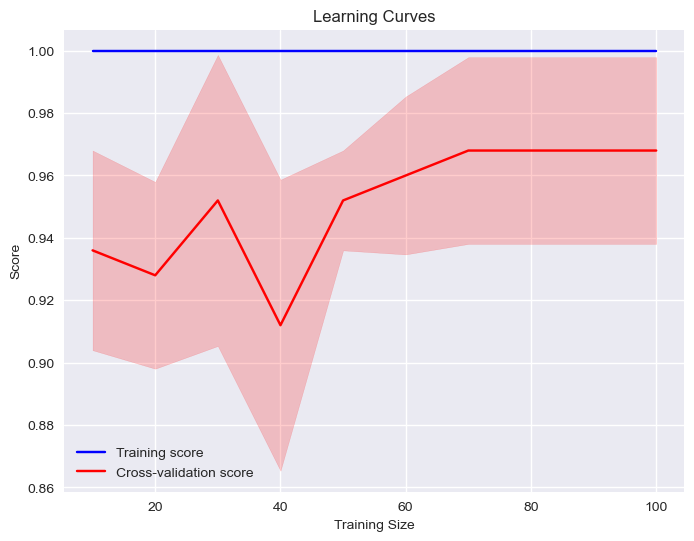

In [47]:
# Create a function to plot learning curves
def plot_learning_curves(model, X, y):
    train_sizes, train_scores, test_scores = learning_curve(
        model, X, y, cv=5, train_sizes=np.linspace(0.1, 1.0, 10)
    )

    # Calculate mean and standard deviation for training and testing scores
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    # Plot learning curves
    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_mean, label="Training score", color="blue")
    plt.fill_between(
        train_sizes,
        train_mean - train_std,
        train_mean + train_std,
        alpha=0.2,
        color="blue",
    )
    plt.plot(train_sizes, test_mean, label="Cross-validation score", color="red")
    plt.fill_between(
        train_sizes,
        test_mean - test_std,
        test_mean + test_std,
        alpha=0.2,
        color="red",
    )
    plt.xlabel("Training Size")
    plt.ylabel("Score")
    plt.title("Learning Curves")
    plt.legend(loc="best")
    plt.show()

# Call the plot_learning_curves function with your model and data
plot_learning_curves(model, x_train, y_train)

In [50]:
# select best model : XGBoost - treatment 6
model = LogisticRegression()
x_train, x_test, y_train, y_test = split_data_2(t_03_train, t_03_test, 'Divorce')

model.fit(x_train, y_train)
y_pred = model.predict(x_test)
df_compare = pd.DataFrame({'Actual':y_test, 'Prediction':y_pred})

cv_scores = cross_val_score(model, x_train, y_train, cv=5)
# Print the cross-validation scores
print("Cross-validation scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

Cross-validation scores: [1.         0.92592593 0.96296296 1.         1.        ]
Mean CV Score: 0.9777777777777779


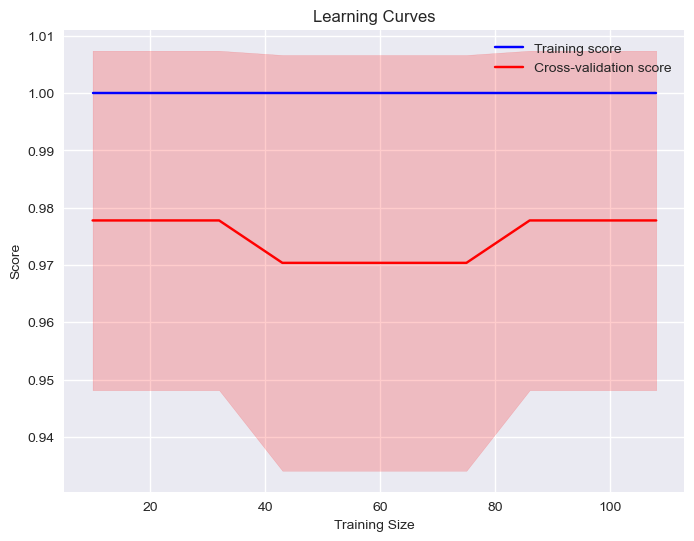

In [51]:
plot_learning_curves(model, x_train, y_train)

Cross-validation scores: [1.         0.92592593 0.96296296 1.         1.        ]
Mean CV Score: 0.9777777777777779


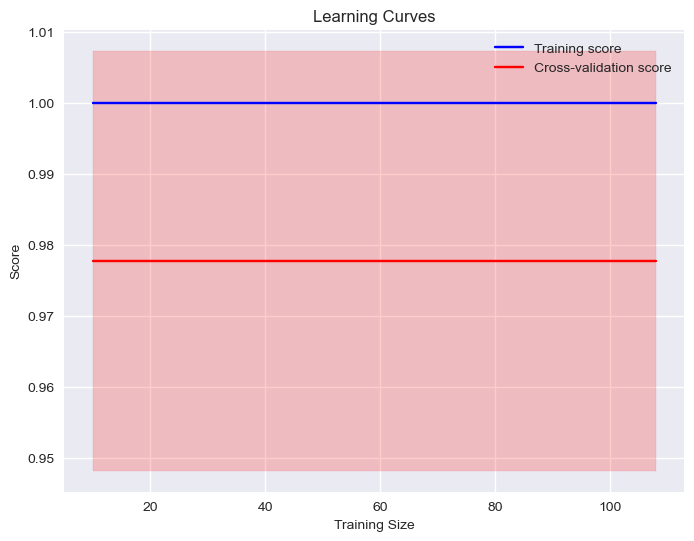

In [62]:
# select best model : XGBoost - treatment 6
model = RandomForestClassifier()
x_train, x_test, y_train, y_test = split_data_2(t_05_train, t_05_test, 'Divorce')

model.fit(x_train, y_train)
y_pred = model.predict(x_test)
df_compare = pd.DataFrame({'Actual':y_test, 'Prediction':y_pred})

cv_scores = cross_val_score(model, x_train, y_train, cv=5)
# Print the cross-validation scores
print("Cross-validation scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

plot_learning_curves(model, x_train, y_train)

Cross-validation scores: [1.   0.96 0.96 0.92 1.  ]
Mean CV Score: 0.968


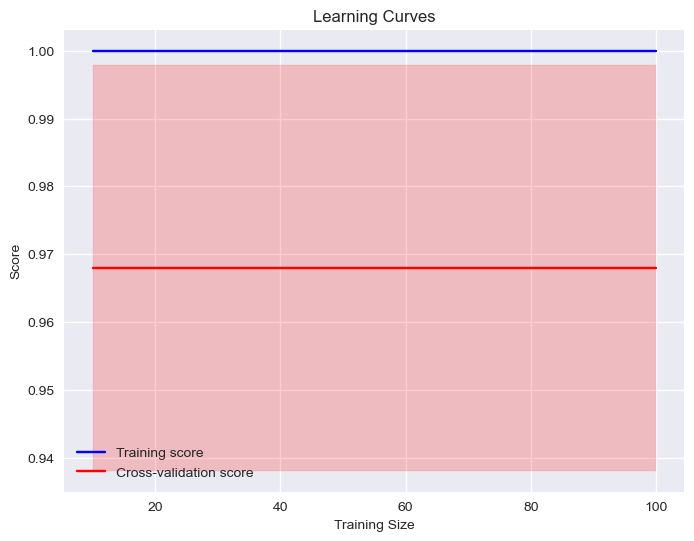

In [64]:
model = StackingClassifier(estimators=[
                                ('lr', LogisticRegression()),
                                ('rf', RandomForestClassifier()),
                                ('knn', KNeighborsClassifier())
                                ])
                           
x_train, x_test, y_train, y_test = split_data_2(t_08_train, t_08_test, 'Divorce')

model.fit(x_train, y_train)
y_pred = model.predict(x_test)
df_compare = pd.DataFrame({'Actual':y_test, 'Prediction':y_pred})

cv_scores = cross_val_score(model, x_train, y_train, cv=5)
# Print the cross-validation scores
print("Cross-validation scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

plot_learning_curves(model, x_train, y_train)

Cross-validation scores: [1.         0.92592593 0.96296296 1.         1.        ]
Mean CV Score: 0.9777777777777779


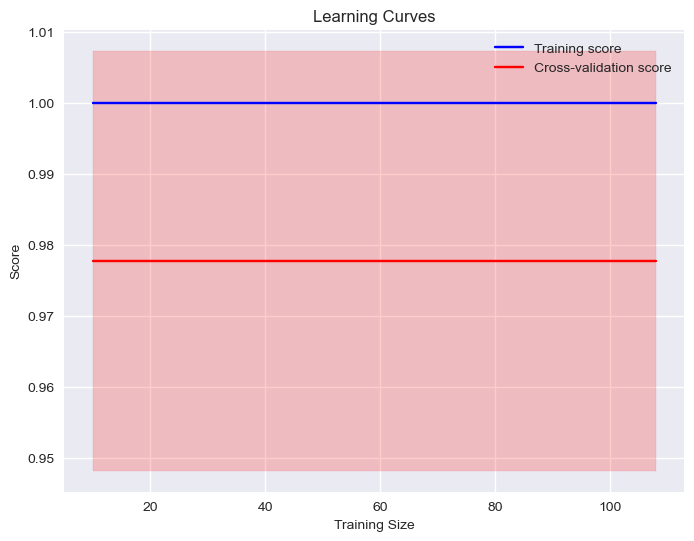

In [65]:
# FINAL best model : Random Forest - treatment 7 - more generalized model and less overfit
model = RandomForestClassifier()
x_train, x_test, y_train, y_test = split_data_2(t_07_train, t_07_test, 'Divorce')

model.fit(x_train, y_train)
y_pred = model.predict(x_test)
df_compare = pd.DataFrame({'Actual':y_test, 'Prediction':y_pred})

cv_scores = cross_val_score(model, x_train, y_train, cv=5)
# Print the cross-validation scores
print("Cross-validation scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

plot_learning_curves(model, x_train, y_train)

In [147]:
model

RandomForestClassifier()

In [69]:
import joblib

In [70]:
joblib.dump(model, 'model_randomforest_treatment6.pkl')

['model_randomforest_treatment6.pkl']

In [148]:
model_cek = joblib.load('model_randomforest_treatment6.pkl')

In [149]:
model_cek

RandomForestClassifier()

### Model Interpratation

<Axes: >

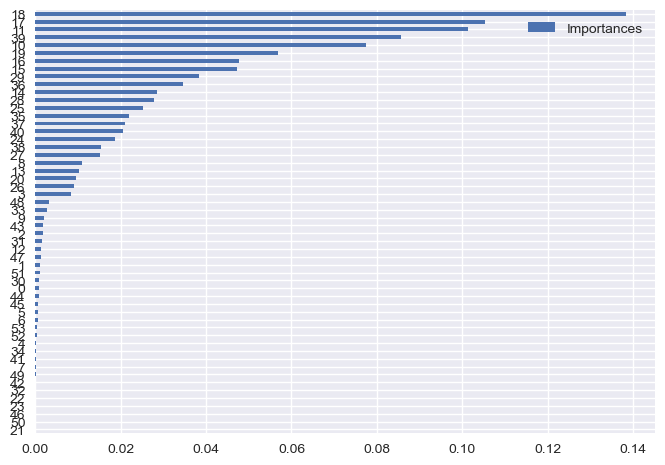

In [81]:
importances = pd.DataFrame({'Variables':x_test.columns, 'Importances':model.feature_importances_})
importances.sort_values('Importances').plot(kind='barh')

In [153]:
ref[(ref['atribute_id']==18)|(ref['atribute_id']==17)|(ref['atribute_id']==11)|(ref['atribute_id']==39)
    |(ref['atribute_id']==40)]

,atribute_id,description
10,11,"I think that one day in the future, when I look back, I see that my spouse and I have been in harmony with each other."
16,17,We share the same views about being happy in our life with my spouse
17,18,My spouse and I have similar ideas about how marriage should be
38,39,Our discussions often occur suddenly.
39,40,We're just starting a discussion before I know what's going on.


SyntaxError: illegal target for annotation (614026861.py, line 1)

In [76]:
import shap
import lime
import lime.lime_tabular

In [89]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(x_train)

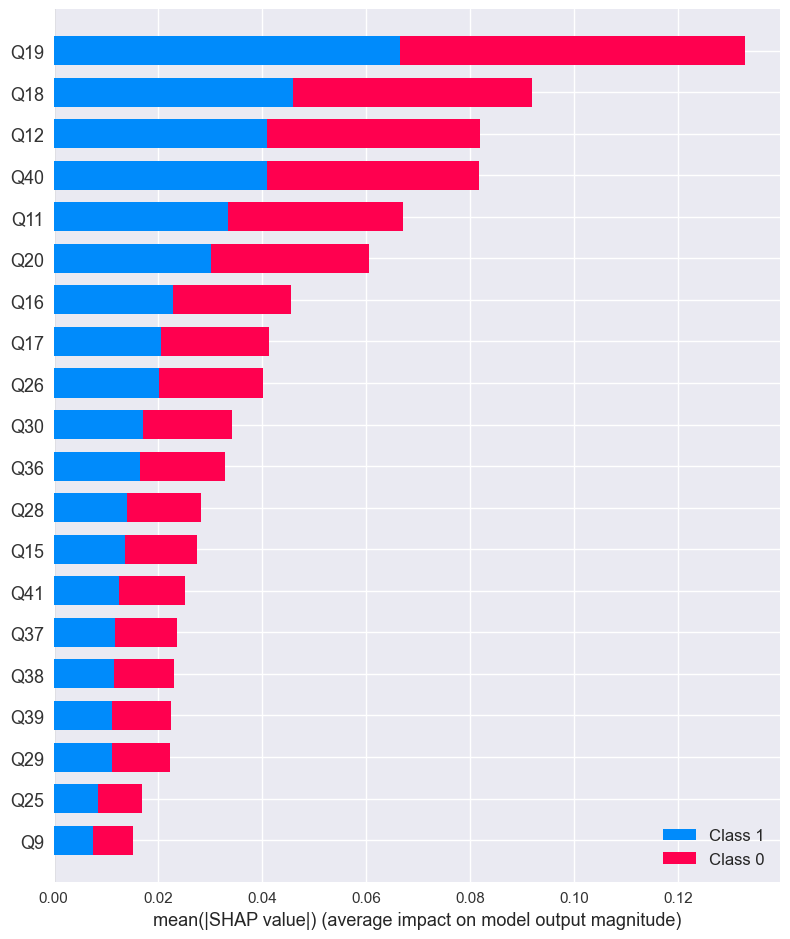

In [90]:
shap.summary_plot(shap_values, x_train, plot_type="bar")

In [91]:
ref[(ref['atribute_id']==19)|(ref['atribute_id']==18)|(ref['atribute_id']==12)|(ref['atribute_id']==40)]

,atribute_id,description
11,12,My spouse and I have similar values in terms of personal freedom.
17,18,My spouse and I have similar ideas about how marriage should be
18,19,My spouse and I have similar ideas about how roles should be in marriage
39,40,We're just starting a discussion before I know what's going on.


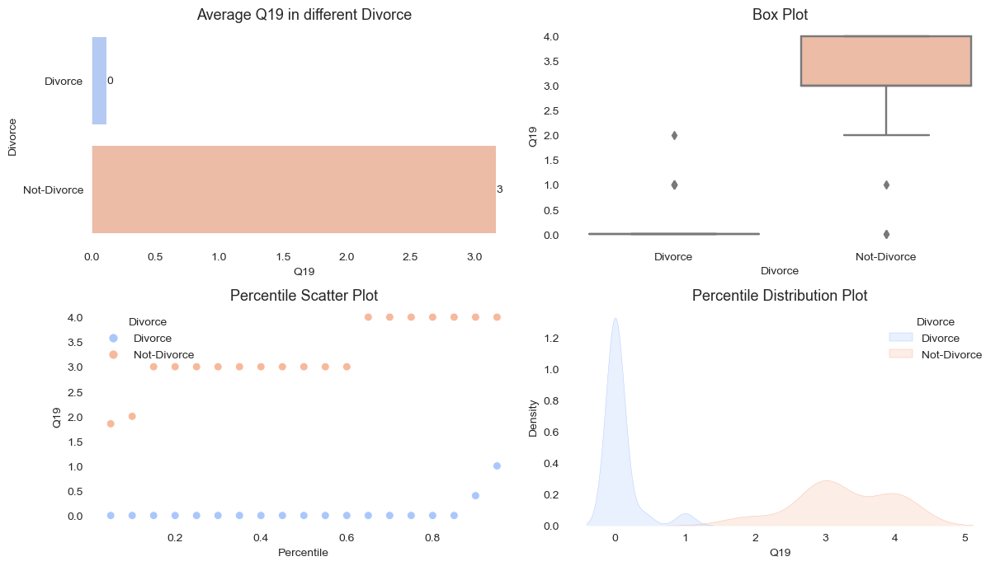

In [97]:
t_06_train_cat = t_06_train.copy()

t_06_train_cat['Divorce'] = t_06_train_cat['Divorce'].replace({0:'Divorce', 1:'Not-Divorce'})

eda.bivariate_analysis(t_06_train_cat, 'Divorce', 'Q19')

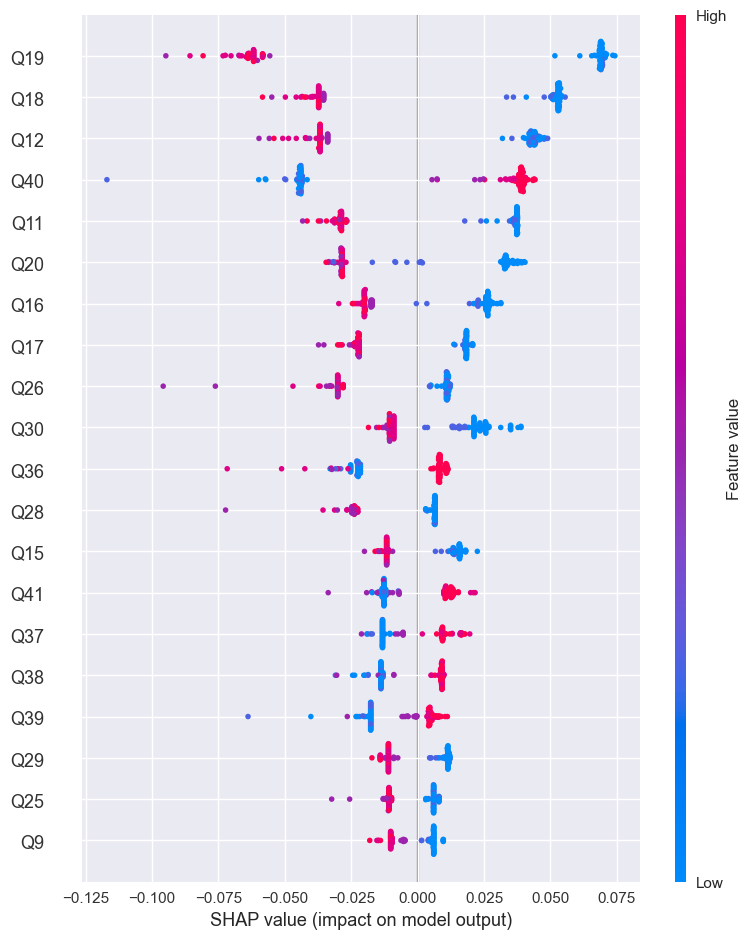

In [120]:
shap.summary_plot(shap_values[0], x_train)

In [113]:
ref

,atribute_id,description
0,1,"If one of us apologizes when our discussion deteriorates, the discussion ends."
1,2,"I know we can ignore our differences, even if things get hard sometimes."
2,3,"When we need it, we can take our discussions with my spouse from the beginning and correct it."
3,4,"When I discuss with my spouse, to contact him will eventually work."
4,5,The time I spent with my wife is special for us.
5,6,We don't have time at home as partners.
6,7,We are like two strangers who share the same environment at home rather than family.
7,8,I enjoy our holidays with my wife.
8,9,I enjoy traveling with my wife.
9,10,Most of our goals are common to my spouse.


In [143]:
# Select a specific instance to explain (index of the test set)
instance_idx = 8
instance_to_explain = x_test.iloc[instance_idx]

# Create the force plot for the selected instance
shap.force_plot(explainer.expected_value[1], shap_values[1][instance_idx], instance_to_explain)

In [152]:
shap.force_plot(explainer.expected_value[1], shap_values[1][instance_idx], instance_to_explain).html()

'\n<div id=\'i3C20AX4KTIU5ZY0LS7W3\'>\n<div style=\'color: #900; text-align: center;\'>\n  <b>Visualization omitted, Javascript library not loaded!</b><br>\n  Have you run `initjs()` in this notebook? If this notebook was from another\n  user you must also trust this notebook (File -> Trust notebook). If you are viewing\n  this notebook on github the Javascript has been stripped for security. If you are using\n  JupyterLab this error is because a JupyterLab extension has not yet been written.\n</div></div>\n <script>\n   if (window.SHAP) SHAP.ReactDom.render(\n    SHAP.React.createElement(SHAP.AdditiveForceVisualizer, {"outNames": ["f(x)"], "baseValue": 0.4692647058823528, "outValue": 0.9999999999999999, "link": "identity", "featureNames": ["Q1", "Q2", "Q3", "Q4", "Q5", "Q6", "Q7", "Q8", "Q9", "Q10", "Q11", "Q12", "Q13", "Q14", "Q15", "Q16", "Q17", "Q18", "Q19", "Q20", "Q21", "Q22", "Q23", "Q24", "Q25", "Q26", "Q27", "Q28", "Q29", "Q30", "Q31", "Q32", "Q33", "Q34", "Q35", "Q36", "Q37",

In [129]:
df_compare['proba'] = model.predict_proba(x_test)[:, 1]

In [130]:
df_compare

,Actual,Prediction,proba
139,0,0,0.06
30,1,1,1.00
119,0,0,0.09
29,1,1,1.00
144,0,0,0.21
163,0,0,0.12
166,0,0,0.07
51,1,1,1.00
105,0,0,0.01
60,1,1,1.00


In [145]:
len(x_train.columns)

54

In [146]:
ref.to_csv('variable_definitions.csv', index=False)